In [2]:
library(ggplot2)
library(reshape)
library(gplots)
library(RColorBrewer)
library(see)
library(eulerr)

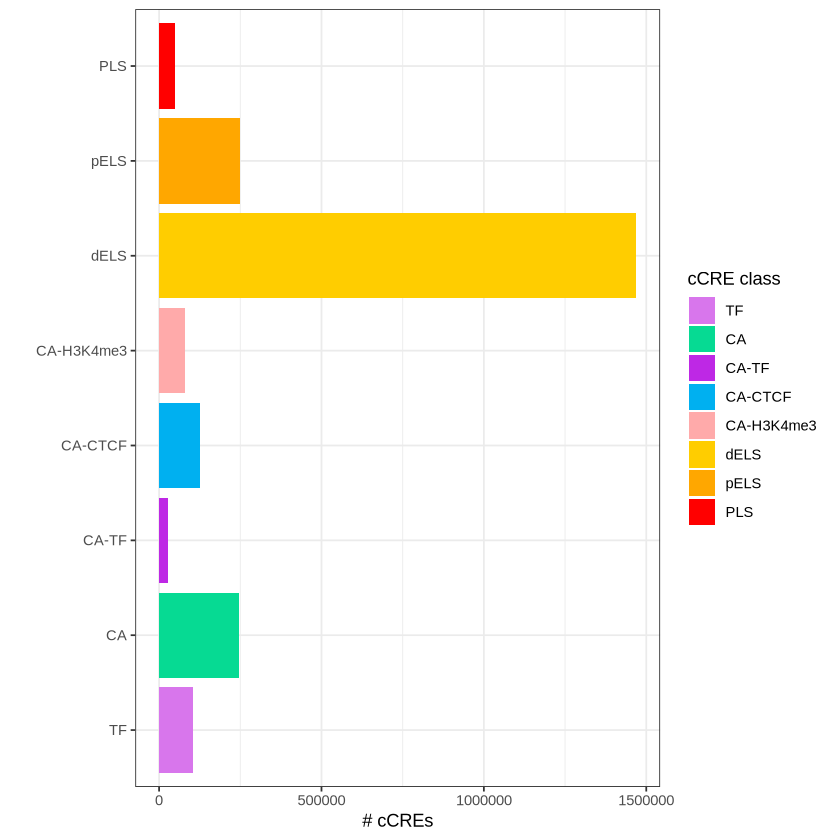

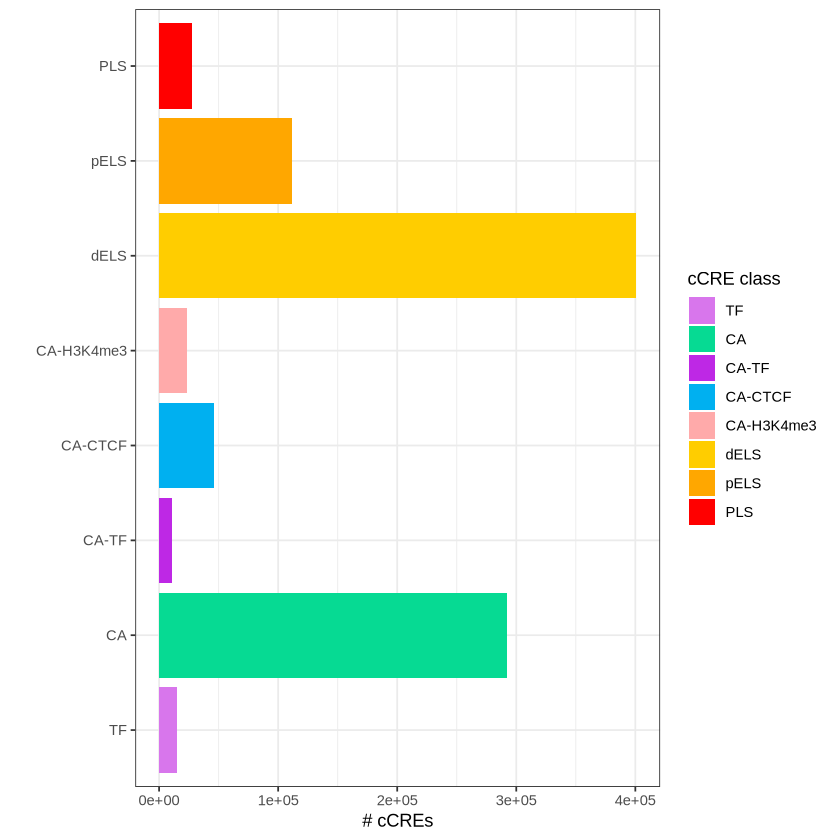

In [28]:
## Figure 1c

data = read.table("../hg38-cCREs-Unfiltered.bed")
data$V6=factor(data$V6,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF")))
ggplot(data, aes(y=V6, fill=V6)) + geom_bar() +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec"))) +
    xlab("# cCREs") + theme_bw() + ylab("")

data = read.table("../../V7-mm10/mm10-cCREs-Unfiltered.bed")
data$V6=factor(data$V6,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF")))
ggplot(data, aes(y=V6, fill=V6)) + geom_bar() +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec"))) +
    xlab("# cCREs") + theme_bw() + ylab("")

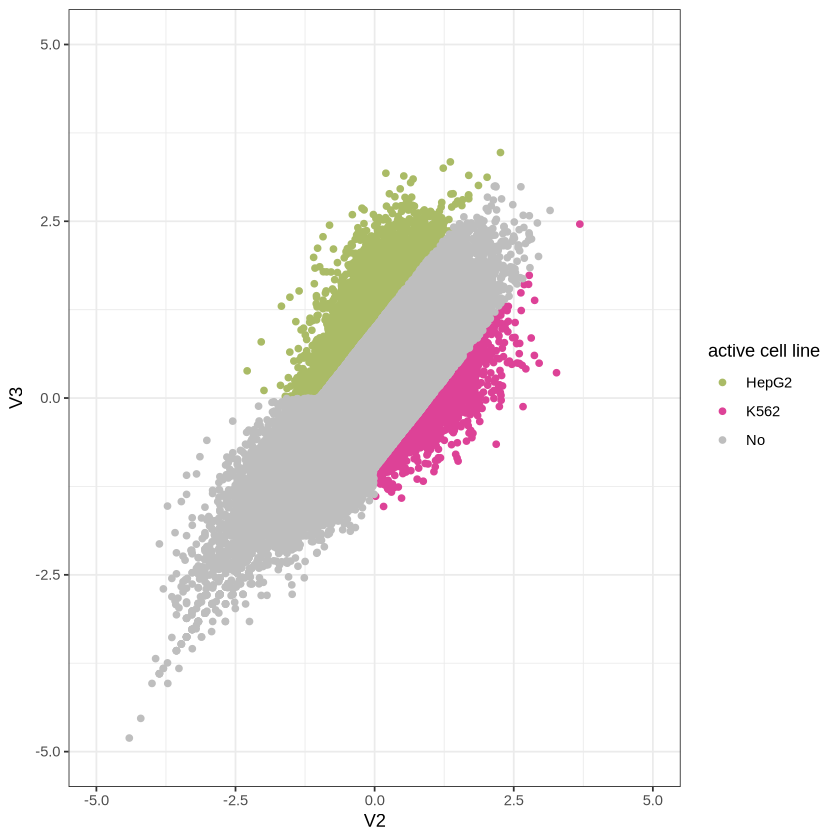

In [18]:
## Figure 2a

data = read.table("2_Functional-Characterization/Figure-Input-Data/Figure-2a.STARR-Cross-Cell-Enhancer.txt")

ggplot(data, aes(x=V2, y=V3, color=V4)) + geom_point() + theme_bw() +
    coord_cartesian(x=c(-5,5),y=c(-5,5)) + 
    scale_color_manual(name = "active cell line", values=c("#aabb66", "#dd4297","gray"))

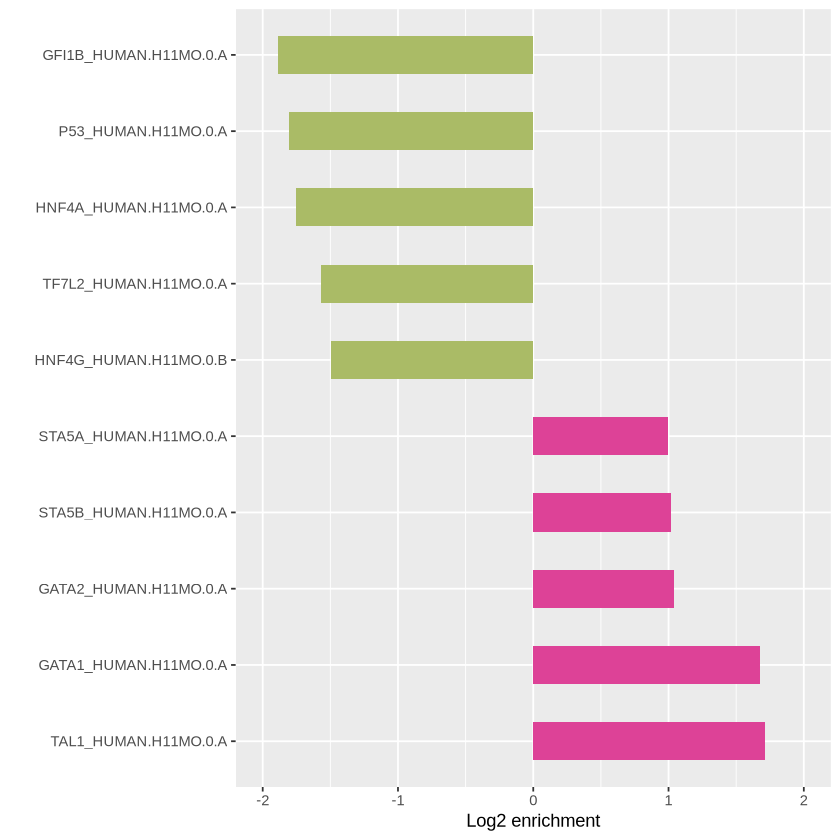

In [47]:
## Figure 2b

data = read.table("2_Functional-Characterization/Figure-Input-Data/Figure-2b.Top-STARR-Cross-Cell-Motif-Enrichment.txt")

colors=c("#aabb66","#aabb66","#dd4297","#dd4297","#dd4297","#dd4297","#aabb66","#aabb66","#aabb66","#dd4297")

ggplot(data, aes(y=rev(reorder(V1, -log2(V11))), x=-log2(V11), fill=V1)) + 
    geom_bar(stat="identity", width=0.5) + coord_cartesian(x=c(-2,2)) +
    scale_fill_manual(values=colors) + theme(legend.position="none") +
    ylab("") + xlab("Log2 enrichment")


	Fisher's Exact Test for Count Data

data:  data[1:2, c(3, 5)]
p-value = 0.83
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.3619676 2.4356597
sample estimates:
odds ratio 
  0.917151 



	Fisher's Exact Test for Count Data

data:  data[3:4, c(3, 5)]
p-value = 0.0243
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 0.002997238 0.853971149
sample estimates:
odds ratio 
  0.127676 



	Fisher's Exact Test for Count Data

data:  data[c(1, 3), c(3, 5)]
p-value = 0.001636
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
   2.129945 914.027743
sample estimates:
odds ratio 
  18.63936 


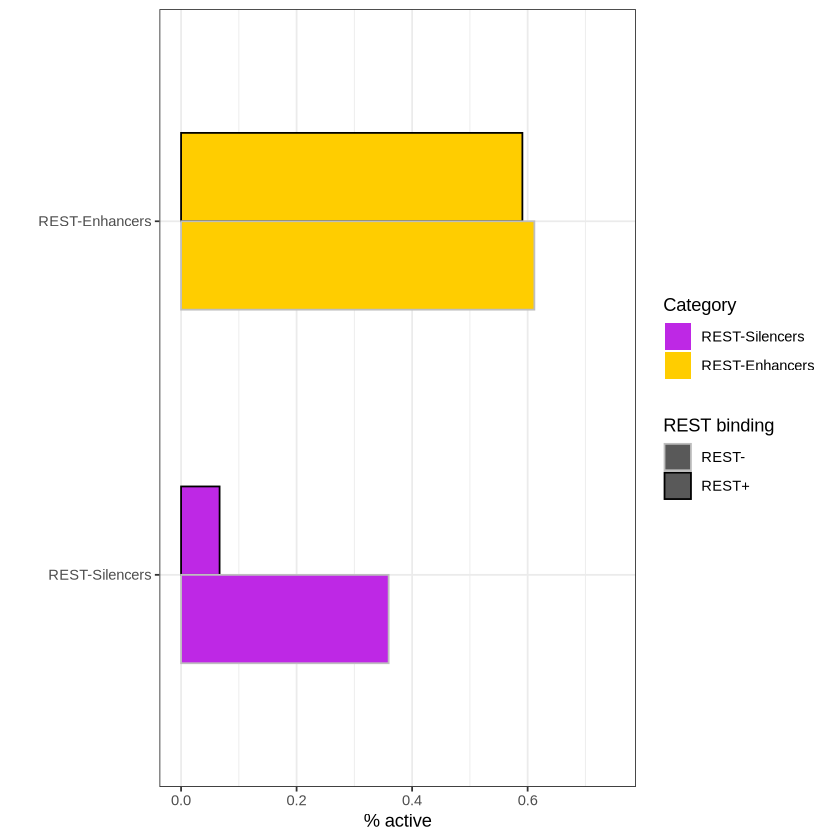

In [20]:
## Figure 3d

data = read.table("3_Silencers//Figure-Input-Data/Figure-3d.REST-Silencer-VISTA.txt")
data$V2=factor(data$V2,levels = c("REST-", "REST+"))
data$V1=factor(data$V1,levels = c("REST-Silencers", "REST-Enhancers"))
ggplot(data, aes(x=V4, y=V1, color=V2, fill=V1)) + geom_bar(stat="identity", position="dodge", width=0.5) + 
    theme_bw() + coord_cartesian(x=c(0,0.75)) + ylab("") + xlab("% active") +
    scale_color_manual(name = "REST binding", values=c("gray","black")) +
    scale_fill_manual(name = "Category", values=c("#be28e5","#ffcd00"))

## enhancer p-value
fisher.test(data[1:2,c(3,5)])

## silencer p-value
fisher.test(data[3:4,c(3,5)])

## REST+ p-value
fisher.test(data[c(1,3),c(3,5)])

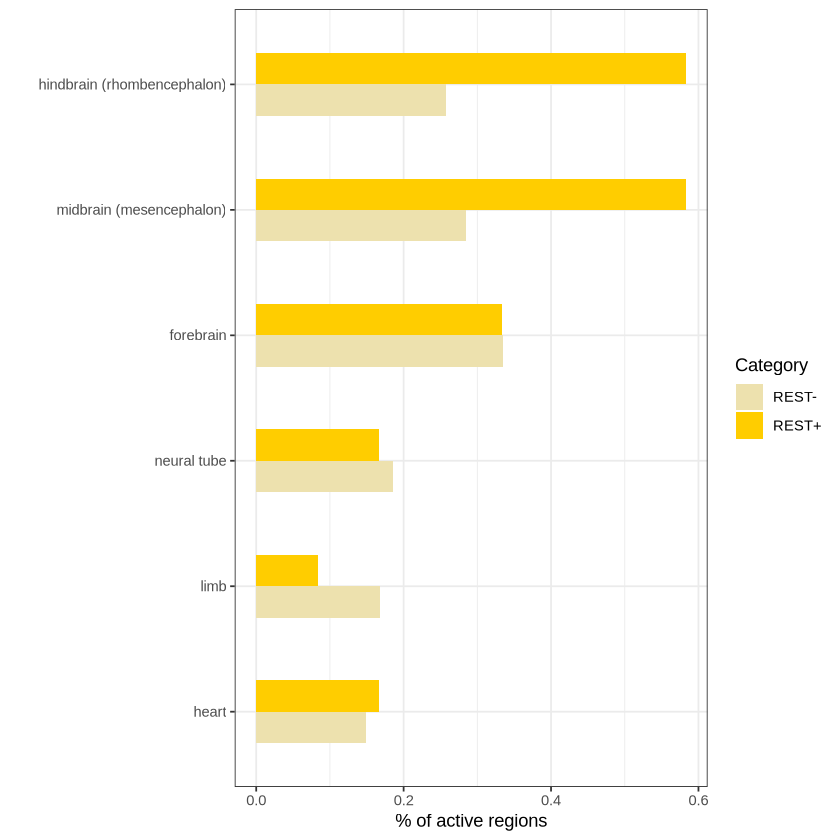

In [49]:
## Figure 3e

data = read.table("3_Silencers/Figure-Input-Data/Figure-3e.REST-Silencer-VISTA-Enrichment.txt", sep="\t")
data$V1=factor(data$V1,levels = rev(data$V1))
names(data)=c("tissue","REST+","REST-","p")
meltedData=melt(data[,1:3], id="tissue")
meltedData$variable=factor(meltedData$variable,levels = rev(c("REST+","REST-"))) 
ggplot(meltedData, aes(x=value, y=tissue, fill=variable)) + geom_bar(stat="identity", position="dodge", width=0.5) +
    ylab("") + xlab("% of active regions") + scale_fill_manual(name = "Category", values=c("#ede1ae","#ffcd00")) + 
    theme_bw()




	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

               Background REST-Enhancers
REST-Enhancers <2e-16     -             
REST-Silencers <2e-16     <2e-16        

P value adjustment method: holm 

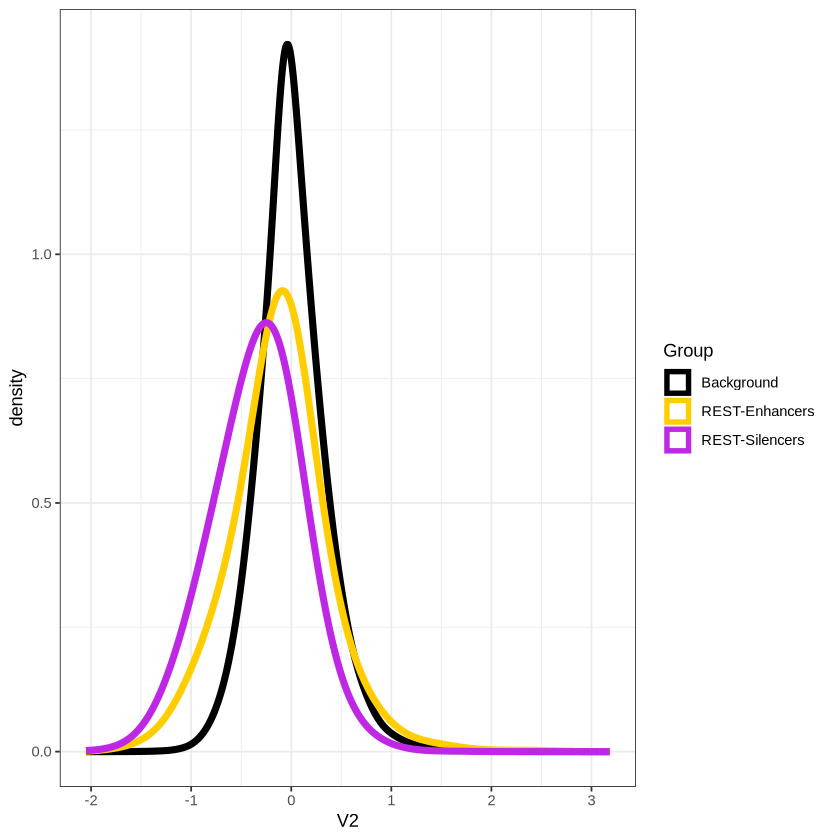

In [59]:
## Figure 3f

data = read.table("3_Silencers/Figure-Input-Data/Figure-3f.REST-STARR-Scores.txt")
ggplot(data, aes(x=V2, color=V3)) + geom_density(adjust=3, linewidth=2) + theme_bw() +
    scale_color_manual(name="Group",values=c("black","#ffcd00","#be28e5"))

pairwise.wilcox.test(data$V2, data$V3)

,V1,V2,V3,V4,V5,V6,V7,V8
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ENCSR000AKP,ENCFF849TDM,Homo_sapiens_K562_ENCDO000AAD,0.5143,0.3001,5.668788,0.0000,0.00000000
2,ENCSR077YUA,ENCFF573FQS,Homo_sapiens_B_cell_male_adult_22_years_ENCDO383AQS,0.3929,0.3211,1.956638,0.0504,0.13488000
3,ENCSR561KOM,ENCFF256WHR,"Homo_sapiens_CD4-positive,_alpha-beta_T_cell_male_adult_21_years_ENCDO190HXC",0.3429,0.2862,1.602124,0.1091,0.18353070
4,ENCSR981UJA,ENCFF764VSN,Homo_sapiens_right_lobe_of_liver_tissue_female_adult_53_years_ENCDO793LXB,0.4929,0.3844,2.844008,0.0045,0.07637436
5,ENCSR507UDH,ENCFF347LDC,Homo_sapiens_hepatocyte_originated_from_H9_ENCDO222AAA,0.4643,0.3711,2.379455,0.0173,0.09835000
6,ENCSR342KXD,ENCFF982IVZ,Homo_sapiens_heart_right_ventricle_tissue_male_adult_43_years_ENCDO967KID,0.4357,0.3685,1.789709,0.0735,0.15140000


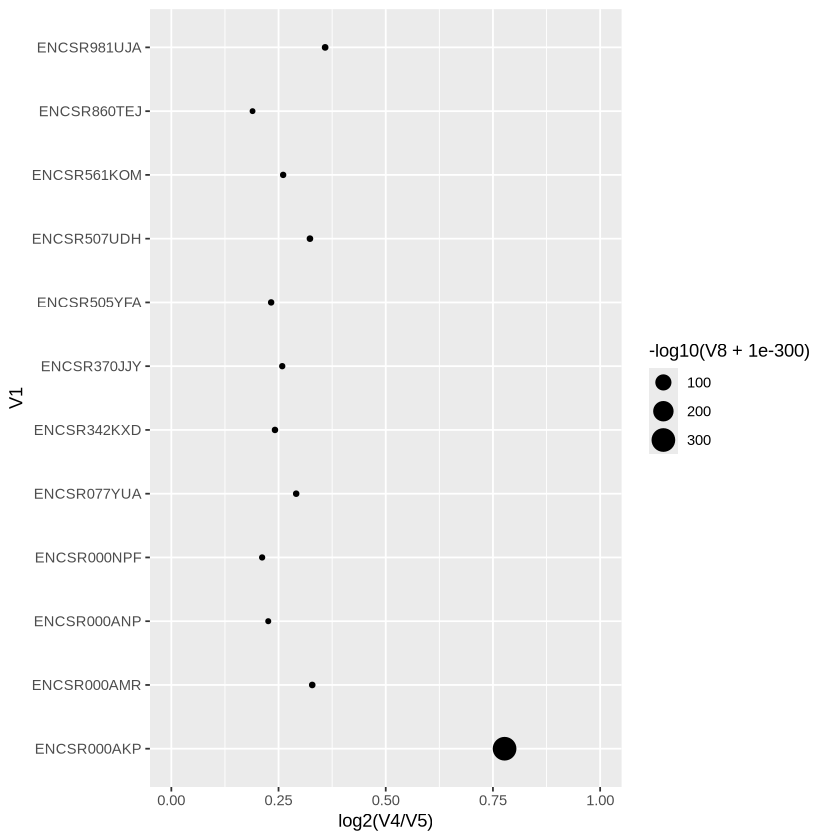

In [14]:
## Figure 4b
data = read.table("5_Use-Case/Figure-Input-Data/Figure-4b.Biosample-Enrichment.txt")
head(data)

ggplot(data, aes(x=log2(V4/V5), y=V1, size=-log10(V8+1E-300))) + geom_point() + coord_cartesian(x=c(0,1))


,V1,V2,V3,V4
,<chr>,<chr>,<chr>,<chr>
1,EH38E1940010,ENSG00000105610,KLF1,RNAPII-ChIAPET
2,EH38E3291322,ENSG00000105612,DNASE2,RNAPII-ChIAPET
3,EH38E3291322,ENSG00000267735,ENSG00000267735,RNAPII-ChIAPET
4,EH38E3291355,ENSG00000161860,SYCE2,RNAPII-ChIAPET
5,EH38E3291355,ENSG00000266721,MIR5695,RNAPII-ChIAPET
6,EH38E3291355,ENSG00000179284,DAND5,CTCF-ChIAPET


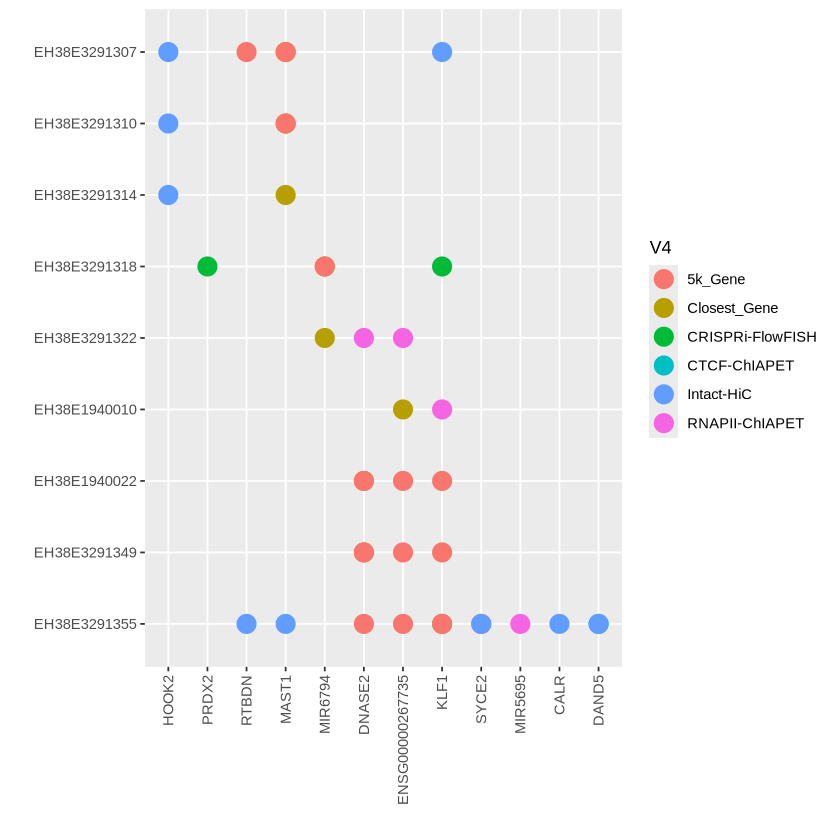

In [3]:
## Figure 4c

data = read.table("5_Use-Case/Figure-Input-Data/Figure-4c.RBC-Linked-Genes.txt")
head(data)
data$V1=factor(data$V1,levels = rev(c("EH38E3291307","EH38E3291310","EH38E3291314","EH38E3291318","EH38E3291322","EH38E1940010","EH38E1940022","EH38E3291349","EH38E3291355")))
data$V3=factor(data$V3,levels =c("HOOK2","PRDX2","RTBDN","MAST1","MIR6794","DNASE2","ENSG00000267735","KLF1","SYCE2","MIR5695","CALR","DAND5"))

ggplot(data, aes(x=V3, y=V1, color=V4)) + geom_point(size=5) + ylab("") + xlab("") + 
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))



,gene,K562,B_cell_male_adult_.22_years.,CD4.positive._alpha.beta_T_cell,right_lobe_of_liver_tissue_female_adult_53_years_ENCDO793LXB,hepatocyte_originated_from_H9_ENCDO222AAA,heart_right_ventricle_tissue,cardiac_muscle_cell_originated_from_RUES2_ENCDO924HBJ,upper_lobe_of_left_lung_tissue_male_adult_37_years_ENCDO845WKR,fibroblast_of_lung_female_child_11_years_and_male_adult_45_years_ENCDO269AAA,middle_frontal_area_46_tissue_female_adult_90_or_above_years_ENCDO006DAA,excitatory_neuron_ENCDO336AAA,H1,GM23338
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HOOK2,ENSG00000095066,9.43,13.58,5.28,2.86,11.07,27.45,18.36,3.22,5.86,17.13,16.37,32.27,37.57
KLF1,ENSG00000105610,53.70,0.00,0.00,0.00,0.00,0.06,0.17,0.00,0.00,0.00,0.07,0.31,0.23
DNASE2,ENSG00000105612,29.73,10.78,3.97,5.90,7.88,9.96,18.37,4.64,21.36,7.56,3.22,14.25,19.80
MAST1,ENSG00000105613,7.48,0.16,0.08,0.01,0.08,0.32,2.65,0.00,0.18,41.40,93.77,11.88,11.89
RTBDN,ENSG00000132026,0.94,0.00,0.00,0.00,0.08,0.00,0.00,0.00,0.04,3.11,1.95,1.66,0.98
SYCE2,ENSG00000161860,1.00,0.06,1.24,0.03,0.02,0.08,0.38,0.01,0.35,0.00,0.24,0.43,1.06


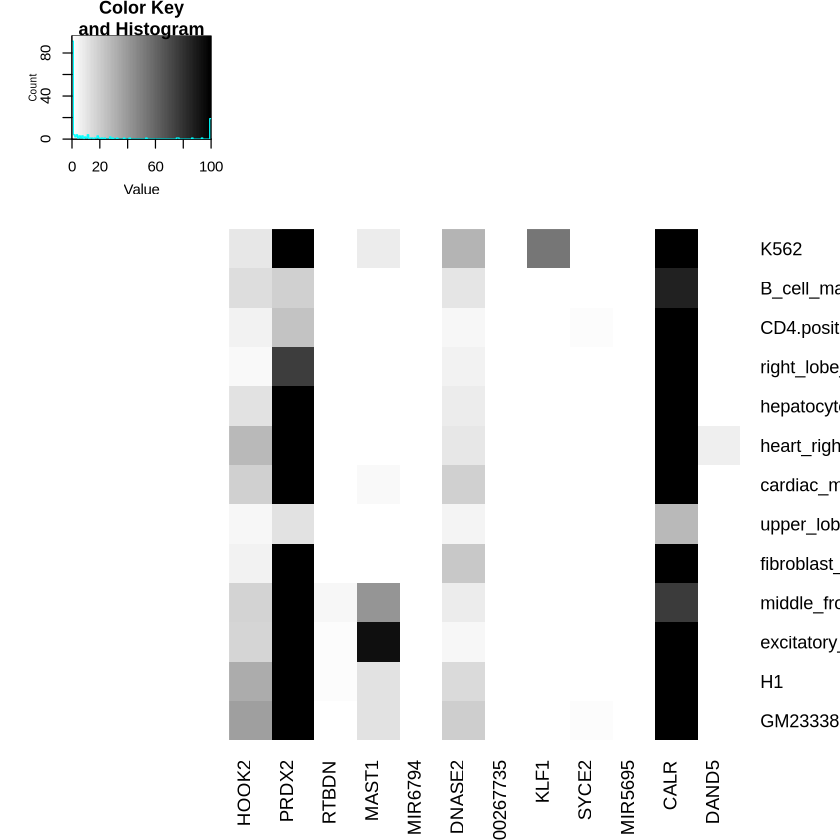

In [3]:
## Figure 4d

data = read.table("5_Use-Case/Figure-Input-Data/Figure-4d.RBC-Linked-Genes-Expression.txt", row.names=2, header=T)
head(data)
subData=data[c(1,7,5,4,12,3,11,2,6,10,8,9),2:14]
breaks=seq(0,100,1)
colors=colorRampPalette(c("white","black"))(100)

heatmap.2(t(data.matrix(subData)), breaks=breaks, col=colors, trace="none", Rowv="NA", Colv="NA", dendrogram="none")



In [ ]:
## Extended Data 1a

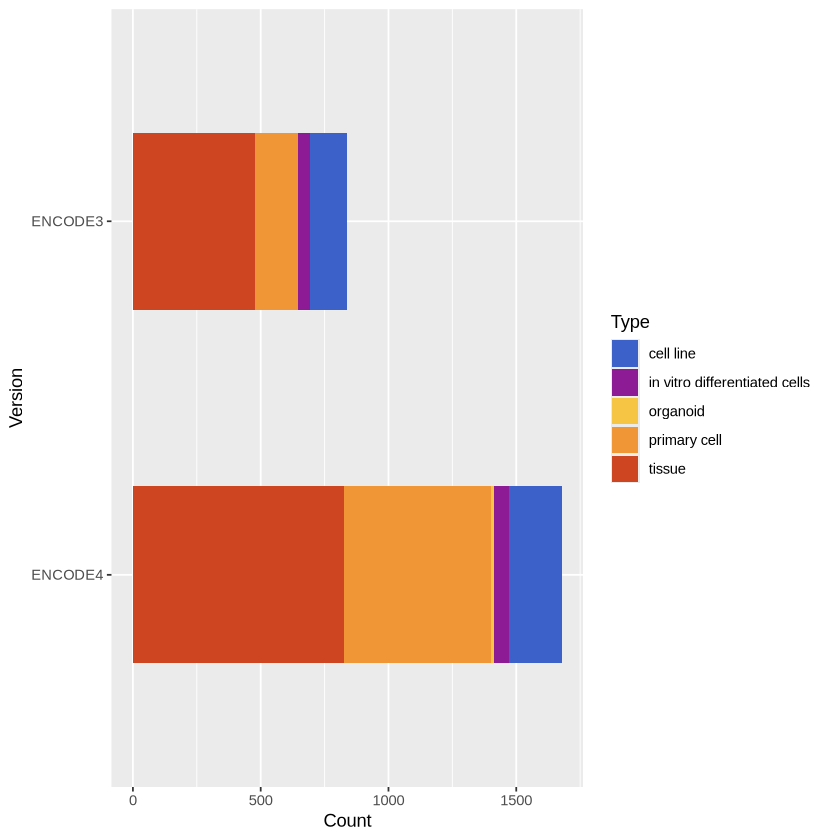

In [23]:
## Extended Data 1b
data = read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-1b.Registry-Biosample-Increase.txt", header=T, sep="\t")

data$Version = gsub("V5", "ENCODE3", data$Version)
data$Version = gsub("V7", "ENCODE4", data$Version)

data$Version=factor(data$Version,levels =c("ENCODE4","ENCODE3"))


ggplot(data, aes(y=Version, x=Count, fill=Type))+geom_bar(width = 0.5, stat="identity") +
    scale_fill_manual(values=rev(c("#cd4621", "#f09636", "#f6c543", "#8e1b96", "#3c61c8"))) 


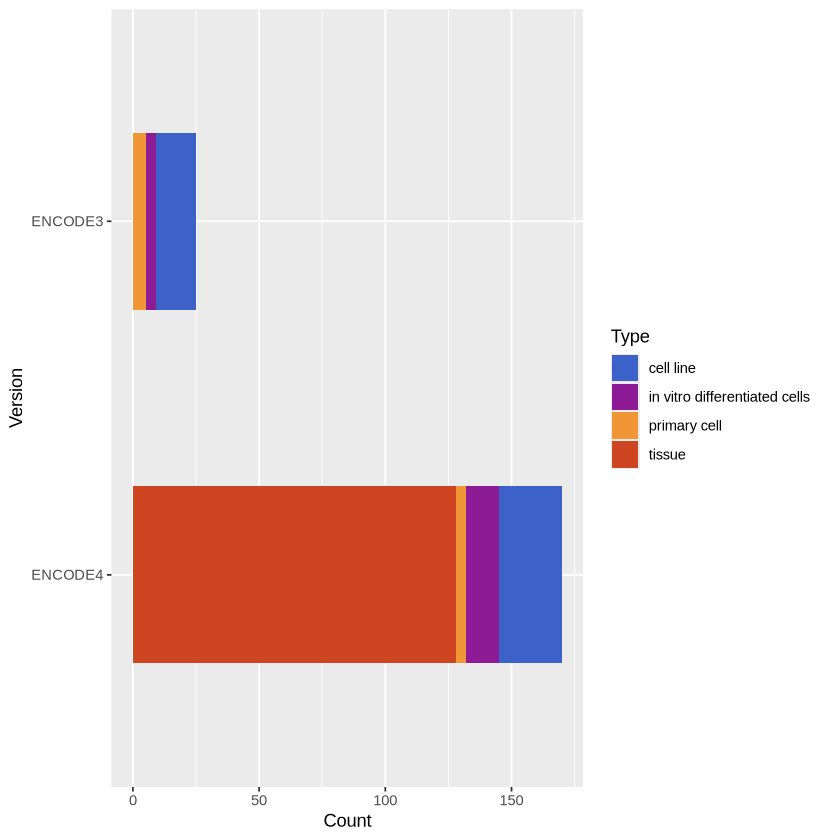

In [25]:
## Extended Data 1b
data = read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-1c.Registry-Core-Increase.txt", header=T, sep="\t")

data$Version = gsub("V5", "ENCODE3", data$Version)
data$Version = gsub("V7", "ENCODE4", data$Version)

data$Version=factor(data$Version,levels =c("ENCODE4","ENCODE3"))


ggplot(data, aes(y=Version, x=Count, fill=Type))+geom_bar(width = 0.5, stat="identity") +
    scale_fill_manual(values=rev(c("#cd4621", "#f09636", "#8e1b96", "#3c61c8"))) 

,V1,V2,V3,V4,V5,V6,V7
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,EH38E0070245,dELS,4.547082,2.7837532,0.557823,0.0204082,0.13
2,EH38E0114249,dELS,7.139862,5.7142110,0.514184,0.0354610,0.27
3,EH38E0177590,dELS,7.806027,0.3617002,0.482759,0.0287356,0.25
4,EH38E0262800,dELS,9.156804,-1.1884173,0.390845,0.0000000,0.00
5,EH38E0478284,CA-H3K4me3,0.482929,7.1359406,0.684783,0.1666670,0.74
6,EH38E0488851,dELS,8.023695,10.2796980,0.441509,0.0150943,0.15


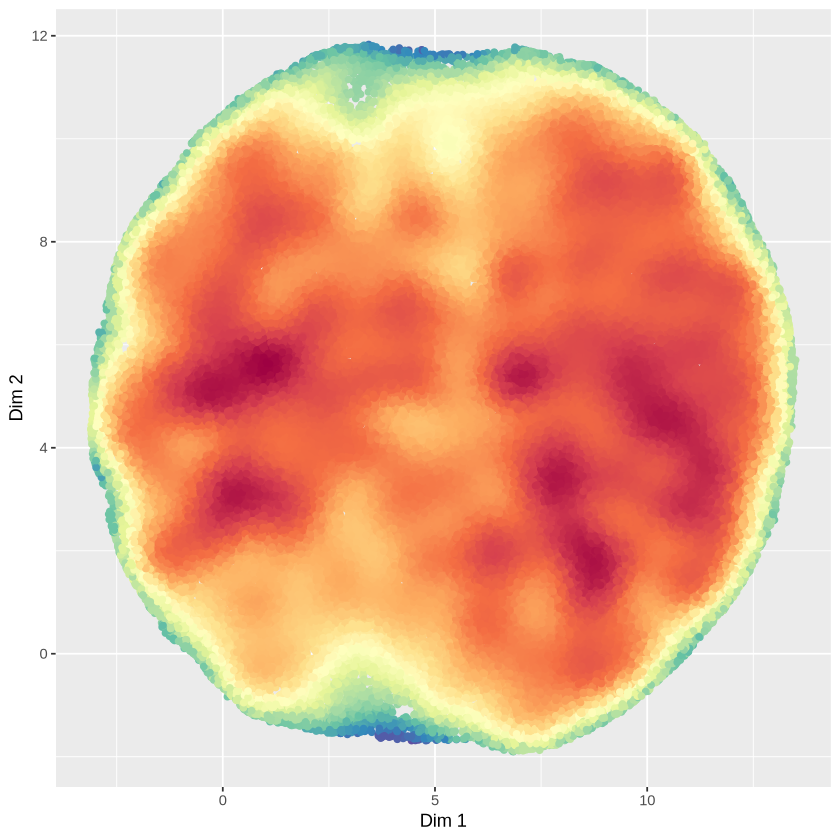

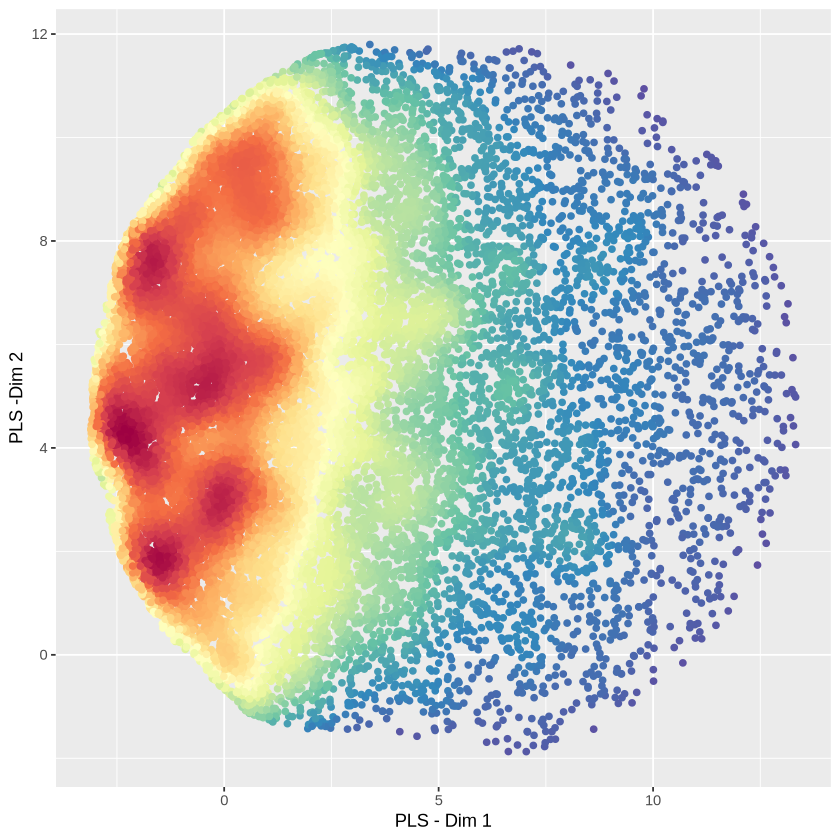

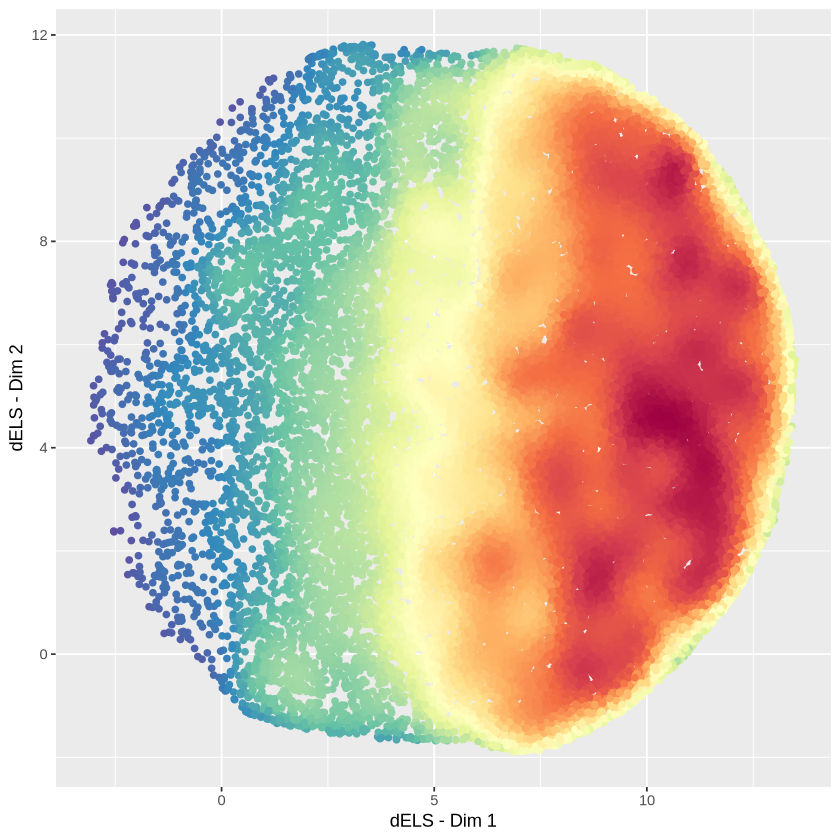

In [11]:
## Extended Data Figure 2b

data=read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-2c.VAE-GC-K562.txt")

#All
df = data.frame(x = data$V3, y = data$V4, d = densCols(data$V3, data$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2")

#PLS
pls = data[data$V2 == "PLS",]
df = data.frame(x = pls$V3, y = pls$V4, d = densCols(pls$V3, pls$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("PLS - Dim 1") + ylab("PLS -Dim 2")

#dels
dels = data[data$V2 == "dELS",]
df = data.frame(x = dels$V3, y = dels$V4, d = densCols(dels$V3, dels$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("dELS - Dim 1") + ylab("dELS - Dim 2")




	Pearson's product-moment correlation

data:  data$V3 and data$V5
t = -800.28, df = 103201, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.9288626 -0.9271692
sample estimates:
       cor 
-0.9280207 


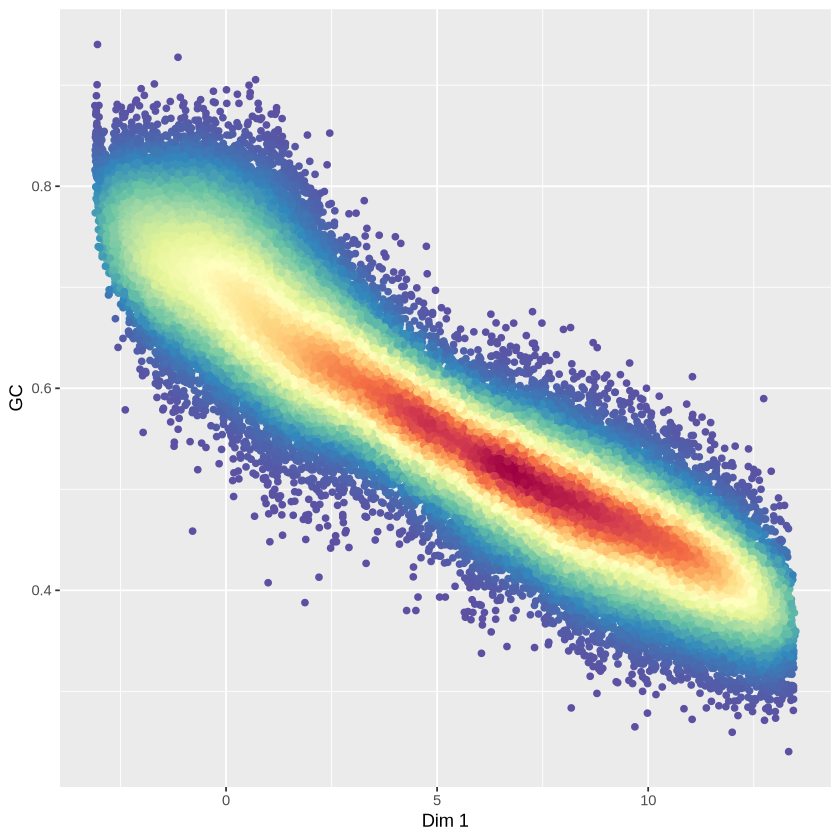

In [34]:
## Extended Data Figure 2c

data=read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-2c.VAE-GC-K562.txt")
df = data.frame(x = data$V3, y = data$V5, d = densCols(data$V3, data$V5, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("GC")

cor.test(data$V3,data$V5)


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V12 and data$V14 

               None   PROcap PacBio lncRNA
PROcap         <2e-16 -      -      -     
PacBio         <2e-16 1e-06  -      -     
lncRNA         <2e-16 <2e-16 <2e-16 -     
protein_coding <2e-16 <2e-16 <2e-16 <2e-16

P value adjustment method: holm 

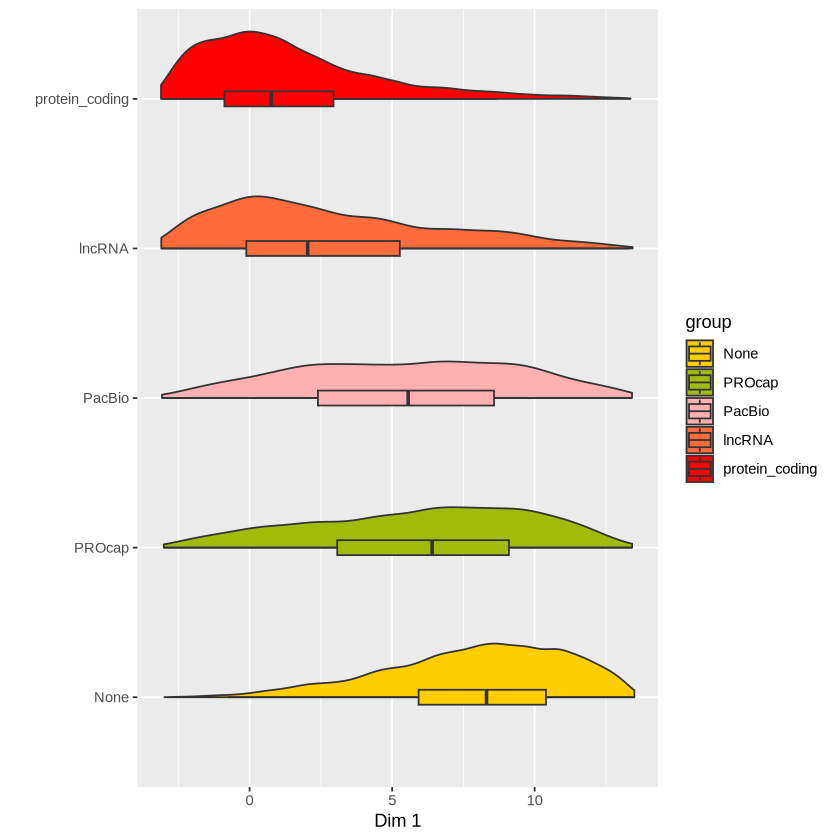

In [2]:
## Extended Data Figure 2d

data=read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-2d.VAE-cCRE-Breakdown.txt")

data$V14=factor(data$V14,levels =rev(c("protein_coding","lncRNA","PacBio","PROcap", "None")))

ggplot(data, aes(x=V14, y=V12, fill=V14)) + geom_violinhalf() + coord_flip() + geom_boxplot(width=0.1, outlier.shape=NA) +
    scale_fill_manual(name="group",values=rev(c("#ff0000","#ff6b3a", "#ffb1b1","#a1bb0b","#ffcd00"))) + xlab("") +
    ylab("Dim 1")

pairwise.wilcox.test(data$V12,data$V14, padj="fdr")


GATA1 HNF4A   P53 GFI1B 
  610  1021  1137   781 

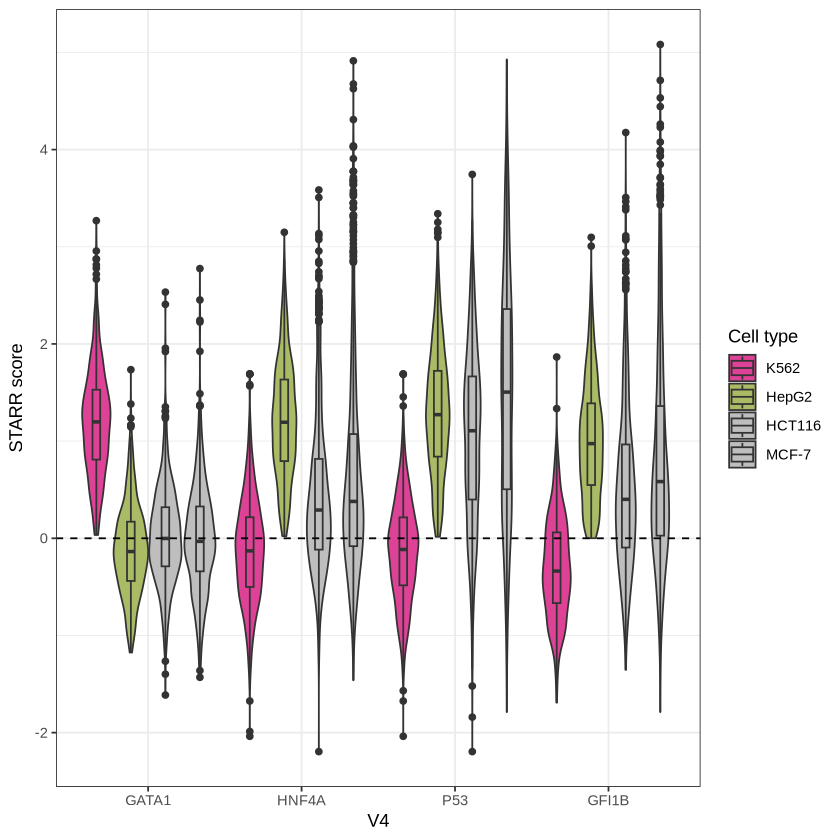

In [66]:
## Extended Data 3a
data = read.table("2_Functional-Characterization/Figure-Input-Data/Extended-Data-Figure-3a.cCRE-STARR-Activity.txt")

data$V3 = gsub("ENCSR858MPS", "K562", data$V3)
data$V3 = gsub("ENCSR135NXN", "HepG2", data$V3)
data$V3 = gsub("ENCSR064KUD", "HCT116", data$V3)
data$V3 = gsub("ENCSR547SBZ", "MCF-7", data$V3)

data$V3=factor(data$V3,levels =c("K562","HepG2","HCT116","MCF-7"))
data$V4=factor(data$V4,levels =c("GATA1","HNF4A","P53","GFI1B"))

ggplot(data, aes(x=V4, fill=V3, y=V2)) + geom_violin() + theme_bw() +
    geom_boxplot(width=0.2, position = position_dodge(width = 0.9)) +
    geom_hline(yintercept=0, linetype="dashed") + ylab("STARR score") +
    scale_fill_manual(name="Cell type", values=c("#dd4297","#aabb66", "gray","gray"))

miniData=data[data$V3 == "K562",]
table(miniData$V4)

In [12]:
miniData = data[data$V4 == "HNF4A",]
head(miniData)
pairwise.wilcox.test(miniData$V2, miniData$V3)

,V1,V2,V3,V4
,<chr>,<dbl>,<fct>,<fct>
2427,EH38D2119995,0.4103450,K562,HNF4A
2428,EH38D2124280,-0.4130612,K562,HNF4A
2429,EH38D2128597,0.1281878,K562,HNF4A
2430,EH38D2151180,-0.6599637,K562,HNF4A
2431,EH38D2153239,-0.1292917,K562,HNF4A
2432,EH38D2157340,0.1542259,K562,HNF4A



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  miniData$V2 and miniData$V3 

       K562   HepG2  HCT116
HepG2  <2e-16 -      -     
HCT116 <2e-16 <2e-16 -     
MCF-7  <2e-16 <2e-16 0.002 

P value adjustment method: holm 

,Gene,variable,value
,<chr>,<fct>,<dbl>
1,ENSG00000102145.13,K562,105.23
2,ENSG00000101076.16,K562,0.11
3,ENSG00000141510.17,K562,9.45
4,ENSG00000165702.14,K562,38.57
5,ENSG00000102145.13,HepG2,0.10
6,ENSG00000101076.16,HepG2,112.76


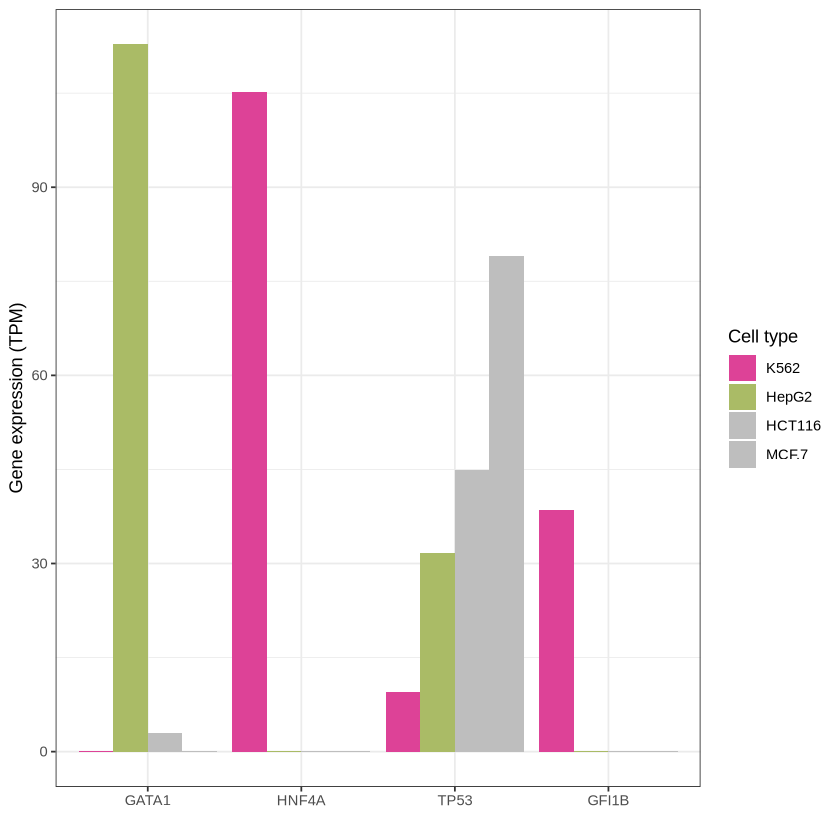

In [59]:
## Extended Data 3b

data = read.table("2_Functional-Characterization/Figure-Input-Data/Extended-Data-Figure-3b.Gene-Expression.txt", header=T)
meltedData=melt(data, id="Gene")
head(meltedData)

ggplot(meltedData, aes(x=Gene, y=value, fill=variable)) + geom_bar(stat="identity", position="dodge") +
    scale_x_discrete(labels = c("GATA1", "HNF4A", "TP53", "GFI1B")) +
    scale_fill_manual(name="Cell type", values=c("#dd4297","#aabb66", "gray","gray")) +
    xlab("") + ylab("Gene expression (TPM)") + theme_bw()


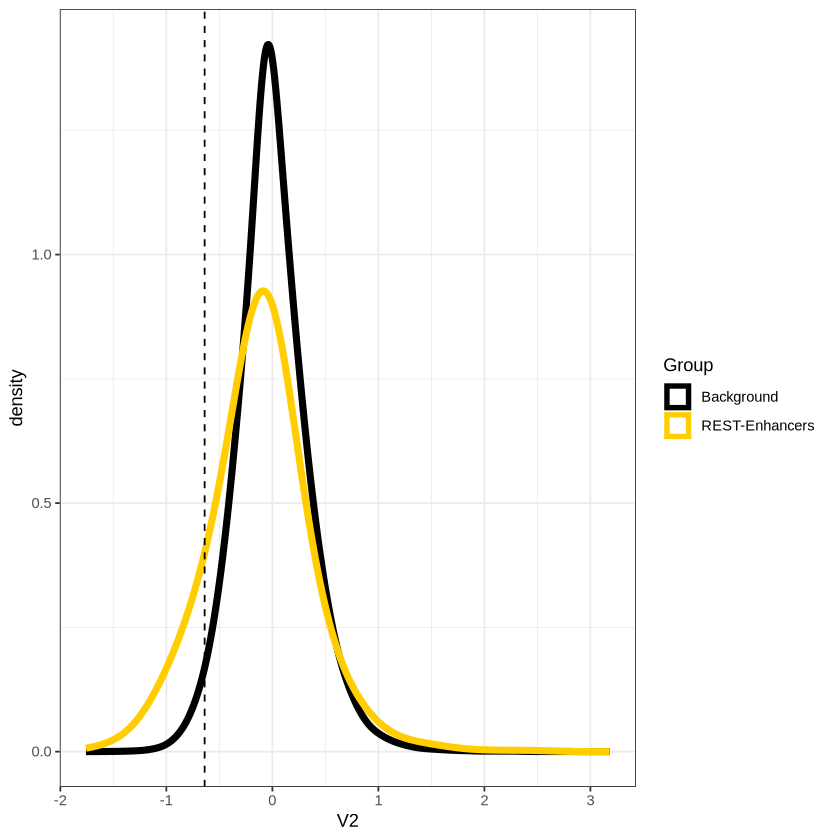

In [64]:
## Extended Data Figure 4b, 

data = read.table("3_Silencers/Figure-Input-Data/Figure-3f.REST-STARR-Scores.txt")

subData = data[data$V3 != "REST-Silencers",]
line = subData[data$V1 == "EH38D3322718",] #anchor ID of EH38E2130108

ggplot(subData, aes(x=V2, color=V3)) + geom_density(adjust=3, linewidth=2) + theme_bw() +
    scale_color_manual(name="Group",values=c("black","#ffcd00")) +
    geom_vline(xintercept=line$V2, linetype="dashed")


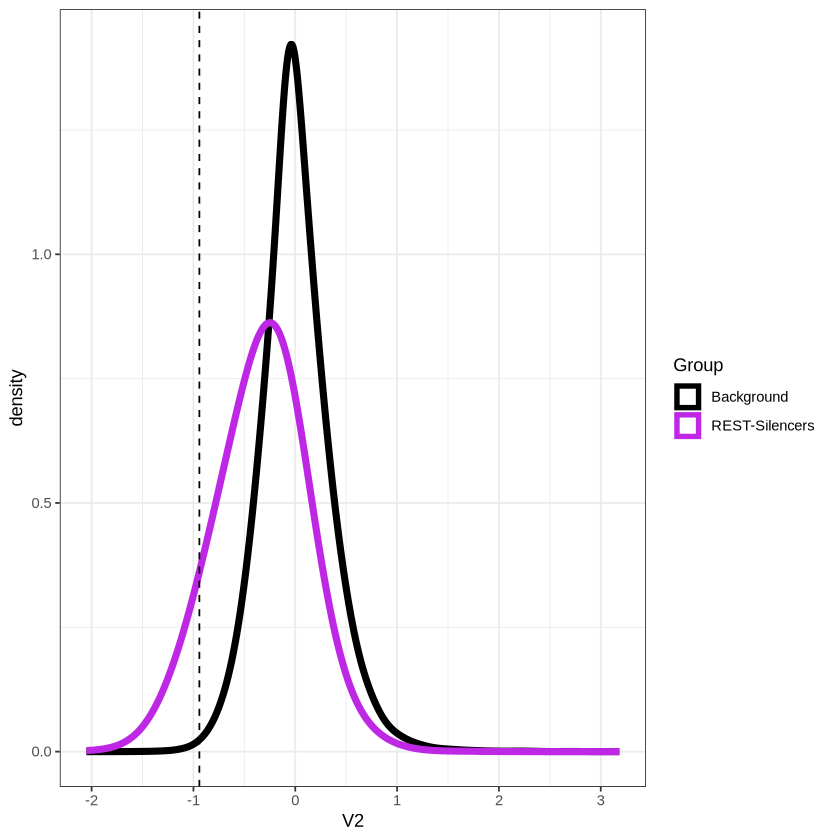

In [35]:
## Extended Data Figure 4e 

data = read.table("3_Silencers/Figure-Input-Data/Figure-3f.REST-STARR-Scores.txt")

subData = data[data$V3 != "REST-Enhancers",]
line = subData[subData$V1 == "EH38D6246313",] #anchor ID of EH38E4127779

ggplot(subData, aes(x=V2, color=V3)) + geom_density(adjust=3, linewidth=2) + theme_bw() +
    scale_color_manual(name="Group",values=c("black","#be28e5")) +
    geom_vline(xintercept=line$V2, linetype="dashed")


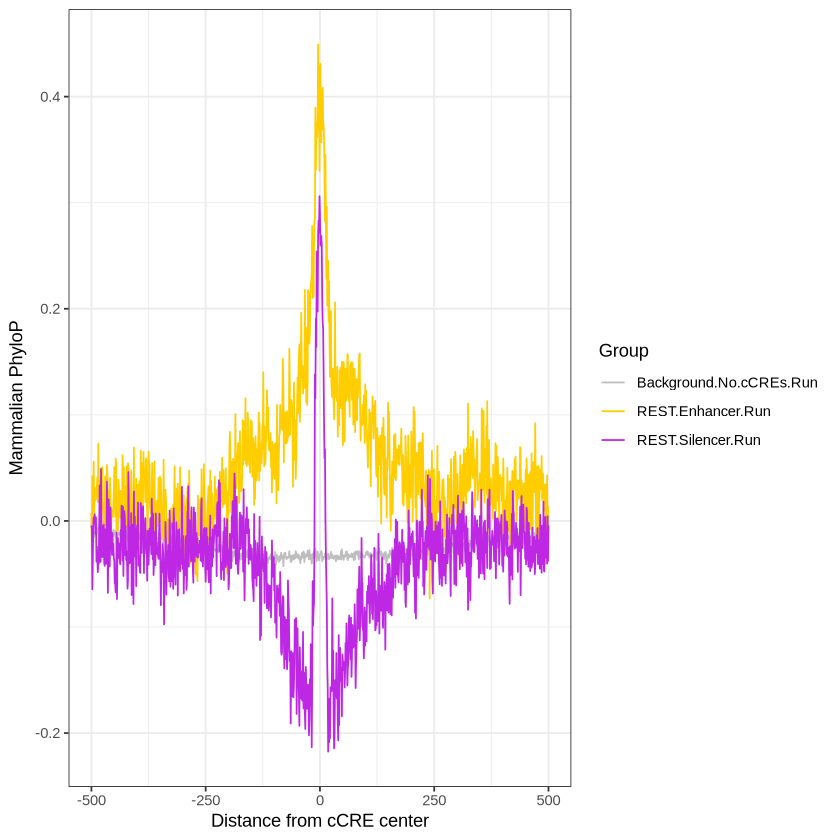

In [97]:
## Extended Data Figure 5a

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-5a.REST-PhyloP-Aggregate-Conservation.txt", header=T)
meltedData=melt(data, id="x")

ggplot(meltedData, aes(x=x, y=value, color=variable)) + geom_line() + 
    scale_color_manual(name="Group",values=c("gray", "#ffcd00","#be28e5")) + theme_bw() +
    xlab("Distance from cCRE center") + ylab("Mammalian PhyloP")


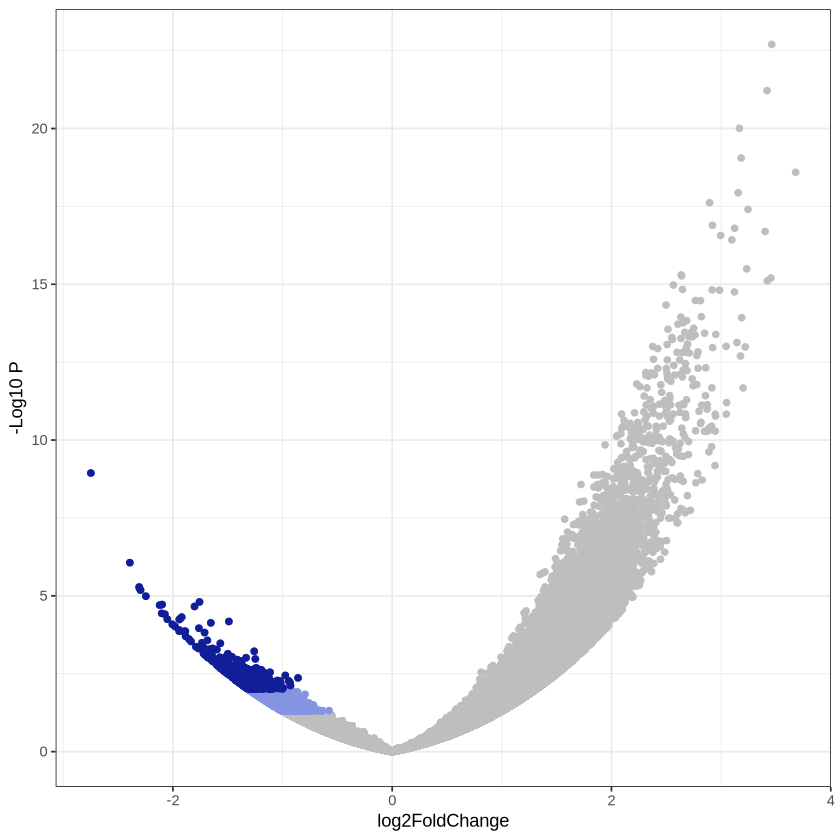

In [74]:
## Extended Data Figure 5f

data = read.table("2_Functional-Characterization/CAPRA-Output/ENCSR661FOW-DESeq2.Solo-Filtered.V7.txt", header=T)

robust = data[data$pvalue < 0.05 & data$log2FoldChange < 0,]
stringent = data[data$pvalue < 0.01 & data$log2FoldChange < 0,]

ggplot(data, aes(x=log2FoldChange, y=-log10(pvalue))) + geom_point(color="gray") + 
    geom_point(data=robust, color="#8494e3") + geom_point(data=stringent, color="#111e99") +
    theme_bw() + ylab("-Log10 P")

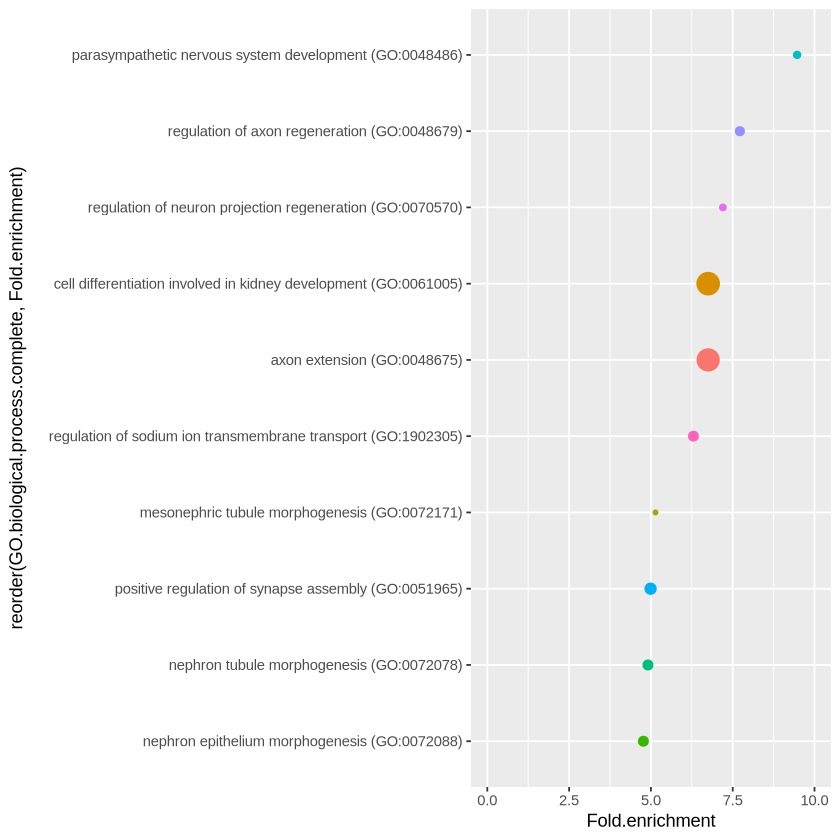

In [98]:
## Extended Data Figure 5g

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-5g.STARR-Silencer-GO-Top10.txt", sep="\t", header=T)


ggplot(data, aes(y=reorder(GO.biological.process.complete, Fold.enrichment), x=Fold.enrichment, color=GO.biological.process.complete, size=-log10(FDR))) + 
    geom_point() + coord_cartesian(x=c(0,10)) + theme(legend.position = "none")


[1] 1325   11

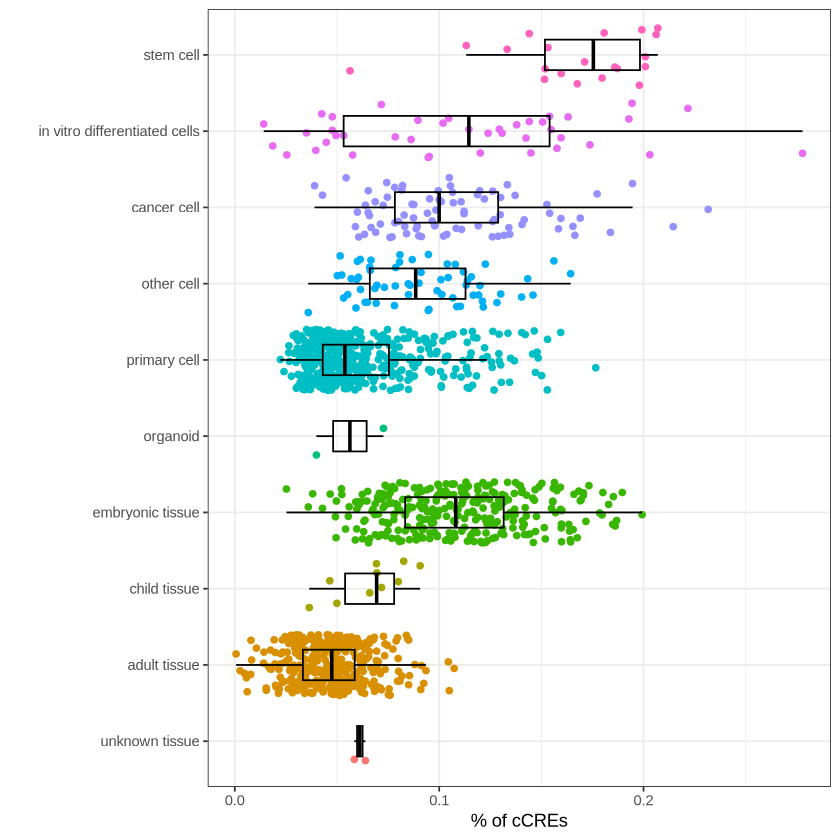

In [67]:
## Extended Data Figure 6a

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-6ab.Silencer-DNase-Enrichment.txt", sep="\t")

data$V11=factor(data$V11,levels=rev(c("stem cell","in vitro differentiated cells","cancer cell","other cell","primary cell","organoid","embryonic tissue","child tissue","adult tissue","unknown tissue")))

ggplot(data, aes(x=V5, y=V11, color=V11)) + geom_jitter() + geom_boxplot(color="black", width=0.4, fill = NA, outlier.shape=NA) + 
    theme_bw() + ylab("") + xlab("% of cCREs") + theme(legend.position = "none")

dim(data)

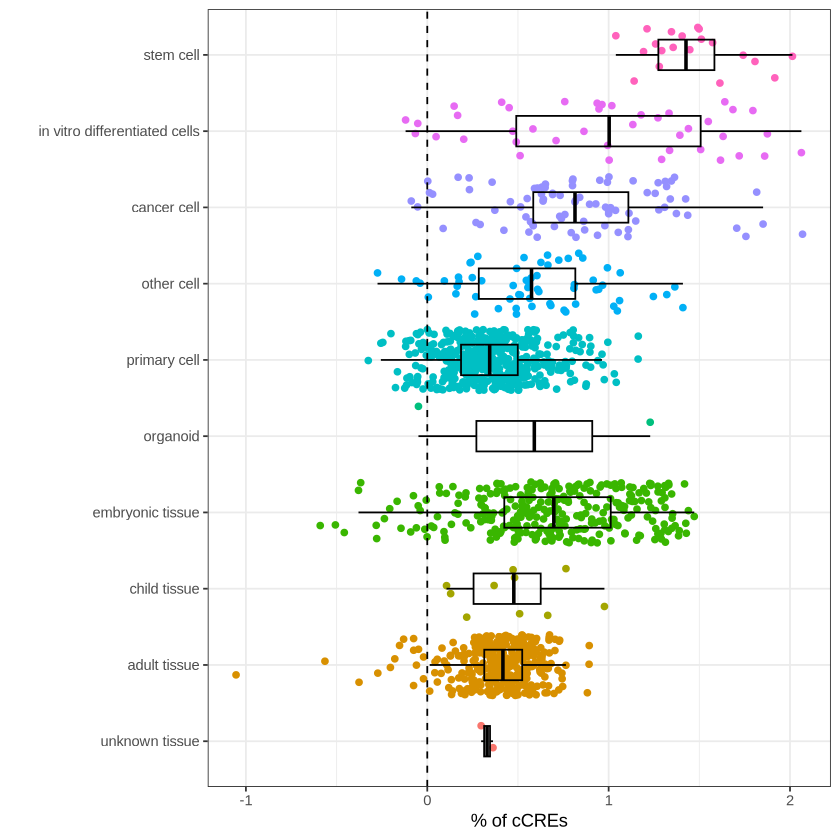

In [12]:
## Extended Data Figure 6b

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-6ab.Silencer-DNase-Enrichment.txt", sep="\t")

data$V11=factor(data$V11,levels=rev(c("stem cell","in vitro differentiated cells","cancer cell","other cell","primary cell","organoid","embryonic tissue","child tissue","adult tissue","unknown tissue")))

ggplot(data, aes(x=log2(V5/V8), y=V11, color=V11)) + geom_jitter() + geom_boxplot(color="black", width=0.4, fill = NA, outlier.shape=NA) + 
    theme_bw() + ylab("") + xlab("% of cCREs") + theme(legend.position = "none") + geom_vline(xintercept=0, linetype="dashed")


Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_boxplot()`).”



	Pairwise comparisons using Wilcoxon rank sum exact test 

data:  log2(miniData$V15/miniData$V18) and miniData$V9 

          adult  
embryonic 1.8e-08

P value adjustment method: holm 

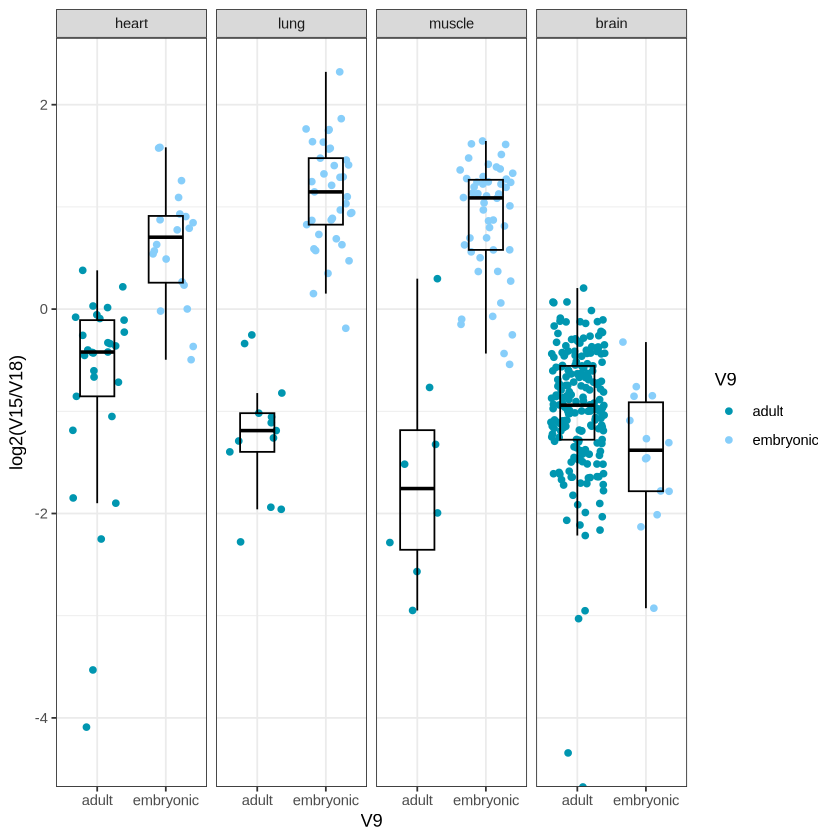

In [58]:
## Extended Data Figure 6

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-6c.REST-Silencer-Tissue-Enrichment.txt")

data$V6=factor(data$V6,levels=c("heart","lung","muscle","brain"))

ggplot(data, aes(x=V9, fill=V9, color=V9, y=log2(V15/V18)))  +  geom_jitter() + 
    geom_boxplot(width =0.5, outlier.shape=NA, color="black", fill=NA) + 
    facet_wrap(~ V6, ncol=4) + theme_bw() + scale_color_manual(values=c("#0096b0","#87cefa")) 

miniData=data[data$V6=="heart",]
pairwise.wilcox.test(log2(miniData$V15/miniData$V18), miniData$V9)

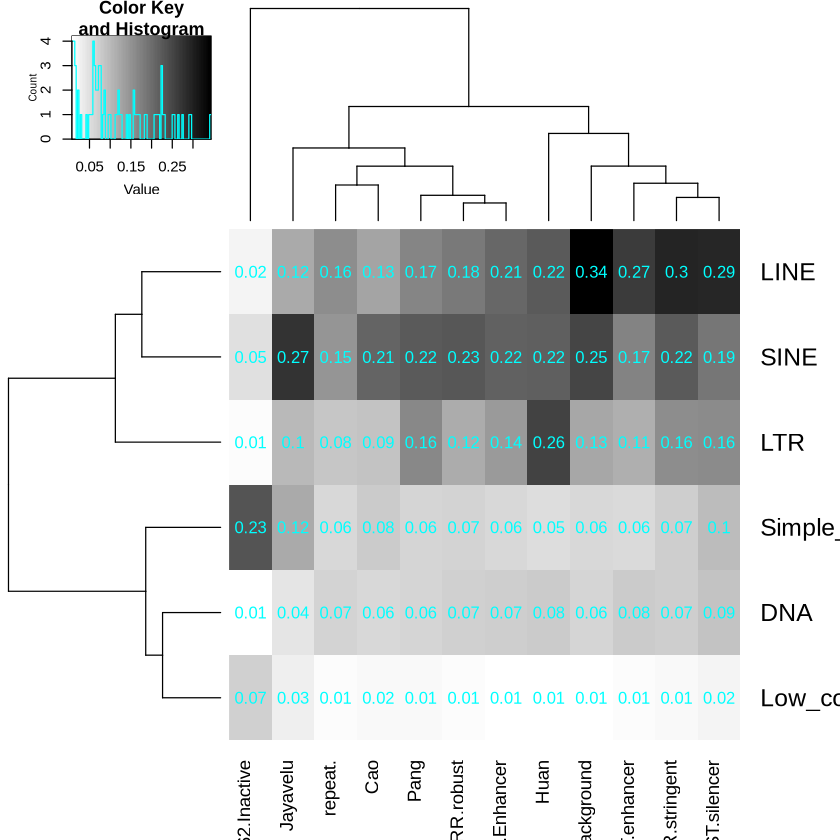

In [18]:
## Extended Data Figure 6d

data=read.table("3_Silencers/Figure-Input-Data/Extended-Data-Figure-6d.Silencer-Repeat-Overlap-Heatmap.txt", header=T, row.names=1)

subsetData = data[apply(data, 1, max) >= 0.05, ]
colors=colorRampPalette(c("white","black"))(100)
heatmap.2(data.matrix(subsetData), col=colors, trace="none", cellnote=round(subsetData,2))


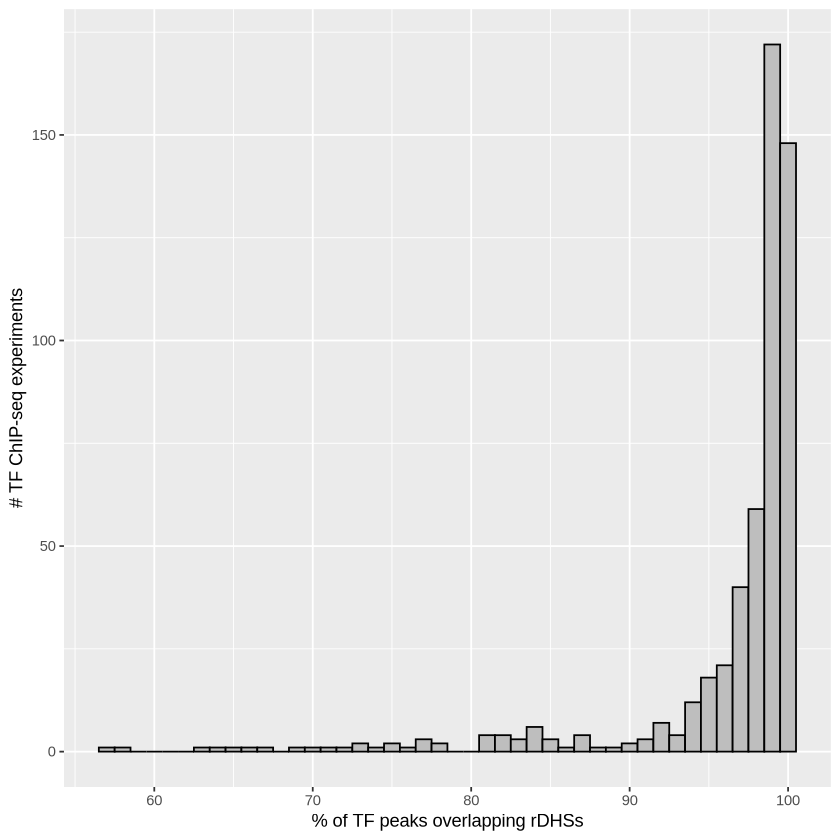

In [40]:
## Supplementary Figure 1a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1a.TF-Peak-Overlap.txt")
ggplot(data, aes(x=V2)) + geom_histogram(binwidth=1, color="black", fill="gray") + 
    xlab("% of TF peaks overlapping rDHSs") + ylab("# TF ChIP-seq experiments")

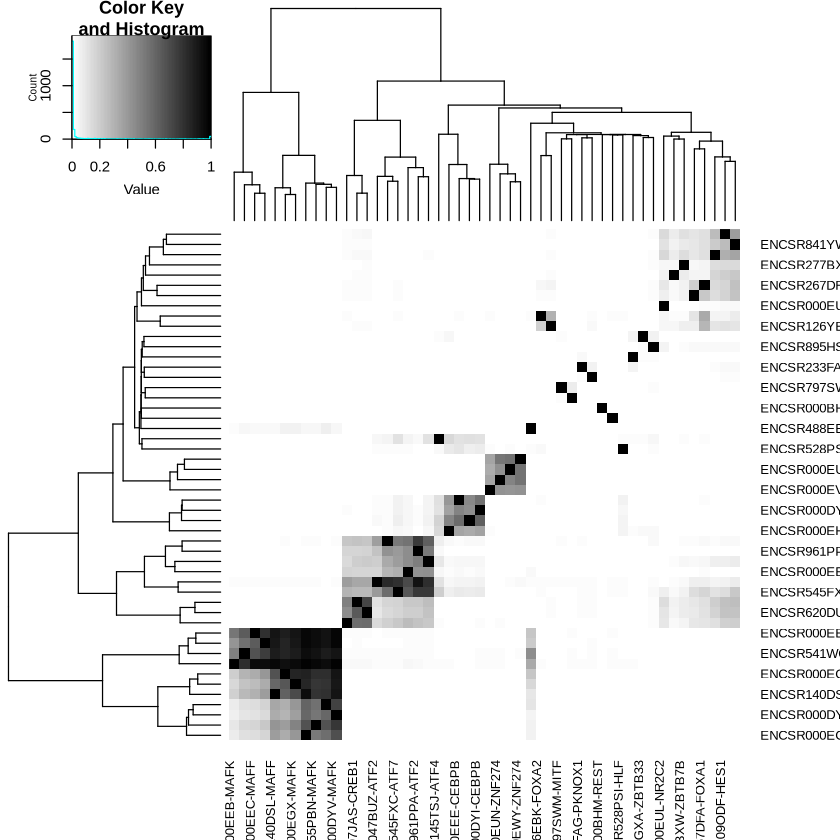

In [41]:
## Supplementary Figure 1b

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1b.TF-Overlap-Matrix.txt", header=T, row.names=1)
names(data) = row.names(data)
colors = colorRampPalette(c("white","black"))(100)
heatmap.2(data.matrix(data), col=colors, breaks=seq(0, 1, 0.01), trace="none")


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

            Background.No-cCREs.100k MAF-Sites ATF-Sites CEBPB-Sites TF-Anchors
MAF-Sites   < 2e-16                  -         -         -           -         
ATF-Sites   4.6e-16                  0.0014    -         -           -         
CEBPB-Sites < 2e-16                  0.0752    1.3e-08   -           -         
TF-Anchors  < 2e-16                  0.0715    0.0057    1.7e-06     -         
rDHS-100k   < 2e-16                  0.0640    0.0640    2.8e-06     0.2905    

P value adjustment method: fdr 

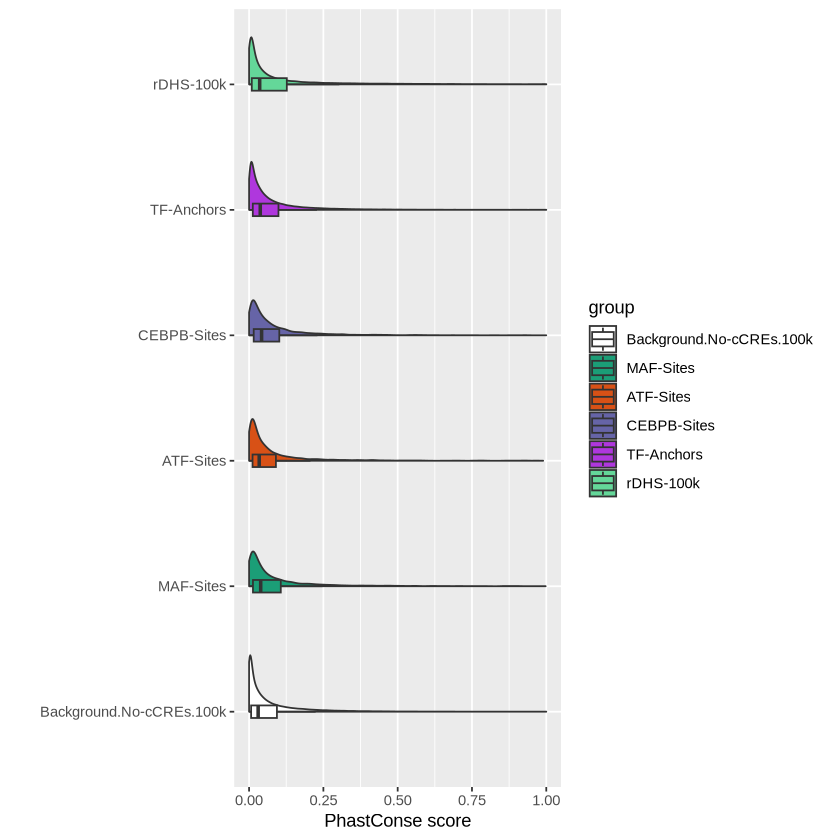

In [44]:
## Supplementary Figure 1c

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1c.PhastCons-Conservation-TF.txt")

data$V3=factor(data$V3,levels =rev(c("rDHS-100k","TF-Anchors","CEBPB-Sites","ATF-Sites", "MAF-Sites", "Background.No-cCREs.100k")))

ggplot(data, aes(x=V3, y=V2, fill=V3)) + geom_violinhalf() + coord_flip() + geom_boxplot(width=0.1, outlier.shape=NA) +
    scale_fill_manual(name="group",values=rev(c("#64d799","#af37dd", "#6664a7","#d85116","#1b9e77", "white"))) +
    ylab("PhastConse score") + xlab("")

pairwise.wilcox.test(data$V2, data$V3, p.adj="fdr")


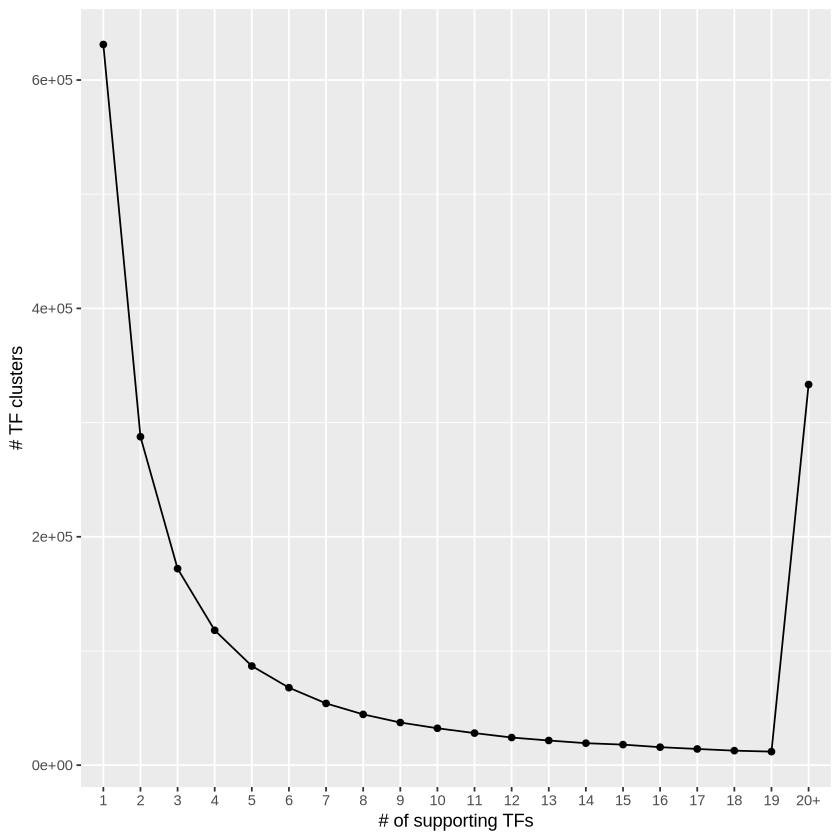

In [72]:
## Supplementary Figure 1e

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1e.TF-Anchor-Support.txt")

data$V1 <- factor(data$V1, levels = c(as.character(1:19), "20+"))
ggplot(data,aes(x=V1, y=V2, group=rep("group1",20))) + geom_point() + geom_line() +
    xlab("# of supporting TFs") + ylab("# TF clusters")

,V1,V2,V3,V4,V5,V6,V7,V8,group
,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>,<chr>,<fct>
1,chr8,133566055,133566295,ENCSR000AHD-1000,3,ENCSR000AHD-1000,0.00091250,overlap,3
3,chr17,72322067,72322307,ENCSR000AHD-1014,1,ENCSR000AHD-1014,0.19997500,overlap,1
5,chr1,151137612,151137852,ENCSR000AHD-1069,1,ENCSR000AHD-1069,0.34704200,overlap,1
6,chr14,90196788,90197028,ENCSR000AHD-10755,2,ENCSR000AHD-10755,0.00999583,overlap,2
8,chr10,37701582,37701822,ENCSR000AHD-1077,1,ENCSR000AHD-1077,0.00610417,overlap,1
9,chr1,203349821,203350061,ENCSR000AHD-1085,1,ENCSR000AHD-1085,0.63862100,overlap,1



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  miniData$V7 and miniData$V8 

        no-overlap
overlap <2e-16    

P value adjustment method: holm 

Group.1,x
<chr>,<dbl>
no-overlap,0.0423138
overlap,0.0374915


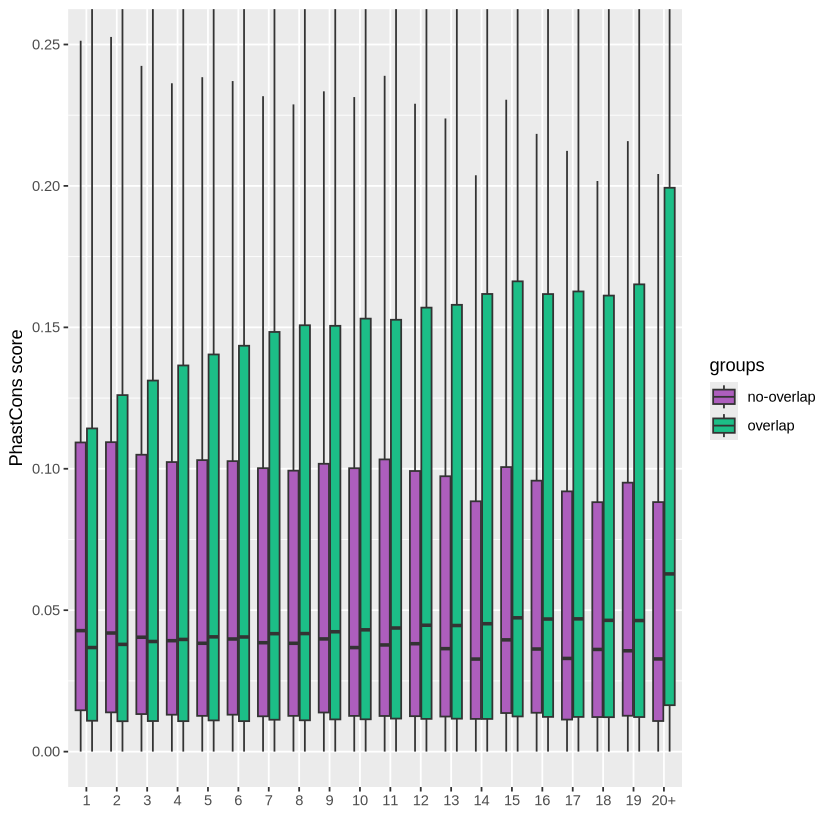

In [25]:
## Supplementary Figure 1f

#data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1f.TF-Anchor-Support.txt", sep="\t")

data$group <- ifelse(data$V5 >= 20, "20+", as.character(data$V5))
unique_levels <- as.character(1:19)
data$group <- factor(data$group, levels = c(unique_levels, "20+"))
ggplot(data, aes(x=group, y=V7, fill=V8)) + geom_boxplot(outlier.shape=NA) + 
    coord_cartesian(y=c(0,0.25)) + xlab("") + ylab("PhastCons score") + 
    scale_fill_manual(name="groups",values=c("#ad5ebd","#1cbe87")) 

miniData=data[data$group=="1" | data$group=="2" | data$group=="3" ,]
head(miniData)
pairwise.wilcox.test(miniData$V7, miniData$V8)
aggregate(miniData$V7, list(miniData$V8), FUN=median)  

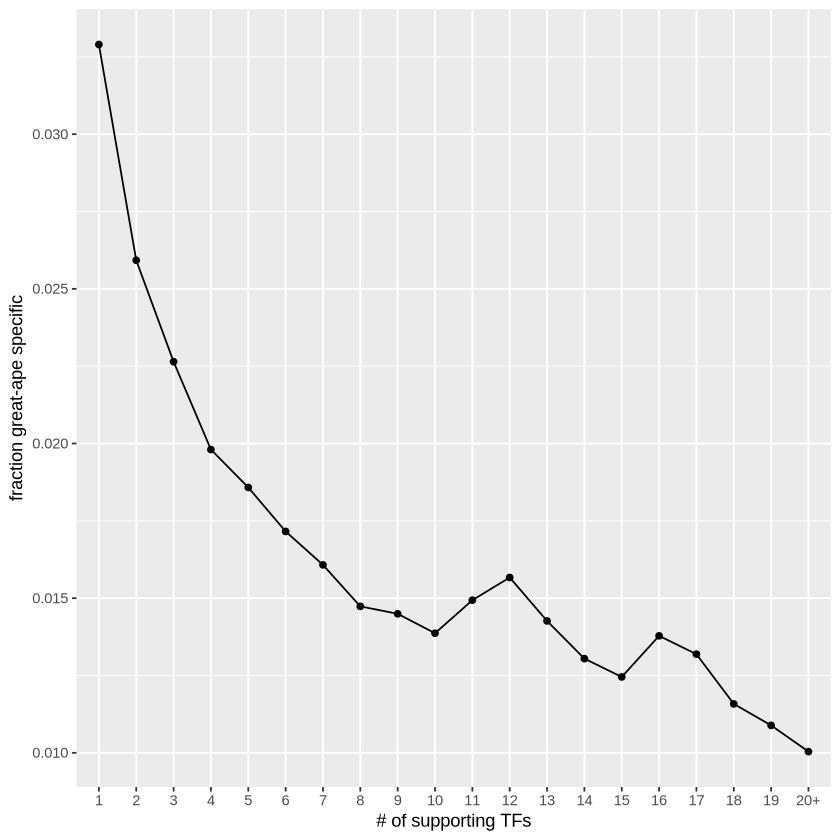

In [78]:
## Supplementary Figure 1g

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-1g.Zoonomia-N1-N2-TF.txt")

data$V1 <- factor(data$V1, levels = c(as.character(1:19), "20+"))
ggplot(data,aes(x=V1, y=V2, group=rep("group1",20))) + geom_point() + geom_line() +
    xlab("# of supporting TFs") + ylab("fraction great-ape specific")

V1,V2,V3,V4,V5
<fct>,<chr>,<int>,<int>,<dbl>
protein_coding,unique-map,17756,19988,88.833300
protein_coding,multi-map,144,19988,0.720432
lncRNA,unique-map,10056,17748,56.659900
lncRNA,multi-map,146,17748,0.822628
other,unique-map,5289,23808,22.215200
other,multi-map,286,23808,1.201280
whole-genome,unique-map,6804,7070,96.237600
whole-genome,multi-map,16,7070,0.226308
small-scale,unique-map,3219,4640,69.375000


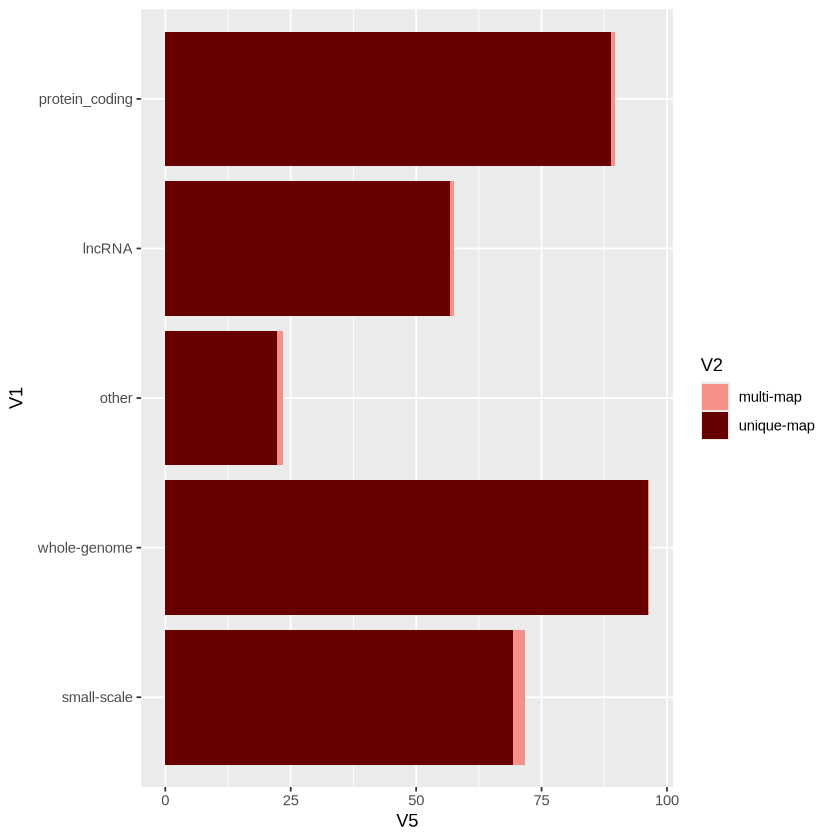

In [48]:
## Supplementary Figure 2a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-2a.Promoter-Coverage.txt")

data$V1=factor(data$V1,levels =rev(c("protein_coding","lncRNA","other","whole-genome", "small-scale")))

ggplot(data, aes(y=V1, x=V5, fill=V2)) + geom_bar(stat="identity") + 
    scale_fill_manual(values=c("#f8908a","#680000"))

data


group,whole.genome,small.scale
<fct>,<int>,<int>
background,7070,4640
unique-map,6804,3219
multi-map,16,112


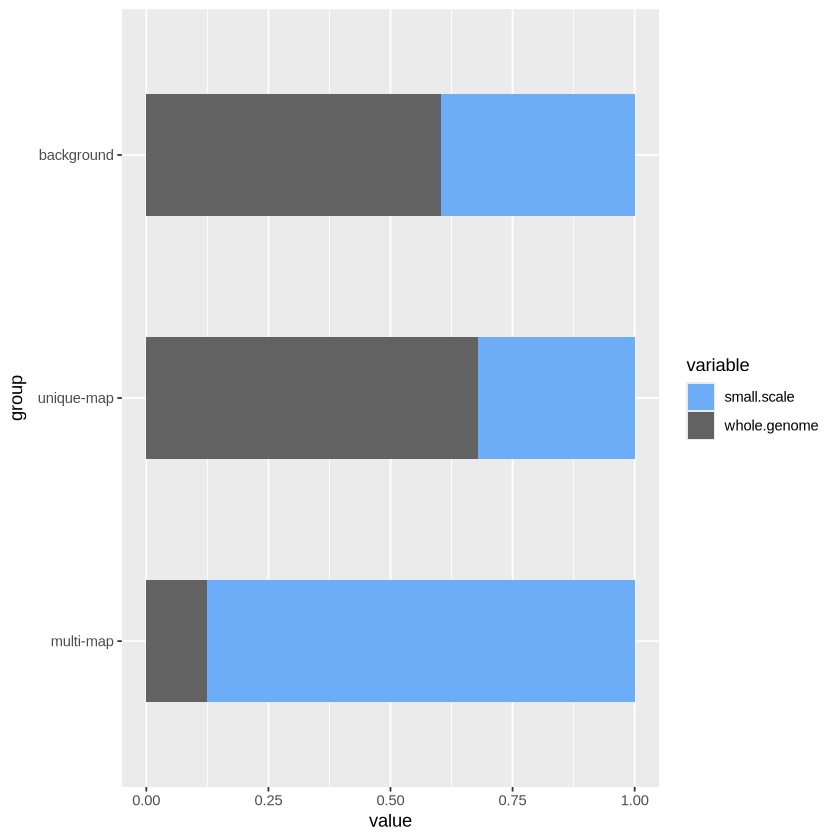

In [57]:
## Supplementary Figure 2b

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-2b.Duplication-MultiMap.txt", header=T)
data$group=factor(data$group,levels =rev(c("background","unique-map","multi-map")))
meltedData = melt(data, id="group")
meltedData$variable=factor(meltedData$variable,levels =rev(c("whole.genome","small.scale")))

ggplot(meltedData, aes(y=group, x=value, fill=variable)) + geom_bar(stat="identity", position="fill", width=0.5) +
    scale_fill_manual(values=rev(c("#626262","#6dadf8")))
data

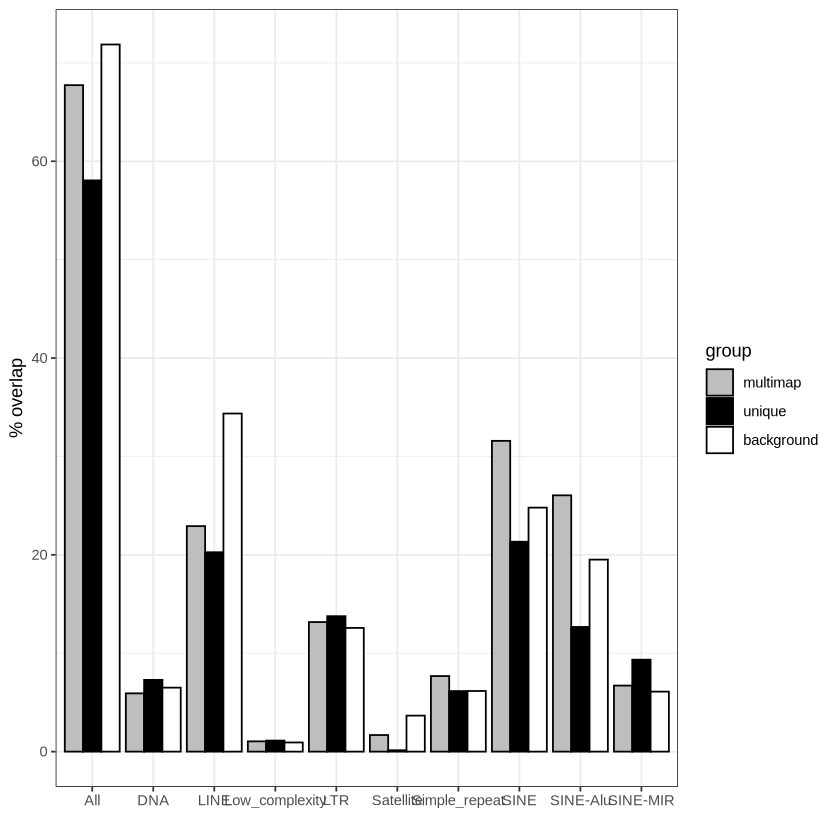

In [58]:
## Supplementary Figure 2e

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-2e.Multimapper-Repeat-Overlap.txt", header=T)
meltedData=melt(data, id="repeat.")

ggplot(meltedData, aes(x=repeat., fill=variable, y=value*100)) + geom_bar(color="black", stat="identity", position="dodge") +
    xlab("") + ylab("% overlap") + scale_fill_manual(name="group",values=c("gray", "black", "white")) + theme_bw()


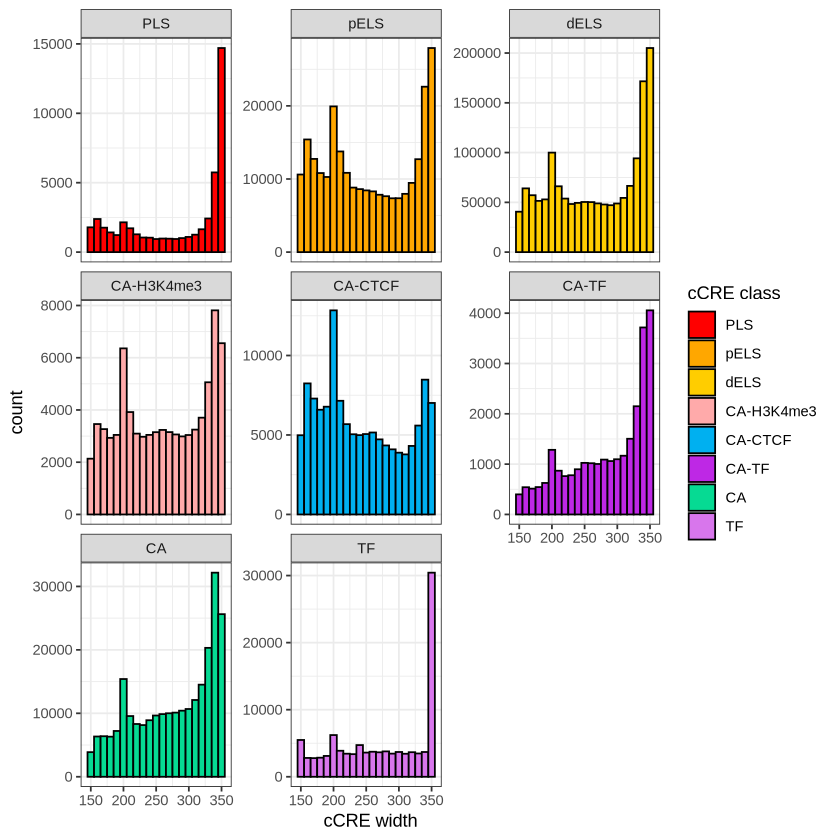

In [59]:
## Supplementary Figure 3
data = read.table("../hg38-cCREs-Unfiltered.bed")
data$V6=factor(data$V6,levels = c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF"))
ggplot(data, aes(x=V3-V2, fill=V6)) + geom_histogram(color="black",bins=21) + facet_wrap(~ V6, ncol=3, scales = "free_y") + 
    scale_fill_manual(name = "cCRE class", values=c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec")) +
    xlab("cCRE width") + theme_bw()


Group.1,x
<fct>,<dbl>
background,0.03111055
TF,0.03457000
CA,0.03792630
CA-TF,0.04394510
CA-CTCF,0.03527610
CA-H3K4me3,0.04182285
dELS,0.03829280
pELS,0.04187100
PLS,0.15114350



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

           background TF      CA      CA-TF   CA-CTCF CA-H3K4me3 dELS   
TF         < 2e-16    -       -       -       -       -          -      
CA         < 2e-16    < 2e-16 -       -       -       -          -      
CA-TF      < 2e-16    < 2e-16 < 2e-16 -       -       -          -      
CA-CTCF    < 2e-16    5.4e-11 < 2e-16 < 2e-16 -       -          -      
CA-H3K4me3 < 2e-16    < 2e-16 6.2e-12 0.00013 < 2e-16 -          -      
dELS       < 2e-16    < 2e-16 0.02432 < 2e-16 < 2e-16 3.8e-08    -      
pELS       < 2e-16    < 2e-16 < 2e-16 0.02432 < 2e-16 0.00057    < 2e-16
PLS        < 2e-16    < 2e-16 < 2e-16 < 2e-16 < 2e-16 < 2e-16    < 2e-16
           pELS   
TF         -      
CA         -      
CA-TF      -      
CA-CTCF    -      
CA-H3K4me3 -      
dELS       -      
pELS       -      
PLS        < 2e-16

P value adjustment method: holm 

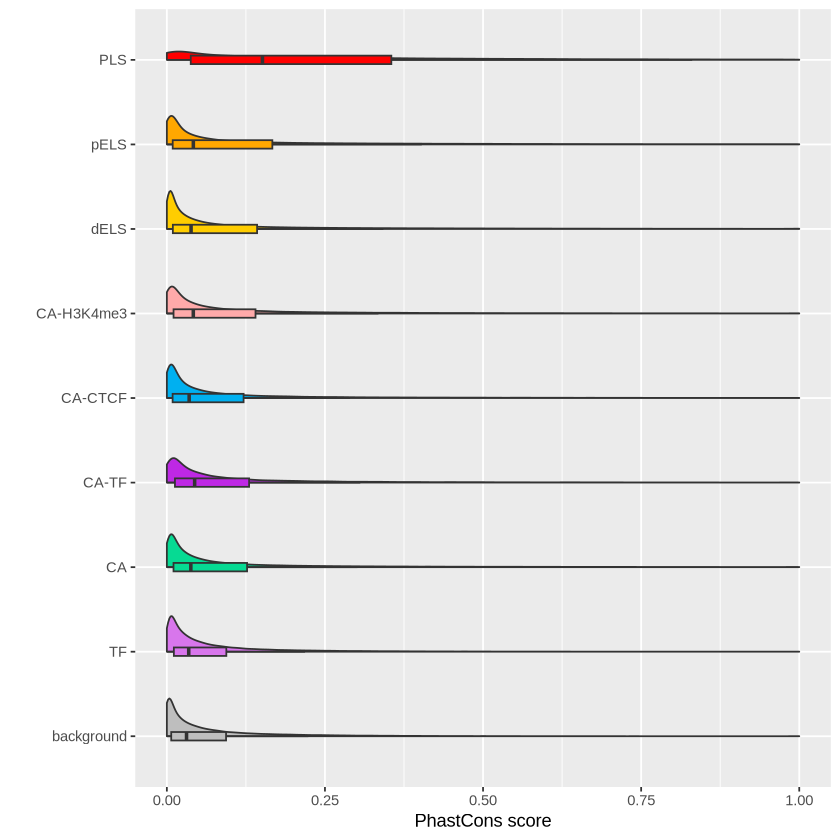

In [65]:
## Supplementary Figure 4a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-4a.PhastCons-Conservation.txt")
data$V3=factor(data$V3,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF","background")))

ggplot(data, aes(x=V3, y=V2, fill=V3)) + geom_violinhalf() + coord_flip() + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec", "gray"))) +
    xlab("") + ylab("PhastCons score") + geom_boxplot(width=0.1, outlier.shape=NA) + theme(legend.position="none")

aggregate(data$V2, list(data$V3), FUN=median) 

pairwise.wilcox.test(data$V2,data$V3)


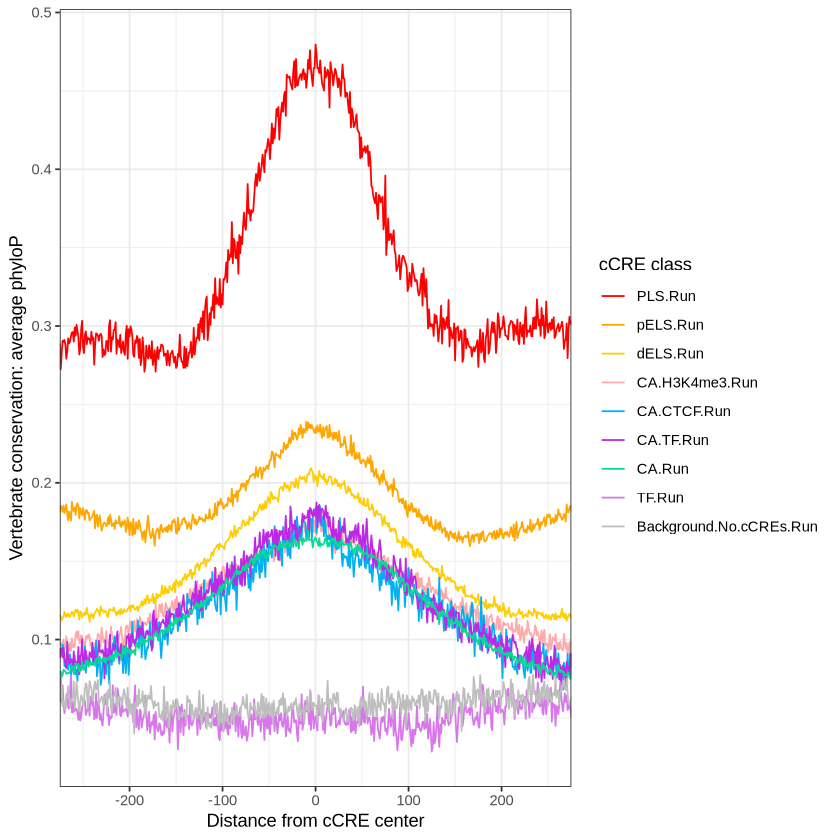

In [66]:
## Supplementary Figure 4b

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-4b.cCRE-Class-Vertebrate-Conservation.txt", header=T)

meltedData = melt(data, id="x")
meltedData$variable=factor(meltedData$variable,levels = c("PLS.Run","pELS.Run","dELS.Run","CA.H3K4me3.Run","CA.CTCF.Run","CA.TF.Run","CA.Run","TF.Run","Background.No.cCREs.Run"))

ggplot(meltedData, aes(x=x, y=value, color=variable)) + geom_line() + theme_bw() +
    scale_color_manual(name = "cCRE class", values=c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec", "gray")) +
    coord_cartesian(x=c(-250,250)) + xlab("Distance from cCRE center") + ylab("Vertebrate conservation: average phyloP")


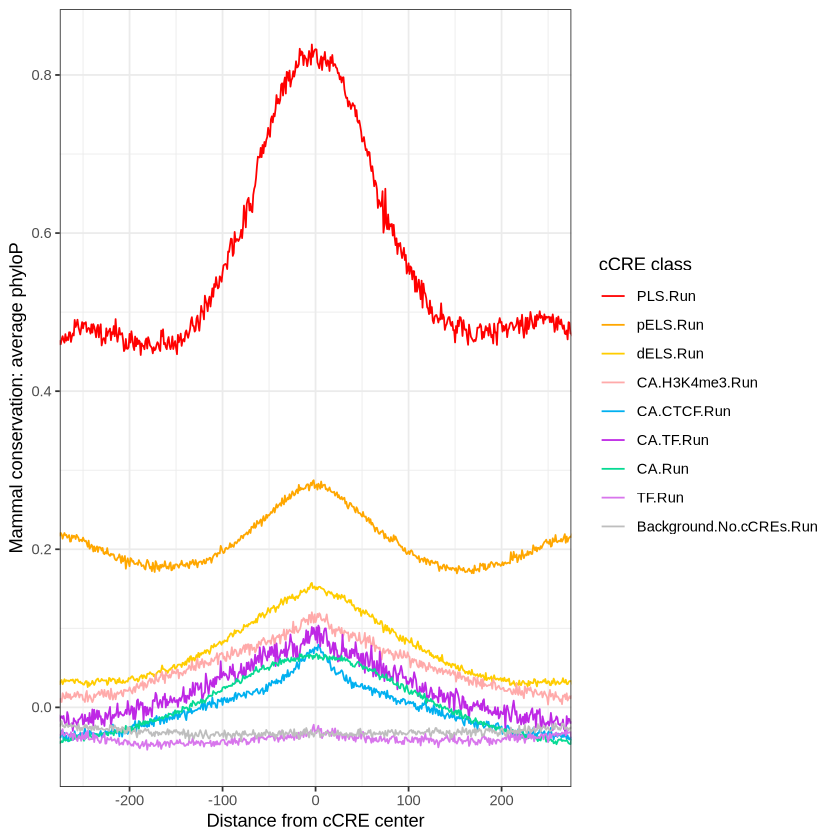

In [68]:
## Supplementary Figure 4c

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-4c.cCRE-Class-Mammal-Conservation.txt", header=T)

meltedData = melt(data, id="x")
meltedData$variable=factor(meltedData$variable,levels = c("PLS.Run","pELS.Run","dELS.Run","CA.H3K4me3.Run","CA.CTCF.Run","CA.TF.Run","CA.Run","TF.Run","Background.No.cCREs.Run"))

ggplot(meltedData, aes(x=x, y=value, color=variable)) + geom_line() + theme_bw() +
    scale_color_manual(name = "cCRE class", values=c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec", "gray")) +
    coord_cartesian(x=c(-250,250)) + xlab("Distance from cCRE center") + ylab("Mammal conservation: average phyloP")


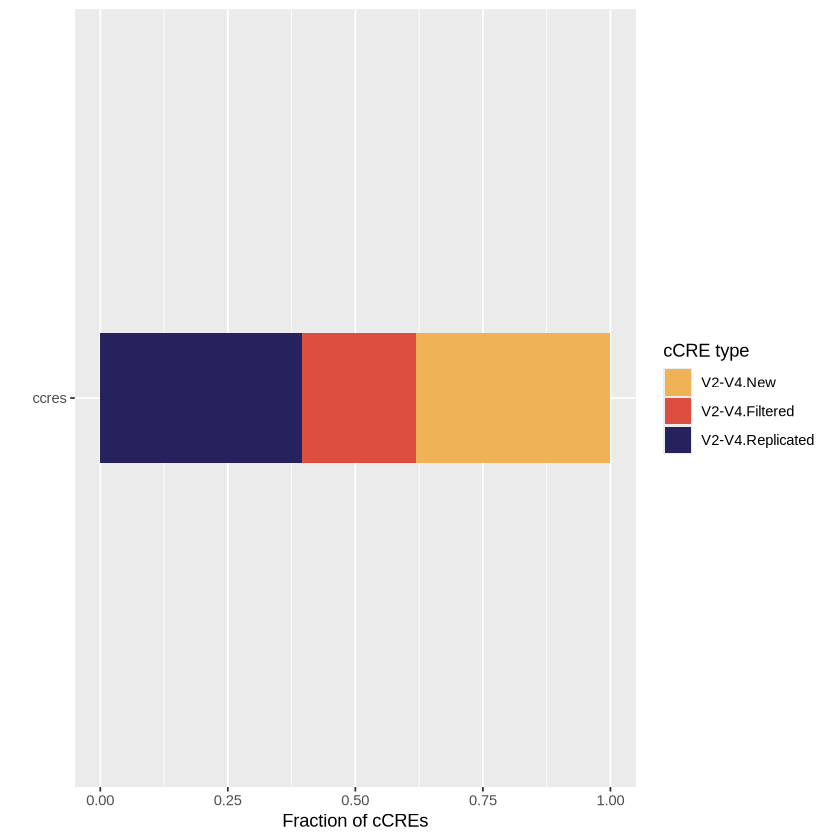

In [78]:
## Supplementary Figure 5a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-5a.Previous-Version-Comparison.txt")
data$V1 = factor(data$V1,levels = rev(c("V2-V4.Replicated", "V2-V4.Filtered", "V2-V4.New")))
y=rep("ccres",3)
ggplot(data, aes(y=y, x=V2, fill=V1)) + geom_bar(position="fill",stat="identity", width=0.2) + 
    scale_fill_manual(name="cCRE type", values=rev(c("#25225d", "#dc4f40", "#efb256"))) + ylab("") +
    xlab("Fraction of cCREs")


	Fisher's Exact Test for Count Data

data:  data[c(1, 4), c(3, 4)]
p-value < 2.2e-16
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 10.23672 10.93846
sample estimates:
odds ratio 
  10.58186 



	Fisher's Exact Test for Count Data

data:  data[c(2, 4), c(3, 4)]
p-value < 2.2e-16
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 4.192631 4.564453
sample estimates:
odds ratio 
  4.374573 



	Fisher's Exact Test for Count Data

data:  data[c(3, 4), c(3, 4)]
p-value < 2.2e-16
alternative hypothesis: true odds ratio is not equal to 1
95 percent confidence interval:
 5.199189 5.591818
sample estimates:
odds ratio 
  5.391486 


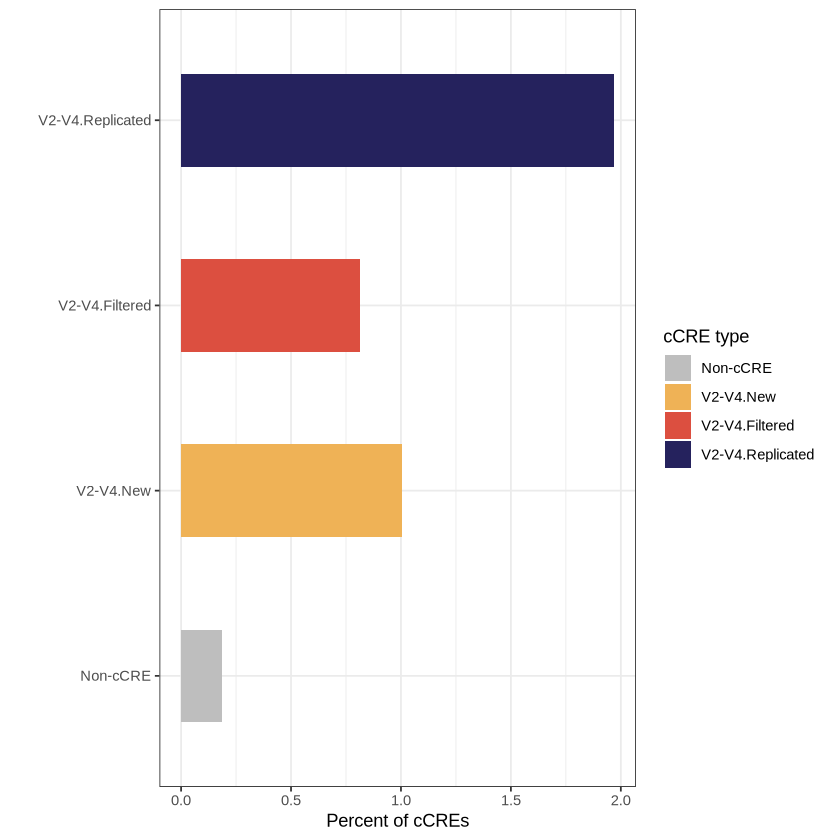

In [83]:
## Supplementary Figure 5b

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-5b.STARR-Overlap-Version-Comparison.txt")

data$V1 = factor(data$V1,levels = rev(c("V2-V4.Replicated", "V2-V4.Filtered", "V2-V4.New", "Non-cCRE")))
ggplot(data, aes(y=V1, x=V2, fill=V1)) + geom_bar(stat="identity", width=0.5) + 
    scale_fill_manual(name="cCRE type", values=rev(c("#25225d", "#dc4f40", "#efb256", "gray"))) + ylab("") +
    xlab("Percent of cCREs") + theme_bw()


fisher.test(data[c(1,4),c(3,4)])
fisher.test(data[c(2,4),c(3,4)])
fisher.test(data[c(3,4),c(3,4)])

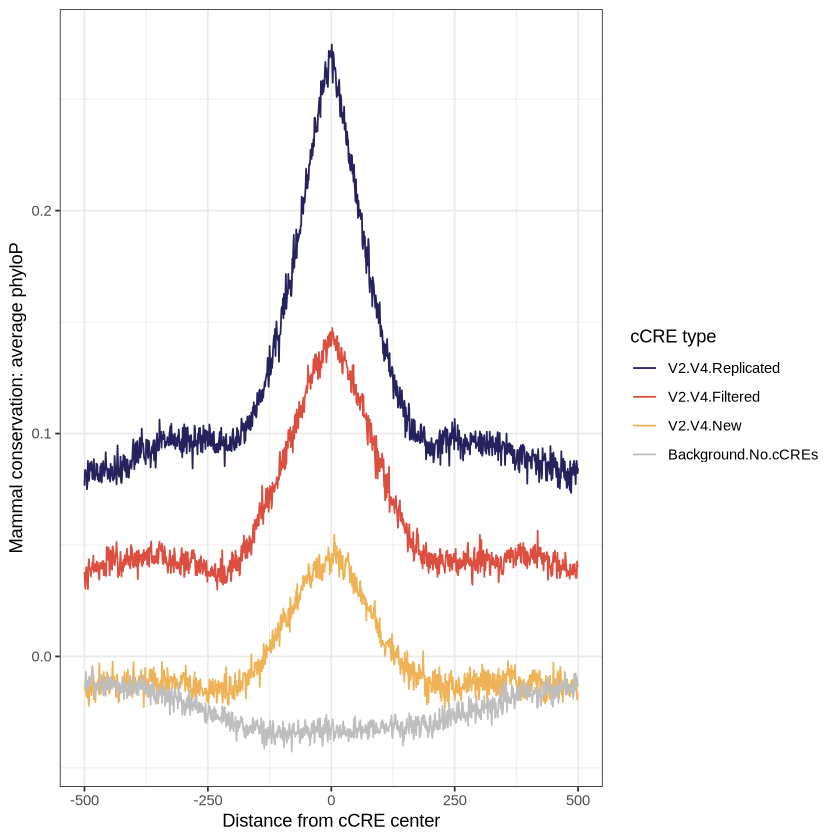

In [76]:
## Supplementary Figure 5c

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-5c.cCRE-Version-Mammalian-Conservation.txt", header=T)
meltedData = melt(data, id="x")

ggplot(meltedData, aes(x=x, y=value, color=variable)) + geom_line() + theme_bw() +
    xlab("Distance from cCRE center") + ylab("Mammal conservation: average phyloP") + 
    scale_color_manual(name = "cCRE type", values=c("#25225d", "#dc4f40", "#efb256", "gray")) 
    


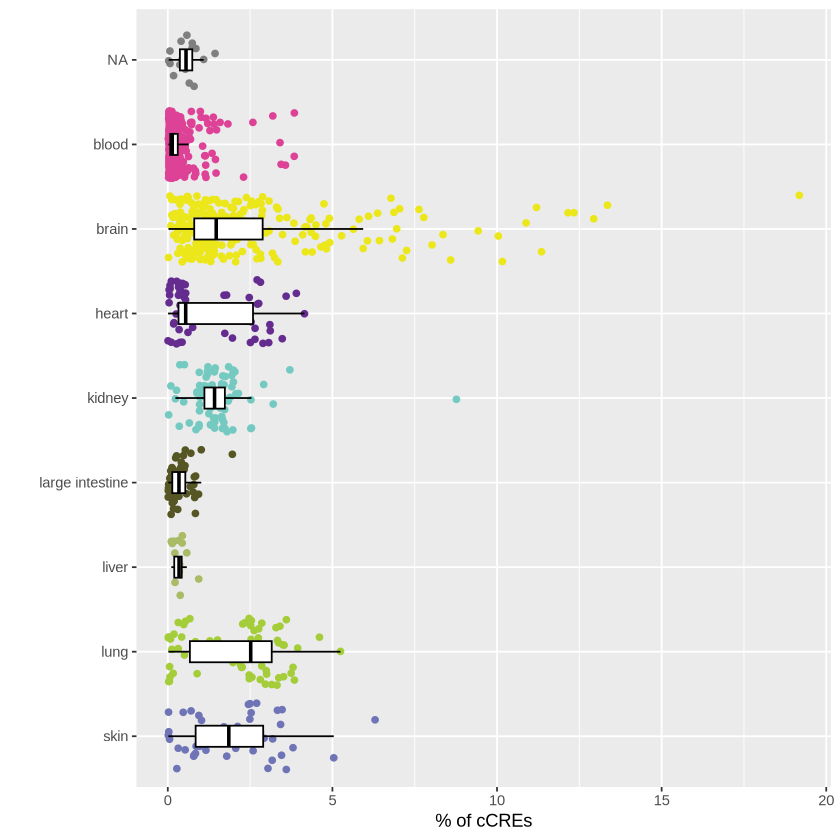

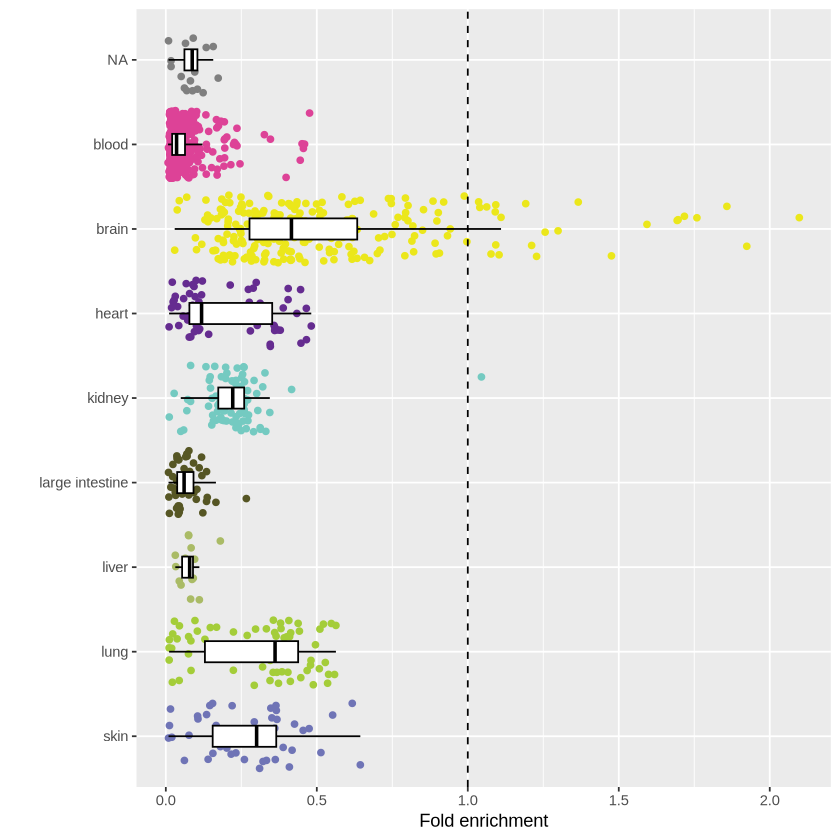

In [18]:
## Supplementary Figure 6a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-6a.BICCN-DNase-Enrichment.txt", sep="\t")

data$V12 = factor(data$V12,levels = rev(c(" blood", " brain", " heart", " kidney", " large intestine", " liver", " lung", " skin")))
ggplot(data, aes(y=V12, x=V5*100, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("% of cCREs") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6")))

ggplot(data, aes(y=V12, x=V5/V8, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("Fold enrichment") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6"))) +
    geom_vline(xintercept=1, linetype="dashed")


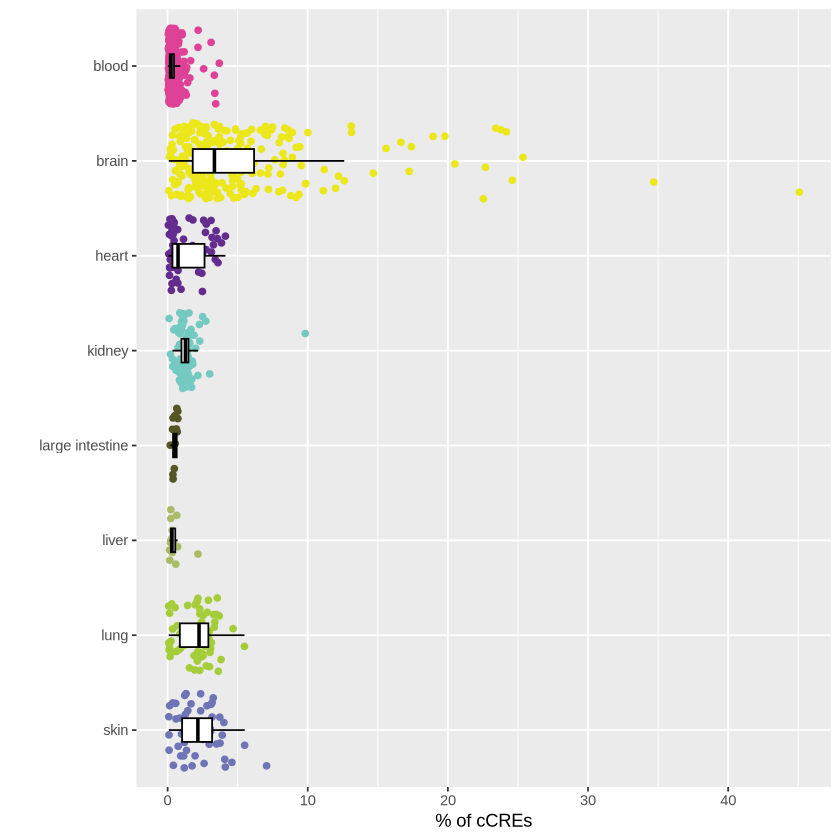


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V5/data$V8 and data$V12 

                  skin    lung    liver   large intestine  kidney  heart 
 lung            1.00000 -       -       -                -       -      
 liver           0.00012 0.00330 -       -                -       -      
 large intestine 5.3e-06 0.00066 1.00000 -                -       -      
 kidney          0.00025 4.1e-05 5.0e-05 7.7e-07          -       -      
 heart           0.03740 0.20010 0.01823 0.00122          1.00000 -      
 brain           1.1e-14 < 2e-16 2.9e-08 1.1e-08          < 2e-16 < 2e-16
 blood           < 2e-16 < 2e-16 0.49103 0.91314          < 2e-16 9.7e-15
                  brain 
 lung            -      
 liver           -      
 large intestine -      
 kidney          -      
 heart           -      
 brain           -      
 blood           < 2e-16

P value adjustment method: holm 

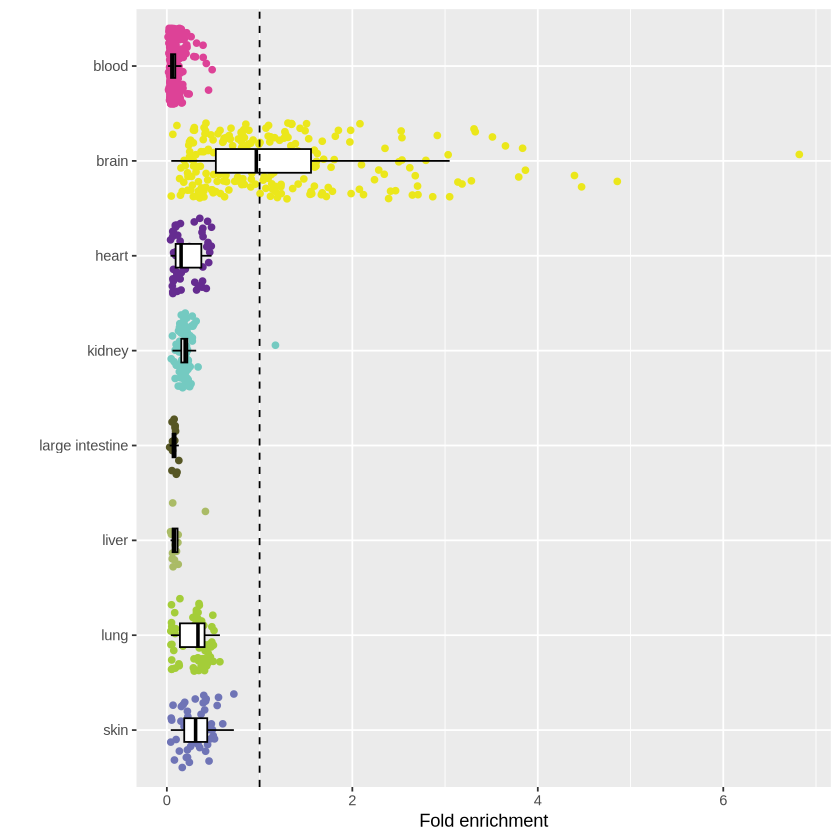

In [17]:
## Supplementary Figure 6b

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-6b.Loupe-DNase-Enrichment.txt", sep="\t")

data$V12 = factor(data$V12,levels = rev(c(" blood", " brain", " heart", " kidney", " large intestine", " liver", " lung", " skin")))
ggplot(data, aes(y=V12, x=V5*100, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("% of cCREs") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6")))

ggplot(data, aes(y=V12, x=V5/V8, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("Fold enrichment") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6"))) +
    geom_vline(xintercept=1, linetype="dashed")

pairwise.wilcox.test(data$V5/data$V8, data$V12, padj="fdr")

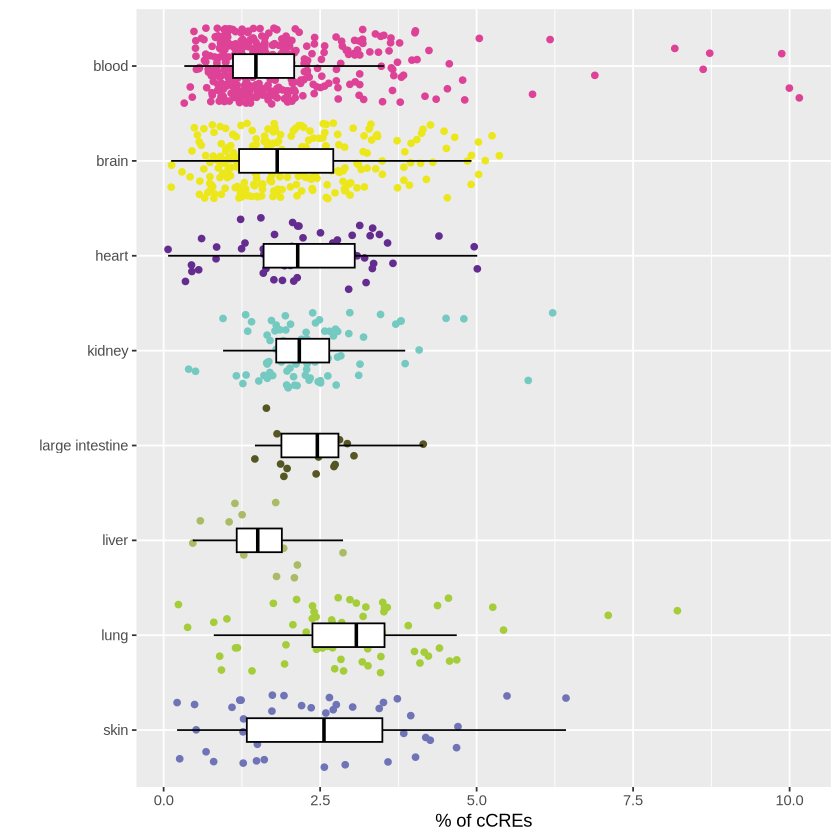


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V5/data$V8 and data$V12 

                  skin    lung    liver   large intestine  kidney  heart 
 lung            0.00192 -       -       -                -       -      
 liver           1.00000 0.35172 -       -                -       -      
 large intestine 1.00000 0.03790 1.00000 -                -       -      
 kidney          1.00000 1.1e-09 1.00000 1.00000          -       -      
 heart           0.67712 0.14608 1.00000 1.00000          0.00015 -      
 brain           8.7e-08 1.00000 0.06202 0.00127          < 2e-16 4.9e-06
 blood           1.00000 1.2e-05 1.00000 1.00000          0.00202 0.67712
                  brain 
 lung            -      
 liver           -      
 large intestine -      
 kidney          -      
 heart           -      
 brain           -      
 blood           < 2e-16

P value adjustment method: holm 

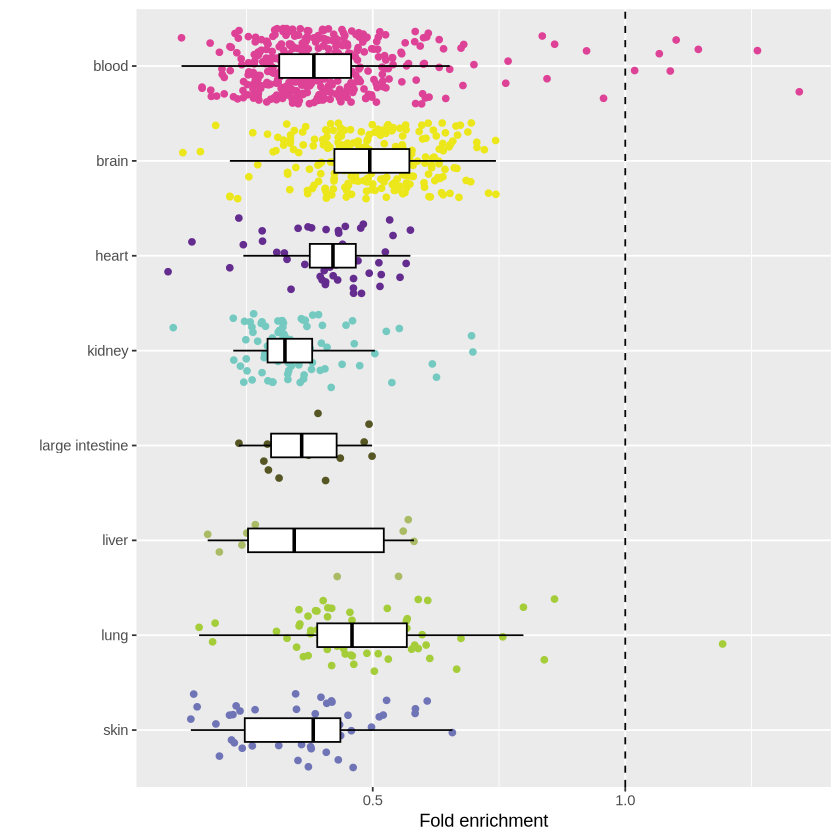

In [16]:
## Supplementary Figure 6c

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-6c.tcREs-DNase-Enrichment.txt", sep="\t")

data$V12 = factor(data$V12,levels = rev(c(" blood", " brain", " heart", " kidney", " large intestine", " liver", " lung", " skin")))
ggplot(data, aes(y=V12, x=V5*100, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("% of cCREs") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6")))

ggplot(data, aes(y=V12, x=V5/V8, color=V12)) + geom_jitter() + geom_boxplot(width=0.25, outlier.shape=NA, color="black", fill="white") + 
    xlab("Fold enrichment") + ylab("") + theme(legend.position="none") + 
    scale_color_manual(values=rev(c("#dd4297","#ebe71b","#652c90","#74cac1","#565624","#aabb66","#a4cd39","#6f74b6"))) +
    geom_vline(xintercept=1, linetype="dashed")

pairwise.wilcox.test(data$V5/data$V8, data$V12, padj="fdr")

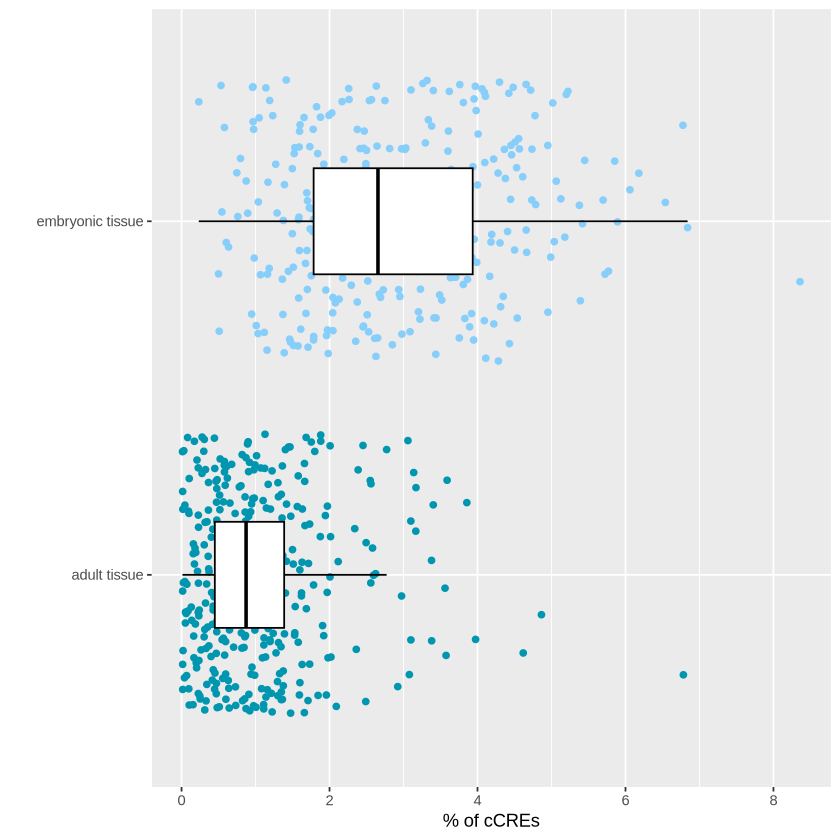


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V5/data$V8 and data$V13 

                 adult tissue
embryonic tissue <2e-16      

P value adjustment method: holm 

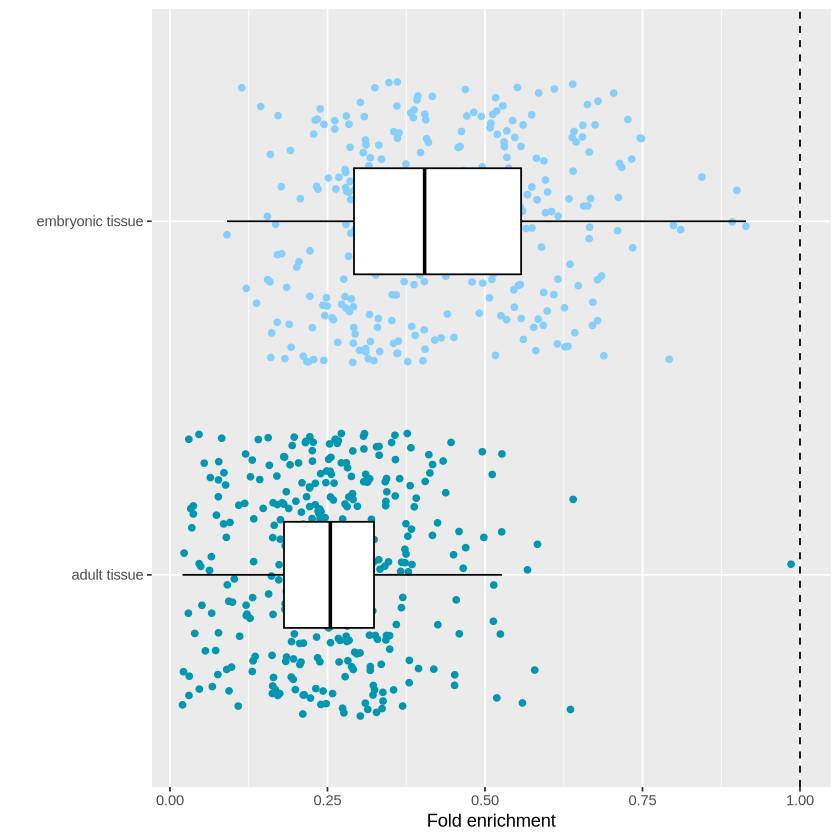

In [15]:
## Supplementary Figure 6d

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-6d.acREs-DNase-Enrichment.txt", sep="\t")

ggplot(data, aes(y=V13, x=V5*100, color=V13)) + geom_jitter() + 
    geom_boxplot(width=0.3, outlier.shape=NA, color="black", fill="white") + 
    xlab("% of cCREs") + ylab("") + theme(legend.position="none") + scale_color_manual(values=c("#0096b0","#87cefa"))

ggplot(data, aes(y=V13, x=V5/V8, color=V13)) + geom_jitter() +
    geom_vline(xintercept=1, linetype="dashed") + 
    geom_boxplot(width=0.3, outlier.shape=NA, color="black", fill="white") + 
    xlab("Fold enrichment") + ylab("") + theme(legend.position="none") + scale_color_manual(values=c("#0096b0","#87cefa"))

pairwise.wilcox.test(data$V5/data$V8, data$V13, padj="fdr")

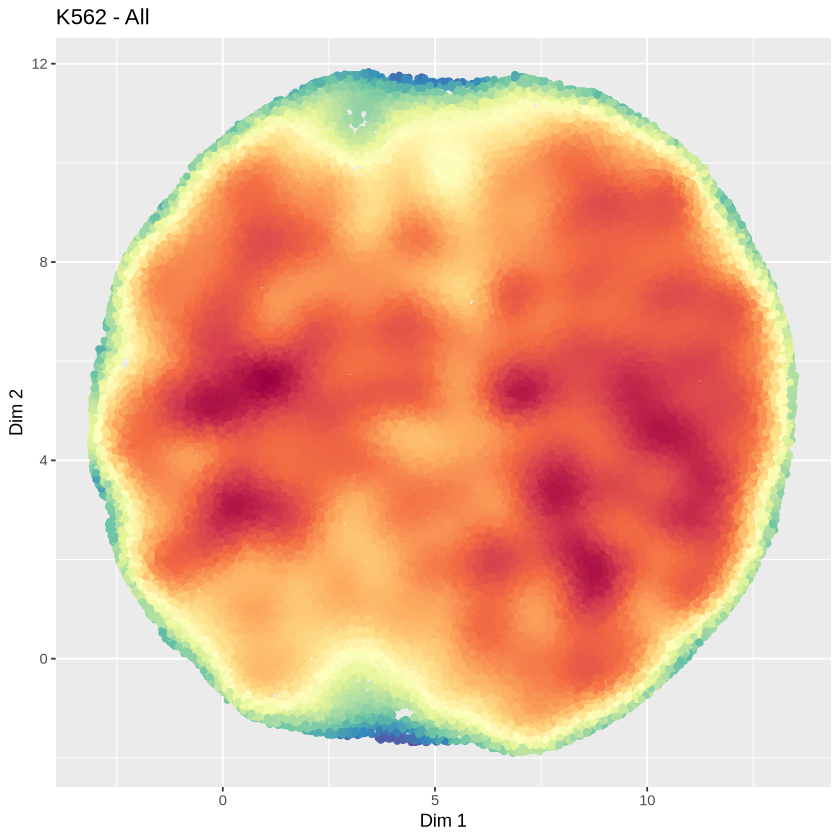

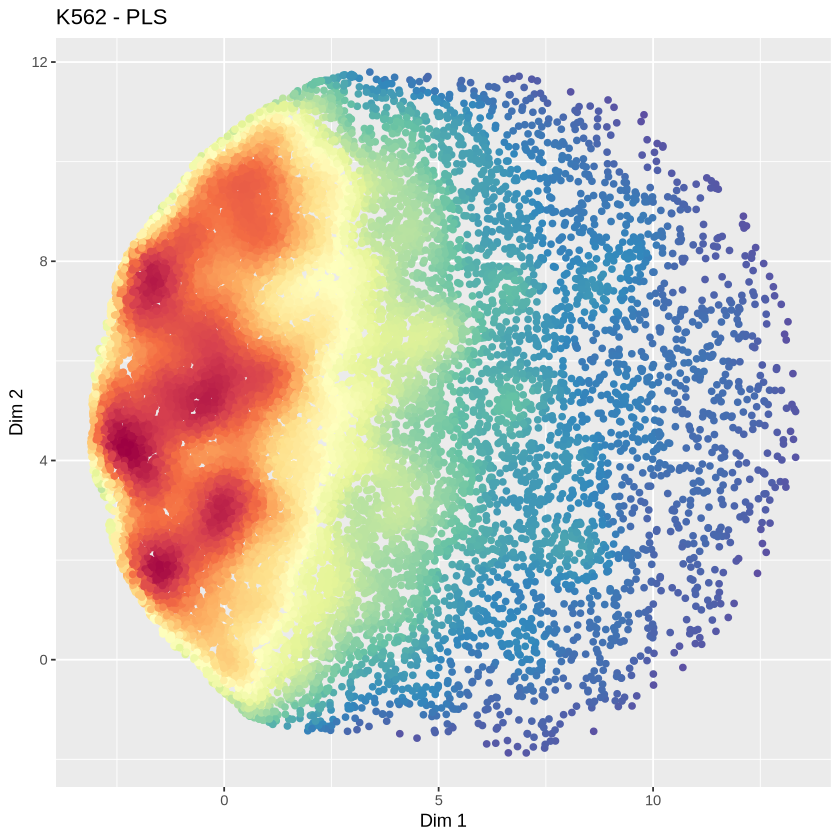

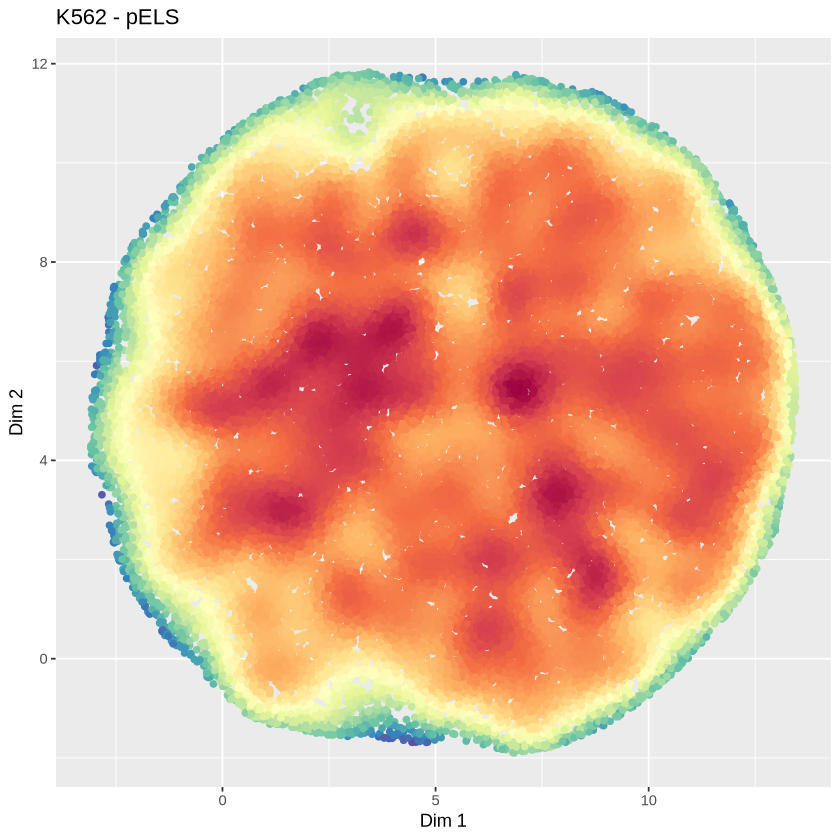

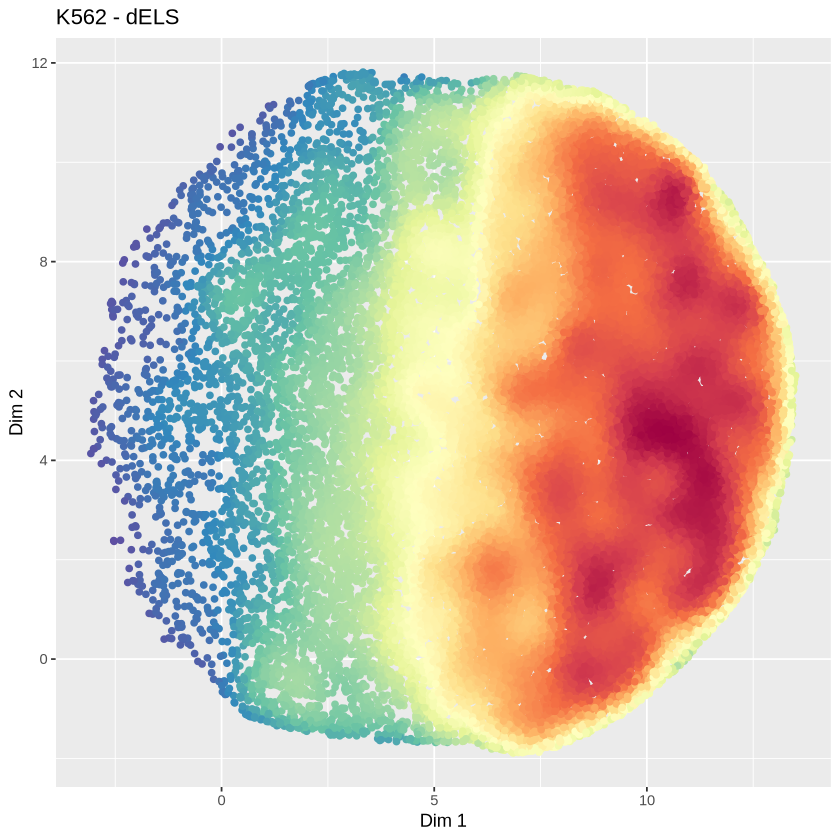

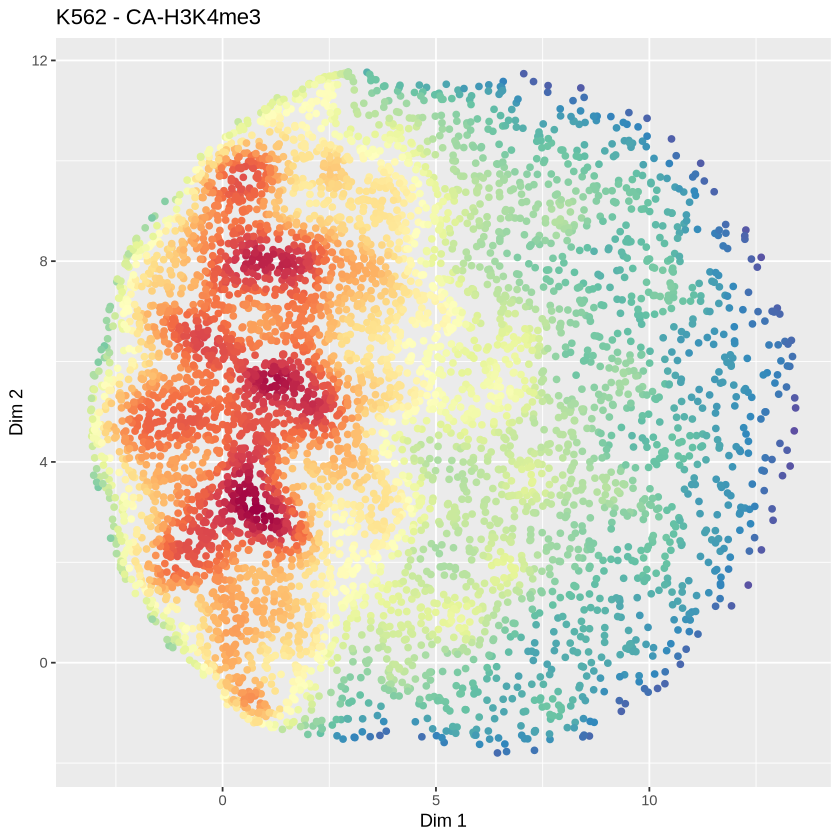

In [6]:
## Supplementary Figure 7

### K562
data=read.table("1_Updated-Registry/Figure-Input-Data/Extended-Data-Figure-2c.VAE-GC-K562.txt")

#All
df = data.frame(x = data$V3, y = data$V4, d = densCols(data$V3, data$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("K562 - All")

#PLS
df = data[data$V2 == "PLS",]
df = data.frame(x = df$V3, y = df$V4, d = densCols(df$V3, df$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("K562 - PLS")

#pELS
df = data[data$V2 == "pELS",]
df = data.frame(x = df$V3, y = df$V4, d = densCols(df$V3, df$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("K562 - pELS")

#dELS
df = data[data$V2 == "dELS",]
df = data.frame(x = df$V3, y = df$V4, d = densCols(df$V3, df$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("K562 - dELS")

#CA-H3K4me3
df = data[data$V2 == "CA-H3K4me3",]
df = data.frame(x = df$V3, y = df$V4, d = densCols(df$V3, df$V4, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("K562 - CA-H3K4me3")







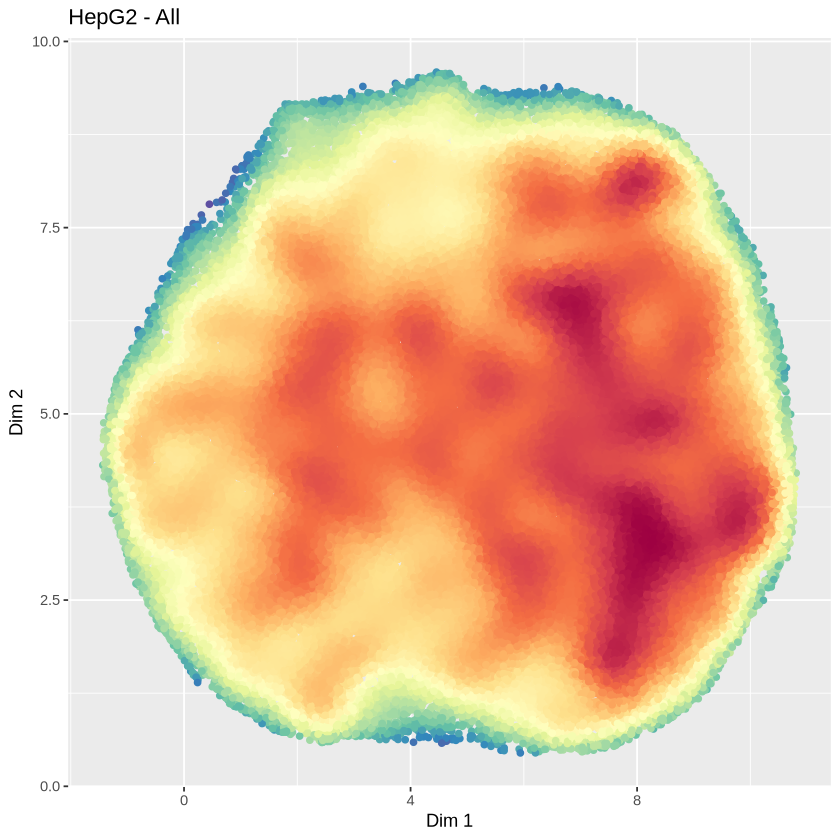

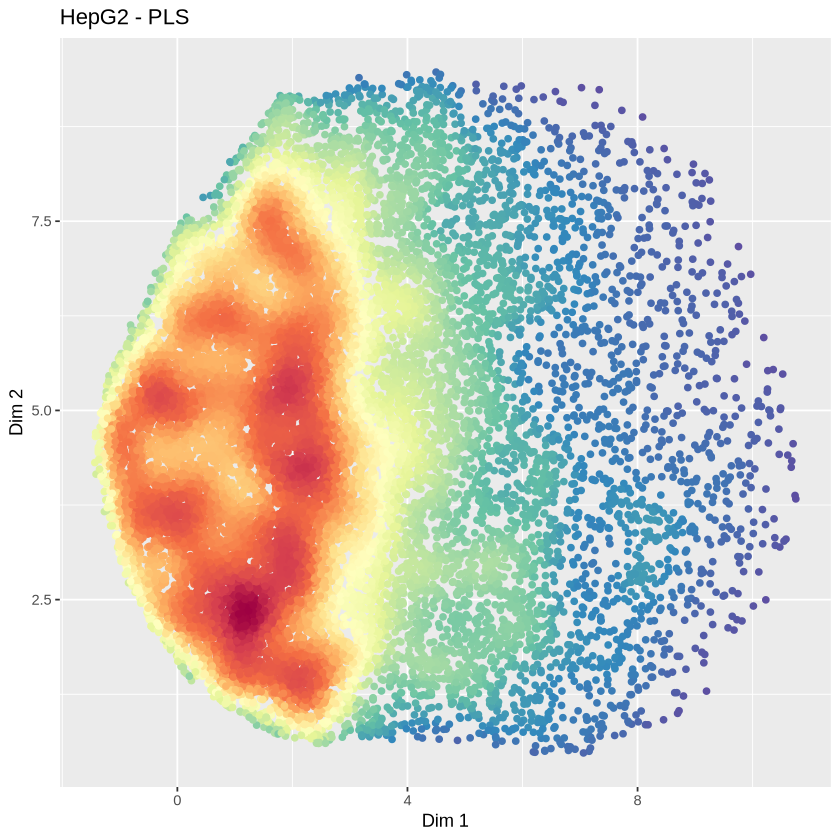

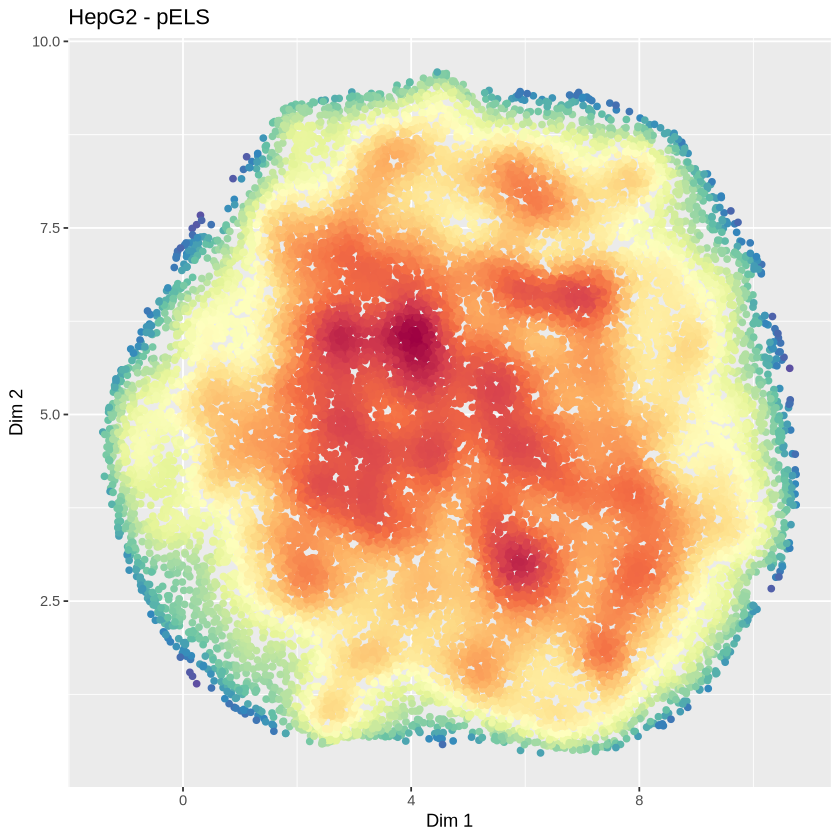

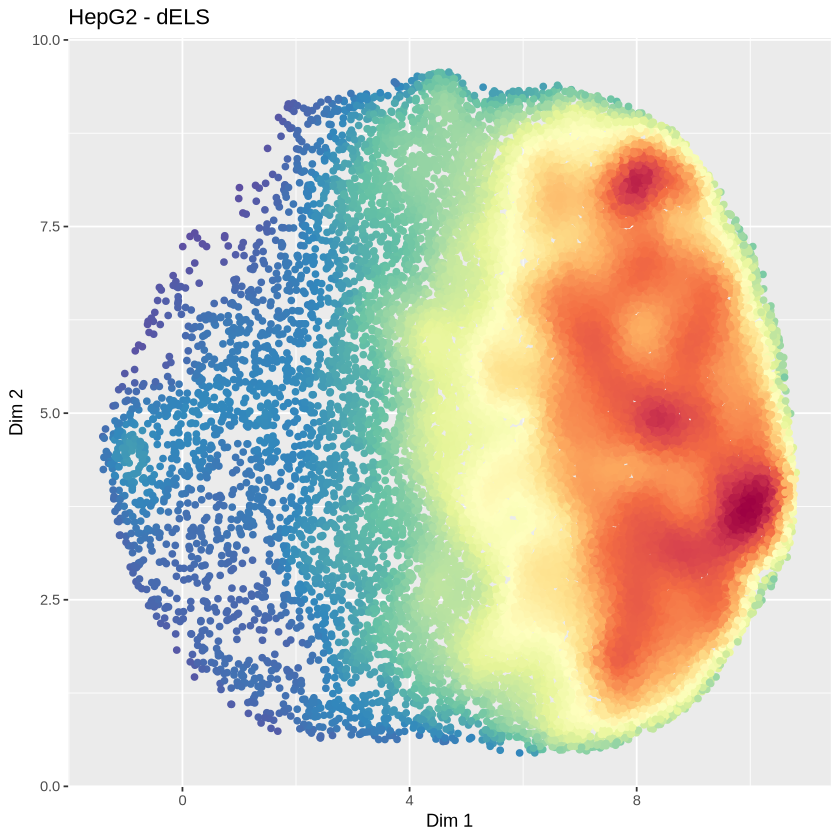

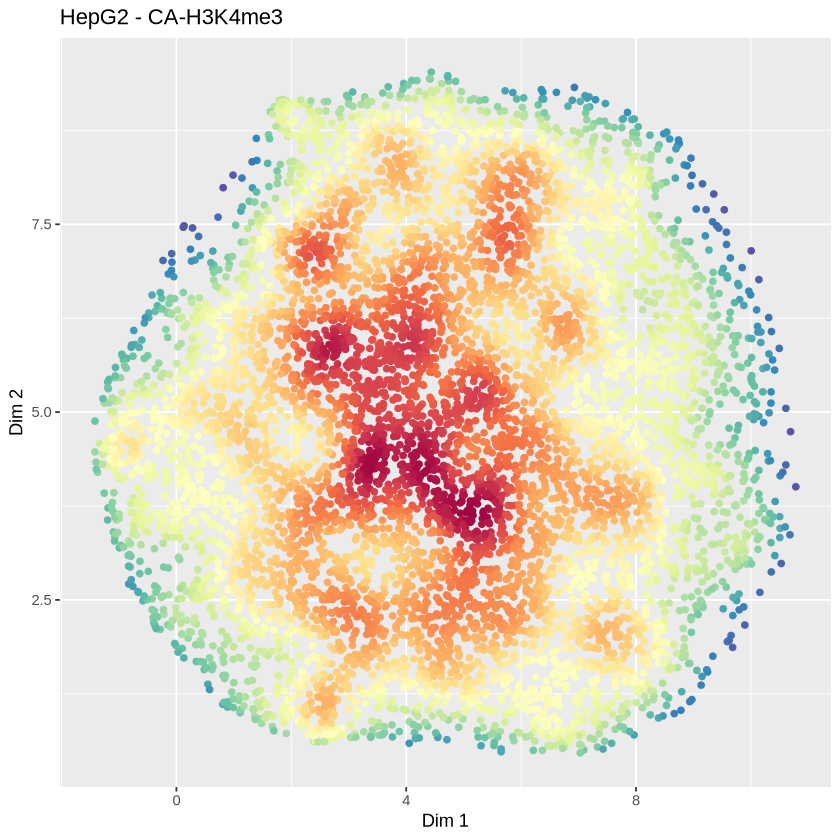

In [11]:
### HepG2
data=read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-7.HepG2-VAE-Results.txt")

#All
df = data.frame(x = data$V12, y = data$V13, d = densCols(data$V12, data$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HepG2 - All")

#PLS
df = data[data$V10 == "PLS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HepG2 - PLS")

#pELS
df = data[data$V10 == "pELS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HepG2 - pELS")

#dELS
df = data[data$V10 == "dELS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HepG2 - dELS")

#CA-H3K4me3
df = data[data$V10 == "CA-H3K4me3",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HepG2 - CA-H3K4me3")

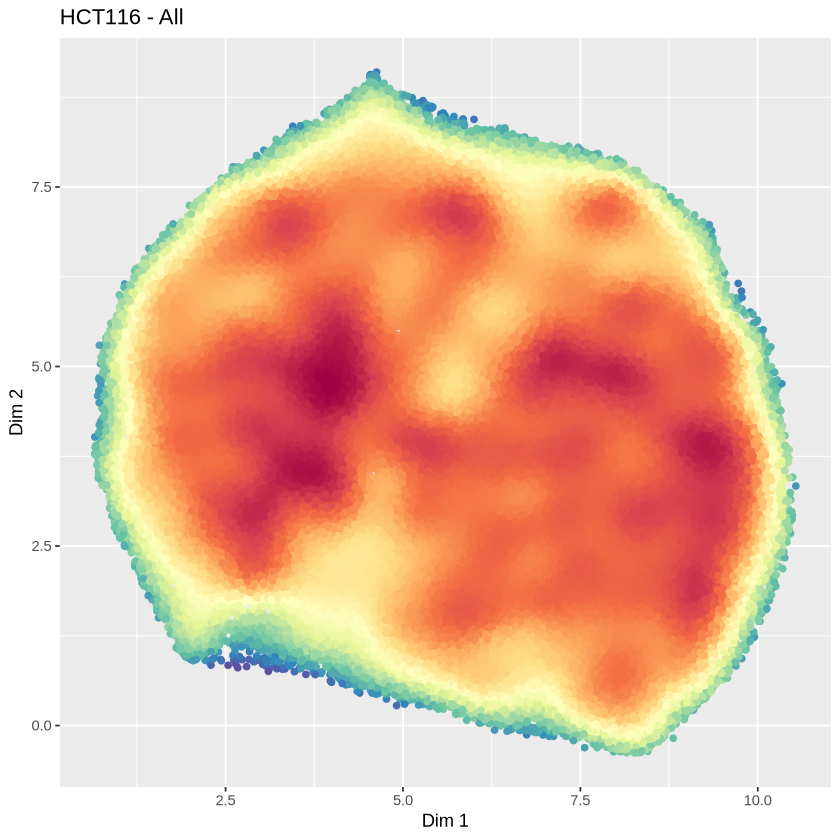

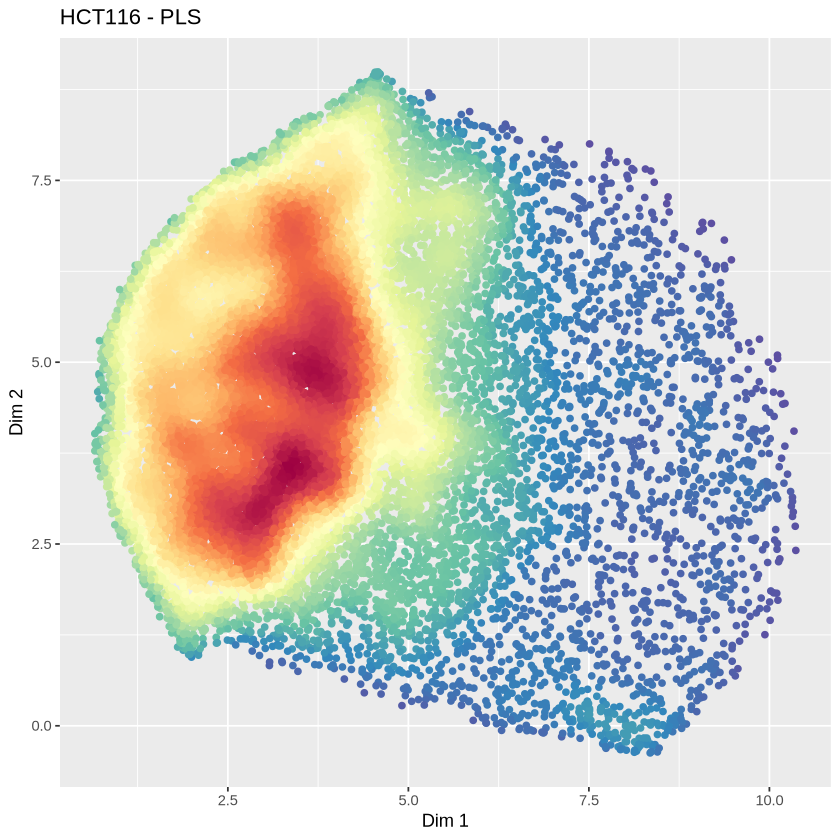

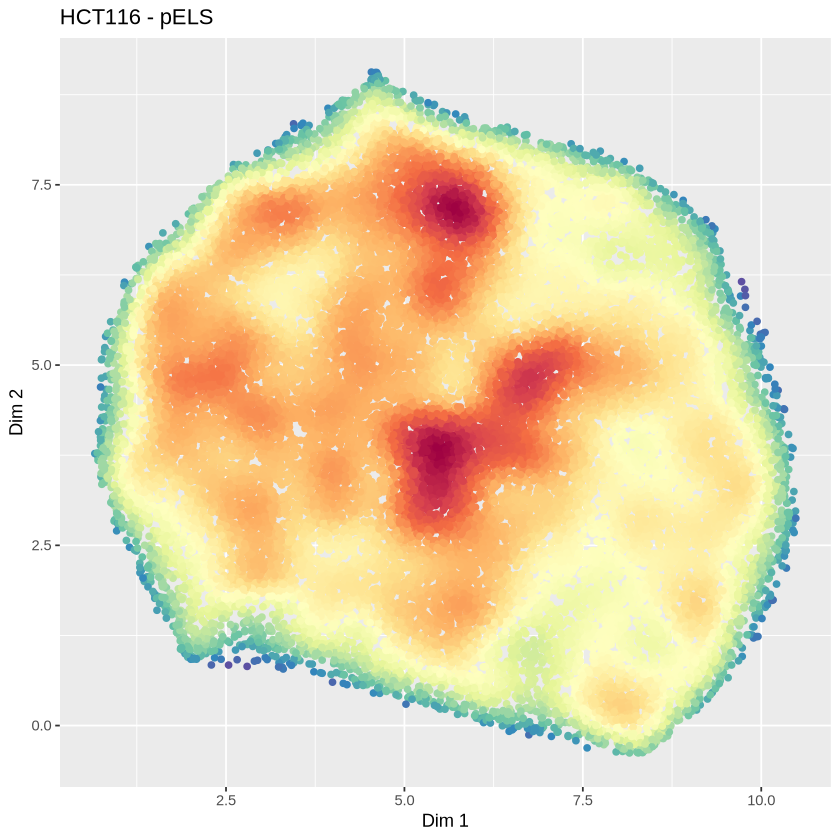

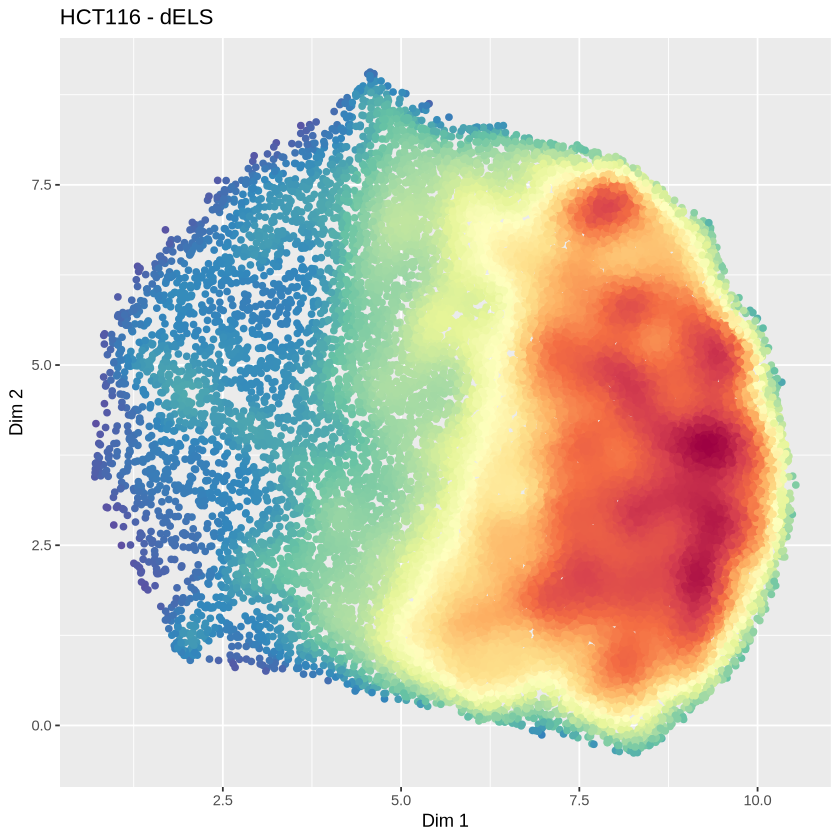

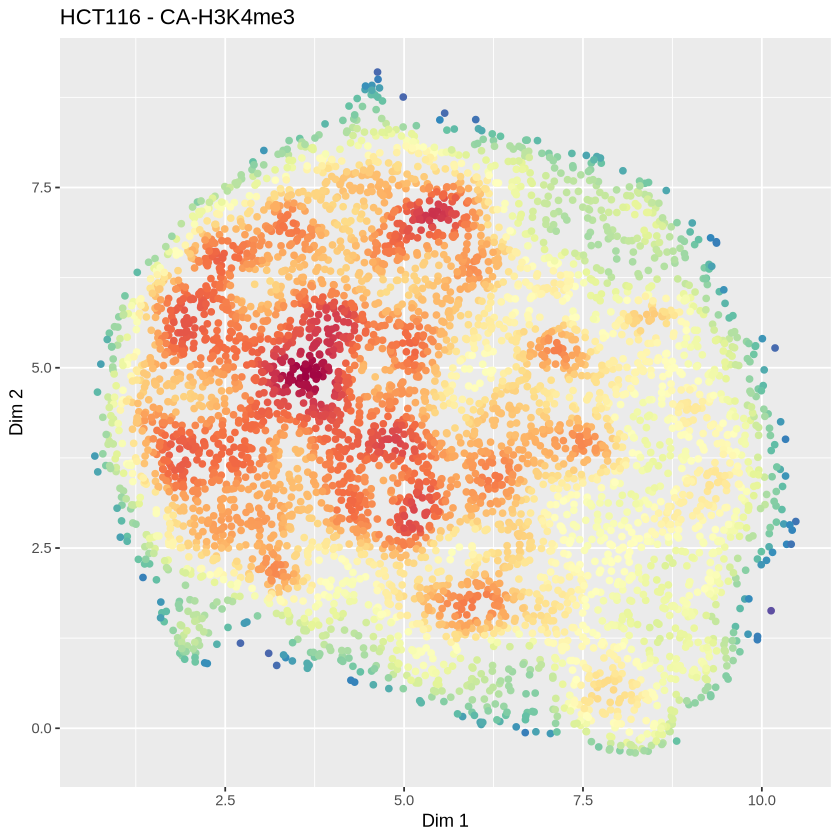

In [12]:
### HCT116
data=read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-7.HCT116-VAE-Results.txt")

#All
df = data.frame(x = data$V12, y = data$V13, d = densCols(data$V12, data$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HCT116 - All")

#PLS
df = data[data$V10 == "PLS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HCT116 - PLS")

#pELS
df = data[data$V10 == "pELS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HCT116 - pELS")

#dELS
df = data[data$V10 == "dELS",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HCT116 - dELS")

#CA-H3K4me3
df = data[data$V10 == "CA-H3K4me3",]
df = data.frame(x = df$V12, y = df$V13, d = densCols(df$V12, df$V13, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + xlab("Dim 1") + ylab("Dim 2") + ggtitle("HCT116 - CA-H3K4me3")


	Pearson's product-moment correlation

data:  df$V7 and df$V11
t = 41.841, df = 20039, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2706668 0.2961325
sample estimates:
      cor 
0.2834496 



	Pearson's product-moment correlation

data:  df$V7 and df$V11
t = 90.382, df = 35486, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.424085 0.441000
sample estimates:
      cor 
0.4325806 


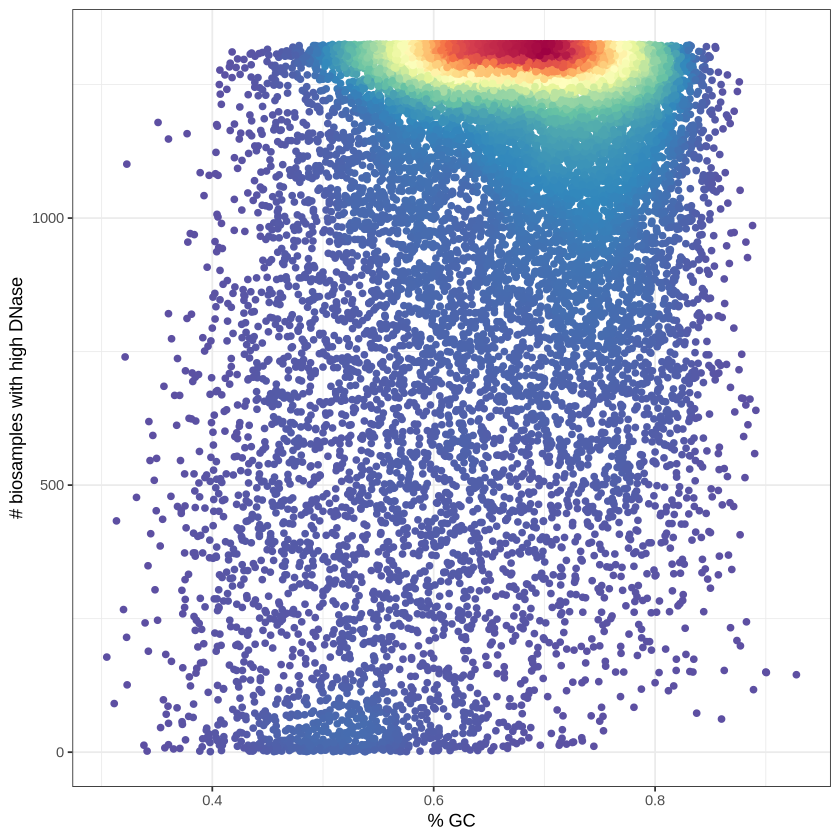

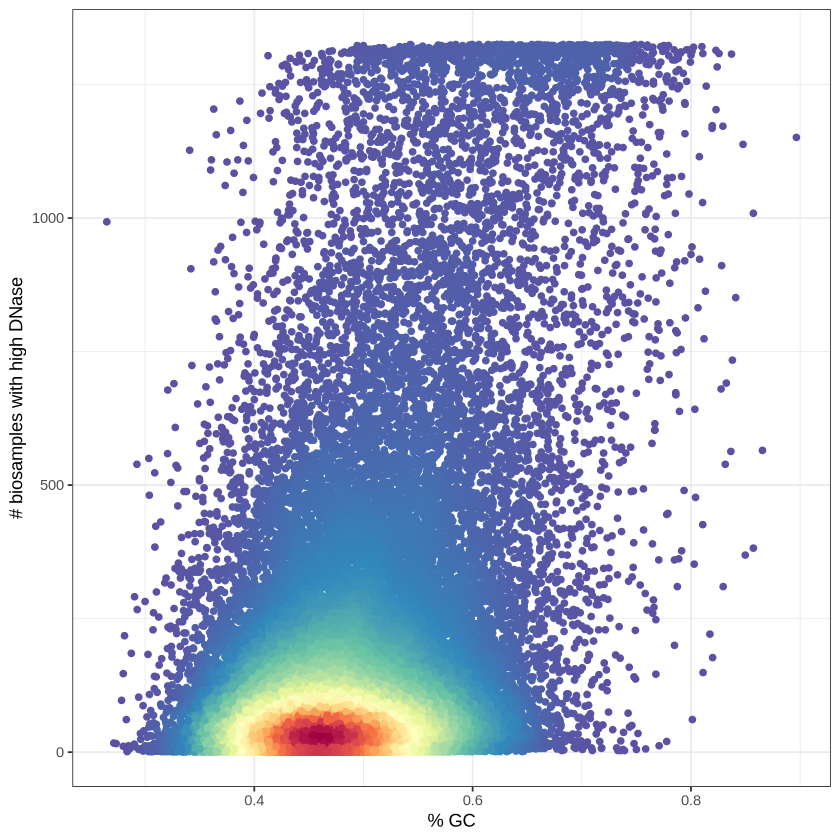

In [63]:
## Supplementary Figure 8a

data = read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-8a.DNase-Count-GC.txt")

df = data[data$V6 == "PLS",]
cor.test(df$V7, df$V11)
df = data.frame(x = df$V7, y = df$V11, d = densCols(df$V7, df$V11, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + theme_bw() + xlab("% GC") + ylab("# biosamples with high DNase")


df = data[data$V6 == "dELS",]
cor.test(df$V7, df$V11)
df = data.frame(x = df$V7, y = df$V11, d = densCols(df$V7, df$V11, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d))+geom_point()+scale_color_identity() + theme_bw() + xlab("% GC") + ylab("# biosamples with high DNase")


	Pearson's product-moment correlation

data:  log2((data$V5/data$V7)/(20041/35488)) and data$V8
t = 5.6243, df = 147, p-value = 9.111e-08
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.2788804 0.5447485
sample estimates:
      cor 
0.4208096 


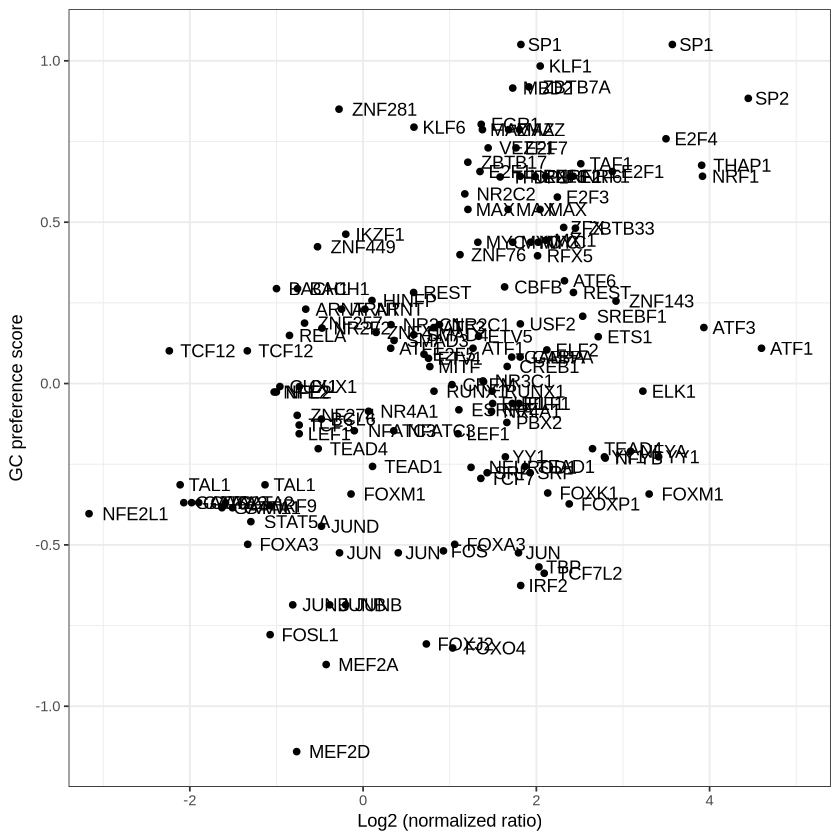

In [39]:
## Supplementary Figure 8c

data=read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-8c.GC-TF-Motif-Preference.txt")

ggplot(data2, aes(x=log2((V5/V7)/(20041/35488)), y=V8, label=V2)) + geom_point() + 
    geom_text(hjust=-0.2) + coord_cartesian(x=c(-3,5)) + 
    xlab("Log2 (normalized ratio)") + ylab("GC preference score") +
    theme_bw()
cor.test(log2((data$V5/data$V7)/(20041/35488)), data$V8)


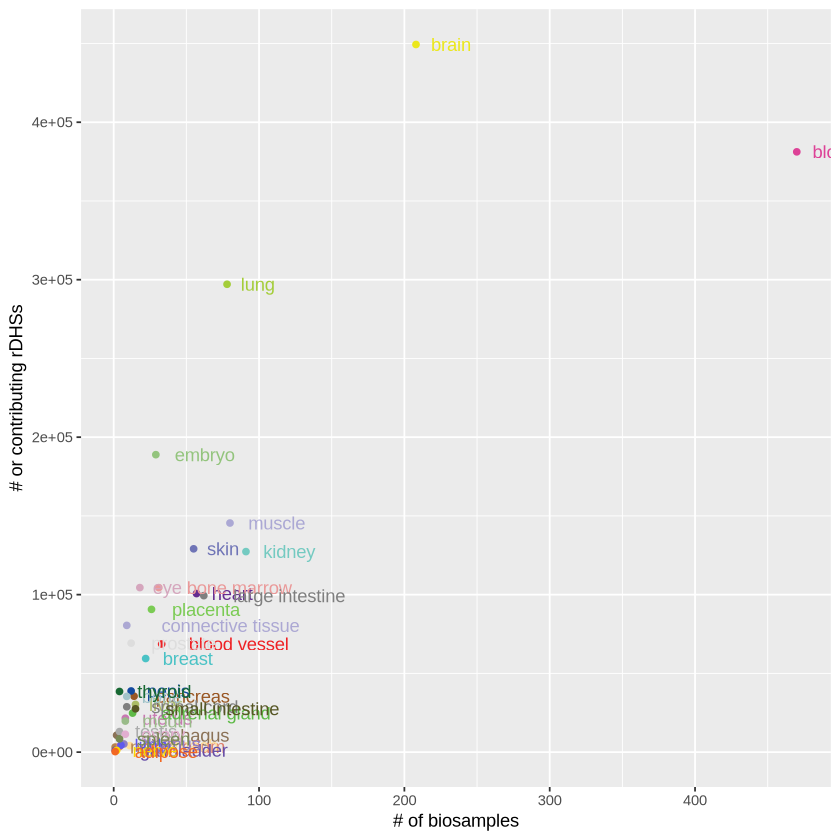

In [30]:
## Supplementary Figure 9

data=read.table("1_Updated-Registry/Figure-Input-Data/Supplementary-Figure-9.rDHS-Contribution-Organ-Tissue.txt", sep="\t")

colors = c(
  " pancreas "         = "#995724",
  " blood "            = "#dd4297",
  " brain "            = "#ebe71b",
  " embryo "           = "#93c47d",
  " uterus "           = "#c878b2",
  " skin "             = "#6f74b6",
  " lung "             = "#a4cd39",
  " heart "            = "#652c90",
  " liver "            = "#aabb66",
  " blood vessel "     = "#ee2124",
  " connective tissue " = "#aca8d3",
  " prostate "         = "#dddddd",
  " breast "           = "#4ac2c5",
  " nose "             = "#b5834f",
  " muscle "           = "#aba8d4",
  " mouth "            = "#99bb89",  
  " bone marrow "      = "#ea9999",
  " large instestine "            = "#ca9855",  
  " placenta "         = "#7bcb54",
  " eye "              = "#d5a6bd",
  " esophagus "        = "#8b7257",
  " penis "            = "#144a9f",
  " epithelium "       = "#dd7e6b",
  " kidney "           = "#74cac1",
  " testis "           = "#aaabab",
  " stomach "          = "#ffdd99",
  " gallbladder "      = "#674ea7",
  " adrenal gland "    = "#5eba47",
  " small intestine "  = "#565624",
  " bone "             = "#a2c4c9",
  " ovary "            = "#e1aed0",
  " thymus "           = "#8e7cc3",
  " thyroid "          = "#186833",
  " limb "             = "#5f58ed",
  " nerve "            = "#fdd800",  
  " spleen "           = "#778955",
  " adipose "          = "#f26822"
)

ggplot(data, aes(y=V3, x=V2, label=V1, color=V1)) + geom_point() +  geom_text(hjust=-0.2) + 
    theme(legend.position="none") + scale_color_manual(values=colors) +
    xlab("# of biosamples") + ylab("# or contributing rDHSs") 


Method,variable,value
<chr>,<fct>,<int>
MPRA,K562.cCRE,930
STARR,K562.cCRE,39800
CRISPR,K562.cCRE,56
MPRA,All.cCRE,2903
STARR,All.cCRE,130529
CRISPR,All.cCRE,15
MPRA,No.cCRE,1955
STARR,No.cCRE,45734
CRISPR,No.cCRE,5


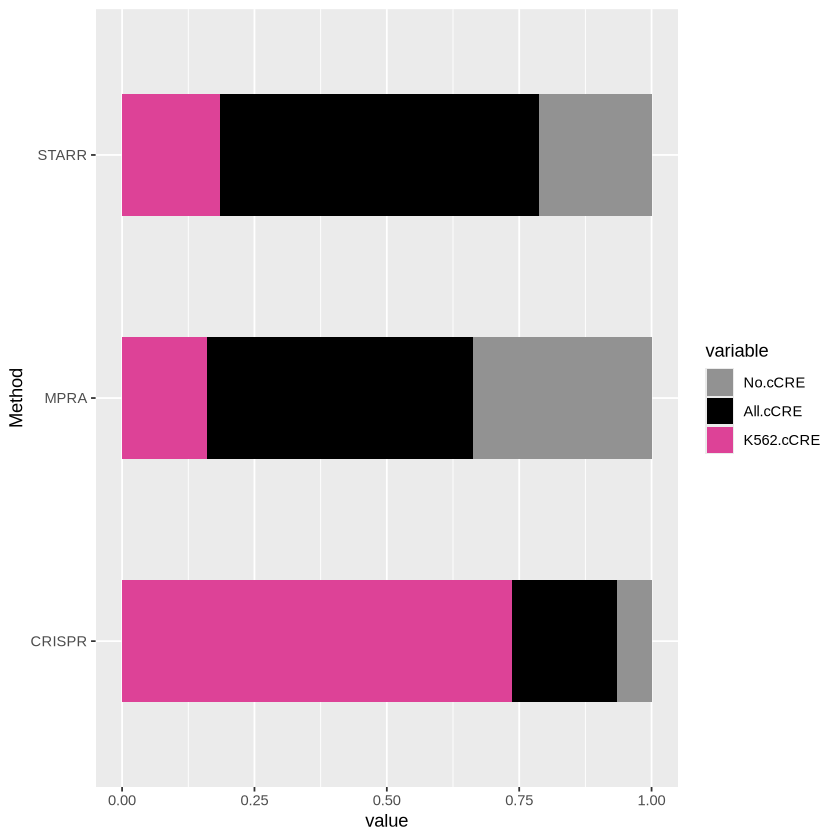

In [4]:
## Supplementary Figure 10aei

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-10aei.FCC-Positive-Overlap.txt", header=T)
meltedData=melt(data, id="Method")
meltedData$variable = factor(meltedData$variable,levels = c("No.cCRE", "All.cCRE", "K562.cCRE"))
meltedData

ggplot(meltedData, aes(y=Method, x=value, fill=variable)) + geom_bar(stat="identity", position="fill", width=0.5) +
    scale_fill_manual(values=c("#929292","black","#dd4297"))

Method,Group,Positive,Tested,Fraction
<chr>,<fct>,<int>,<int>,<dbl>
MPRA,k562-ccres,803,1583,0.50726500
MPRA,all-ccres,2831,11323,0.25002200
MPRA,no-ccres,841,4906,0.17142300
STARR,k562-ccres,75815,172254,0.44013500
STARR,all-ccres,227113,2127457,0.10675300
STARR,no-ccres,21314,1671922,0.01274820
CRISPR,k562-ccres,151,1443,0.10464300
CRISPR,all-ccres,23,8098,0.00284021
CRISPR,no-ccres,4,3961,0.00100985



	Pearson's Chi-squared test

data:  data[c(1, 2, 3), c(3, 4)]
X-squared = 380.27, df = 2, p-value < 2.2e-16


[1] 2.959142


	Pearson's Chi-squared test

data:  data[c(4, 5, 6), c(3, 4)]
X-squared = 299114, df = 2, p-value < 2.2e-16


[1] 34.52527


	Pearson's Chi-squared test

data:  data[c(7, 8, 9), c(3, 4)]
X-squared = 938.87, df = 2, p-value < 2.2e-16


[1] 103.6223

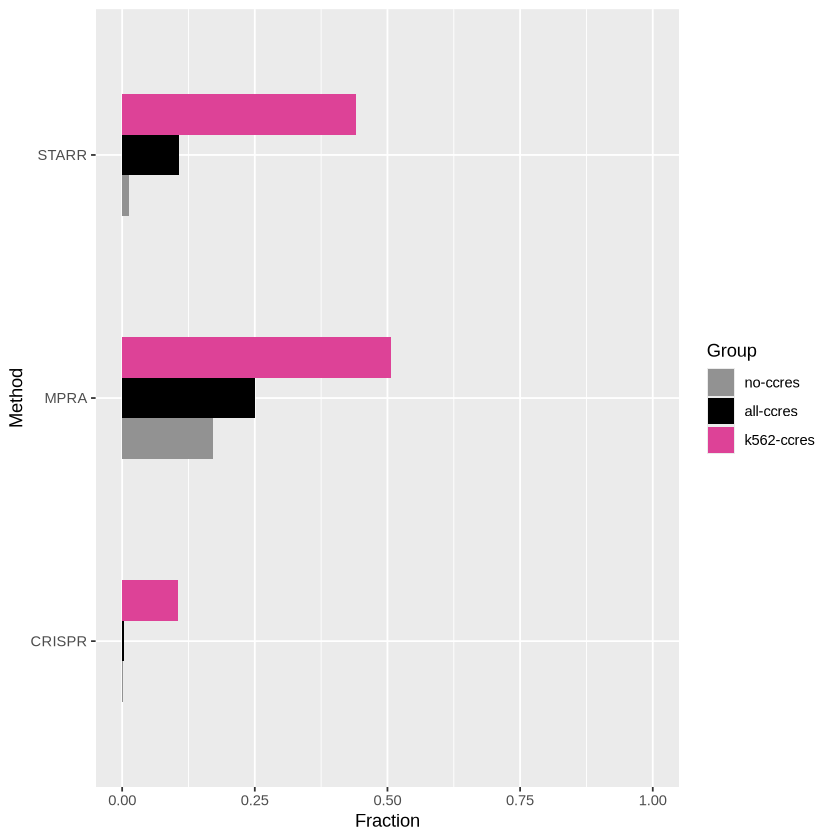

In [33]:
## Supplementary Figure 10bfj

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-10bfj.FCC-Positive-Activity.txt", header=T)
data$Group = factor(data$Group,levels = c("no-ccres", "all-ccres", "k562-ccres"))
ggplot(data, aes(y=Method, x=Fraction, fill=Group)) + geom_bar(stat="identity", position="dodge", width =0.5) +
    scale_fill_manual(values=c("#929292","black","#dd4297"))+coord_cartesian(xlim=c(0,1))

data

#MPRA
chisq.test(data[c(1,2,3),c(3,4)])
data[1,5]/data[3,5]

#STARR
chisq.test(data[c(4,5,6),c(3,4)])
data[4,5]/data[6,5]

#CRISPR
chisq.test(data[c(7,8,9),c(3,4)])
data[7,5]/data[9,5]



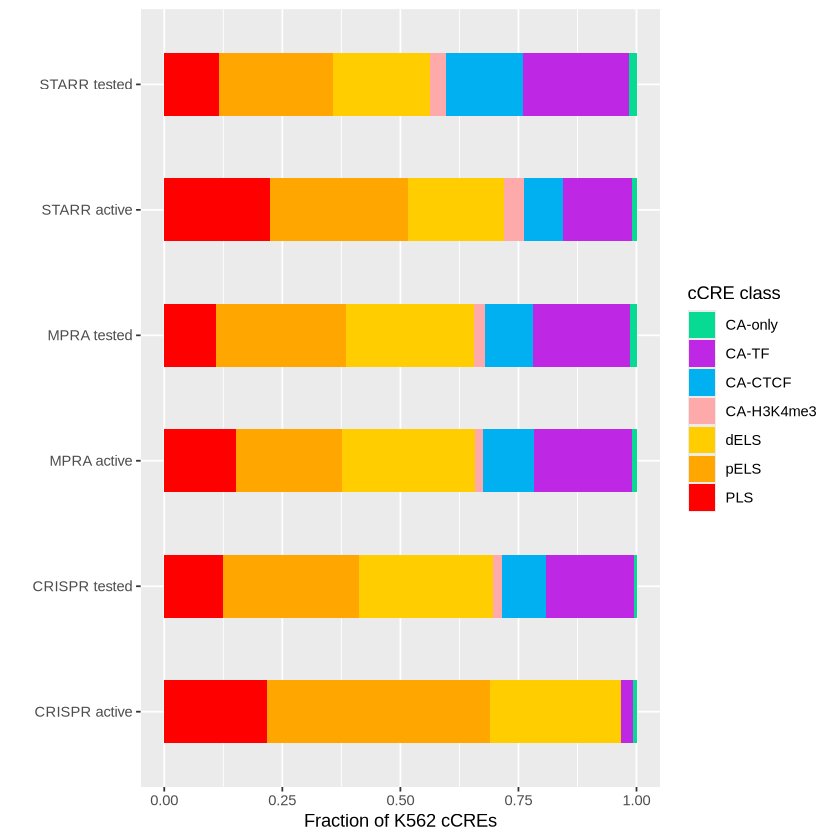

In [5]:
## Supplementary Figure 10cdghkl

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-10cdghkl.FCC-cCRE-Class.txt")
data$V3= factor(data$V3,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA-only")))
ggplot(data, aes(y=paste(V1,V2), x=V4, fill=V3)) + geom_bar(stat="identity", position="fill", width=0.5) +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93"))) +
    ylab("") + xlab("Fraction of K562 cCREs")


	Pearson's product-moment correlation

data:  data$V2 and data$V3
t = 269.94, df = 21733, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.8745553 0.8806647
sample estimates:
      cor 
0.8776456 


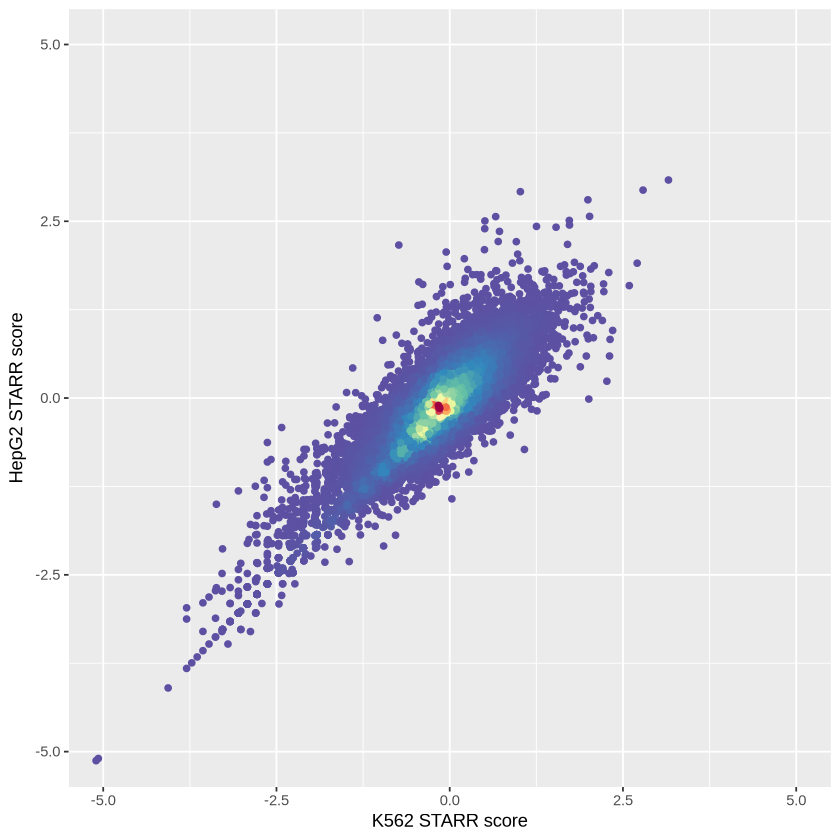

In [67]:
## Supplementary Figure 12a

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-12a.STARR-K562-HepG2-PLS.txt")
df = data.frame(x = data$V2, y = data$V3, d = densCols(data$V2, data$V3, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d)) + geom_point() + scale_color_identity() + coord_cartesian(x=c(-5,5),y=c(-5,5)) + 
    xlab("K562 STARR score") + ylab("HepG2 STARR score")
cor.test(data$V2, data$V3)


	Pearson's product-moment correlation

data:  data$V2 and data$V3
t = 1205.3, df = 1088303, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.7553046 0.7569140
sample estimates:
      cor 
0.7561104 


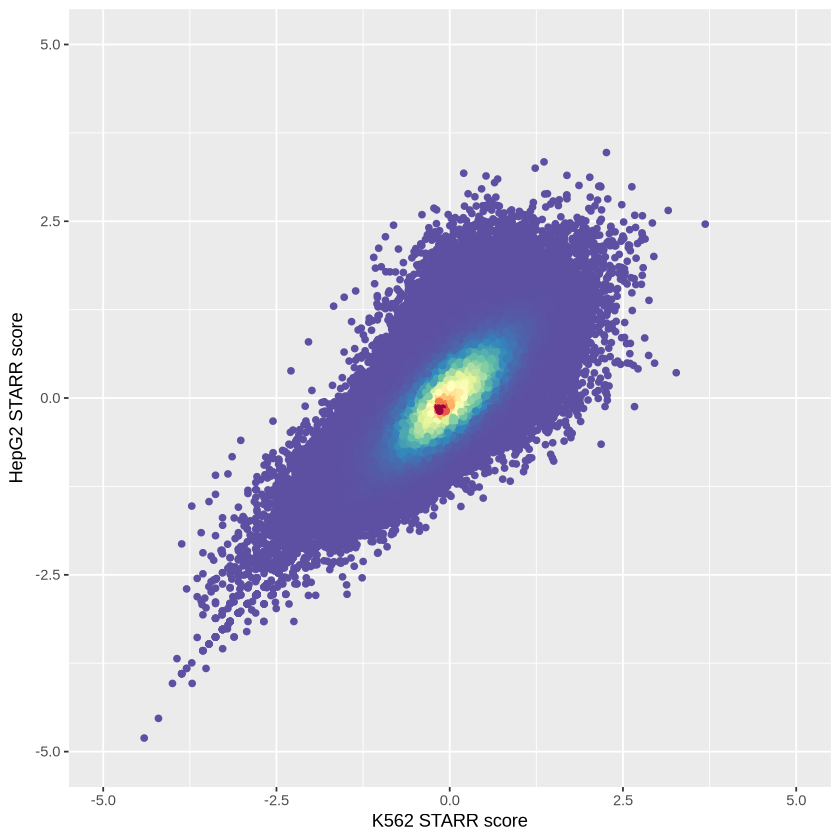

In [69]:
## Supplementary Figure 12b

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-12b.STARR-K562-HepG2-dELS.txt")
df = data.frame(x = data$V2, y = data$V3, d = densCols(data$V2, data$V3, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d)) + geom_point() + scale_color_identity() + coord_cartesian(x=c(-5,5),y=c(-5,5)) + 
    xlab("K562 STARR score") + ylab("HepG2 STARR score")
cor.test(data$V2, data$V3)

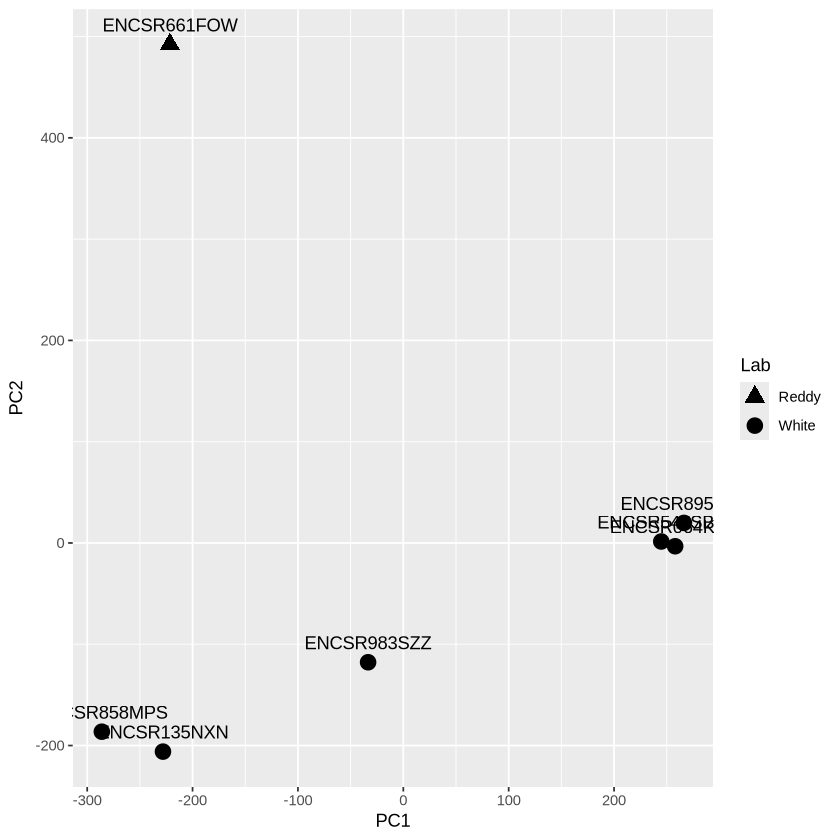

In [45]:
## Supplementary Figure 12c

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-12c.CAPRA-Cross-Cell-PCA.txt")
lab = c("Reddy", rep("White", 6))
ggplot(data, aes(x=V2, y=V3, shape=lab, label=V1)) + geom_point(size=4) + scale_shape_manual(name="Lab", values=c(17,19)) +
    xlab("PC1") + ylab("PC2") + geom_text(vjust = -1)


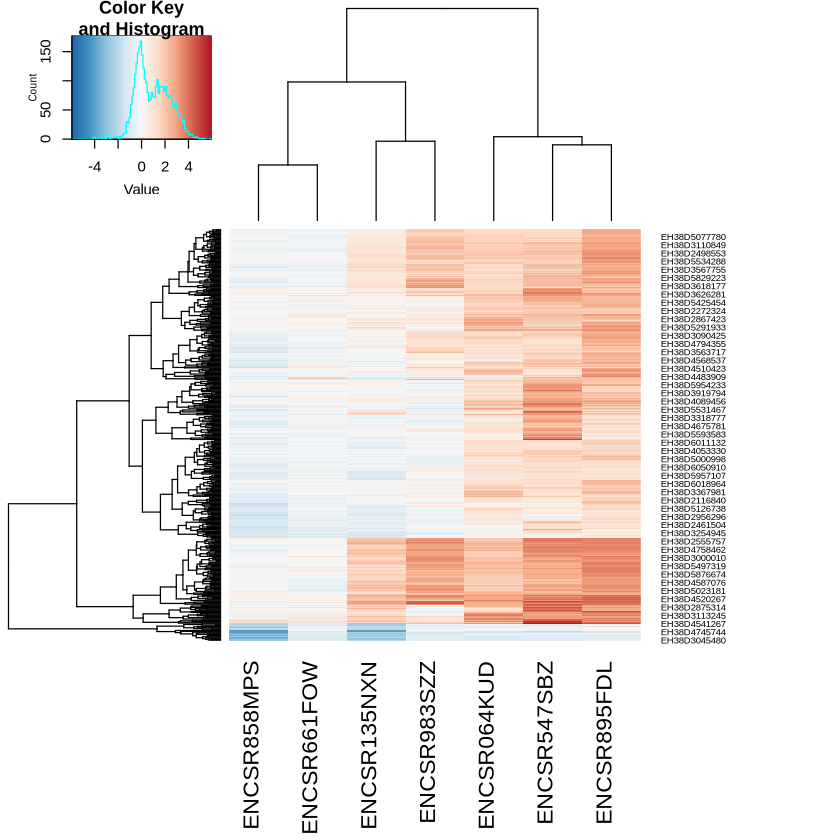

In [61]:
## Supplementary Figure 12d

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-12d.CAPRA-Cross-Cell-PC1.txt", header=T, row.names=1)
colors = rev(colorRampPalette(brewer.pal(9,"RdBu"))(100))
heatmap.2(data.matrix(data), col=colors, trace="none", margins=c(10,10))

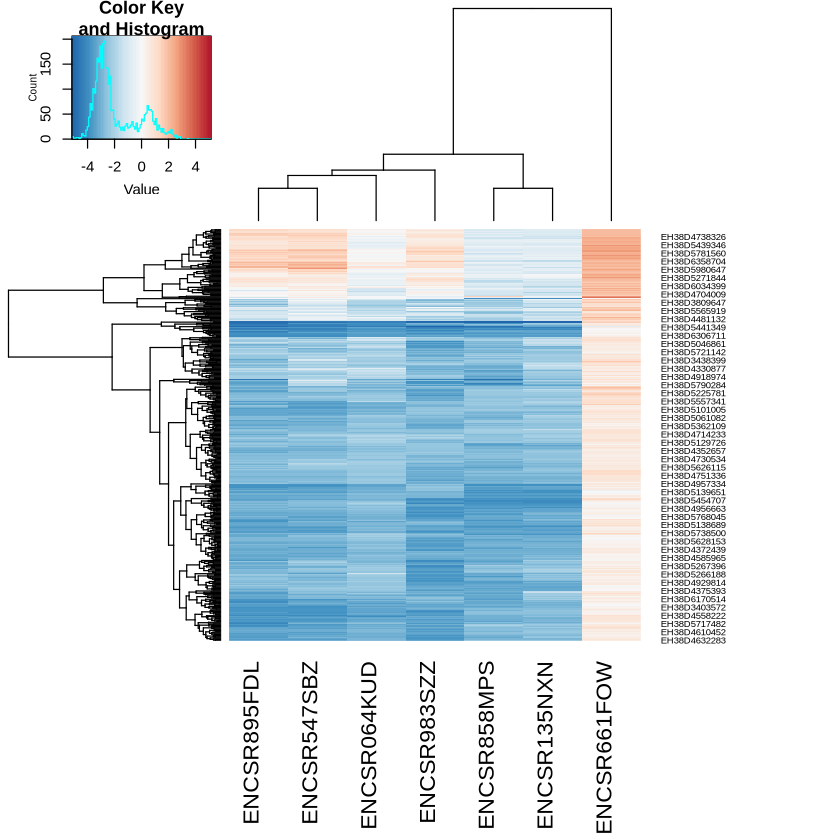

In [60]:
## Supplementary Figure 12e

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-12e.CAPRA-Cross-Cell-PC2.txt", header=T, row.names=1)
colors = rev(colorRampPalette(brewer.pal(9,"RdBu"))(100))
heatmap.2(data.matrix(data), col=colors, trace="none", margins=c(10,10))

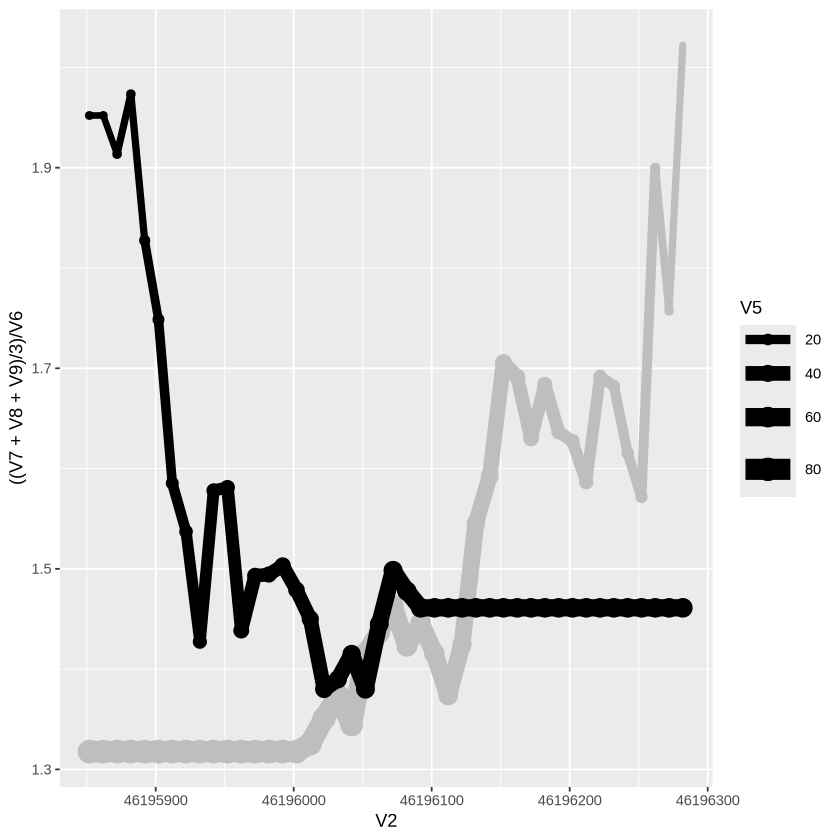

In [53]:
##Supplementary Figure 12f

data1 = read.table("REVISIONS/STARR/Example/tmp1.summary")
data2 = read.table("REVISIONS/STARR/Example/tmp2.summary")

ggplot(data1, aes(x=V2, y=((V7+V8+V9)/3)/V6, size=V5)) + geom_line(color="gray") + geom_point(color="gray") +
    geom_line(data=data2, aes(x=V2, y=((V7+V8+V9)/3)/V6, size=V5), color="black") +
    geom_point(data=data2, aes(x=V2, y=((V7+V8+V9)/3)/V6, size=V5), color="black")

Warning message in chisq.test(miniData[, c(4, 5)]):
“Chi-squared approximation may be incorrect”



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 894.93, df = 5, p-value < 2.2e-16


Warning message in chisq.test(miniData[, c(4, 5)]):
“Chi-squared approximation may be incorrect”



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 561.71, df = 5, p-value < 2.2e-16



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 1043.6, df = 5, p-value < 2.2e-16


Warning message in chisq.test(miniData[, c(4, 5)]):
“Chi-squared approximation may be incorrect”



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 515.09, df = 5, p-value < 2.2e-16


Warning message in chisq.test(miniData[, c(4, 5)]):
“Chi-squared approximation may be incorrect”



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 94.338, df = 5, p-value < 2.2e-16


Warning message in chisq.test(miniData[, c(4, 5)]):
“Chi-squared approximation may be incorrect”



	Pearson's Chi-squared test

data:  miniData[, c(4, 5)]
X-squared = 143.55, df = 5, p-value < 2.2e-16


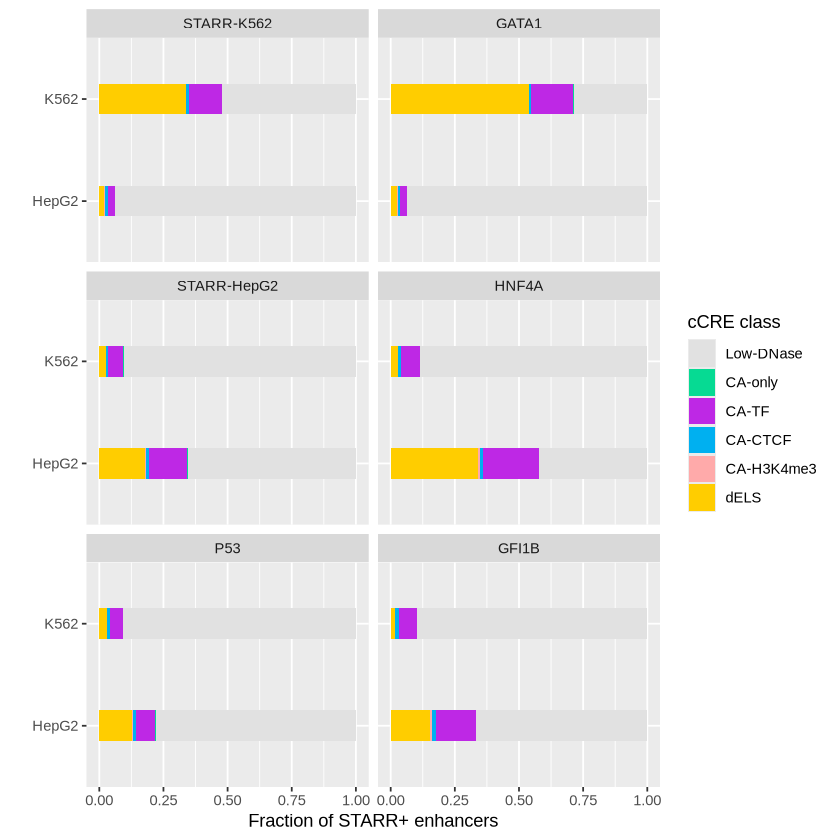

In [47]:
## Supplementary Figure 13

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-13.STARR-Enhancer-cCRE-Classification.txt", header=T)
data$class= factor(data$class,levels = rev(c("dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA-only","Low-DNase")))
data$group= factor(data$group,levels = c("STARR-K562","GATA1","STARR-HepG2","HNF4A","P53","GFI1B"))
meltedData=melt(data[,c(1,2,3,6)], id=c("class", "group"))
meltedData$variable= factor(meltedData$variable,levels = rev(c("K562", "HepG2")))
ggplot(meltedData, aes(y=variable, x=value, fill=class)) + geom_bar(stat="identity", position="fill", width=0.3) + facet_wrap(~ group, ncol=2) +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93", "#e1e1e1"))) +
    ylab("") + xlab("Fraction of STARR+ enhancers")

miniData=data[data$group == "STARR-K562",]
chisq.test(miniData[,c(4,5)])

miniData=data[data$group == "GATA1",]
chisq.test(miniData[,c(4,5)])

miniData=data[data$group == "STARR-HepG2",]
chisq.test(miniData[,c(4,5)])

miniData=data[data$group == "HNF4A",]
chisq.test(miniData[,c(4,5)])

miniData=data[data$group == "P53",]
chisq.test(miniData[,c(4,5)])

miniData=data[data$group == "GFI1B",]
chisq.test(miniData[,c(4,5)])



	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V1 

     Double
Solo <2e-16

P value adjustment method: holm 

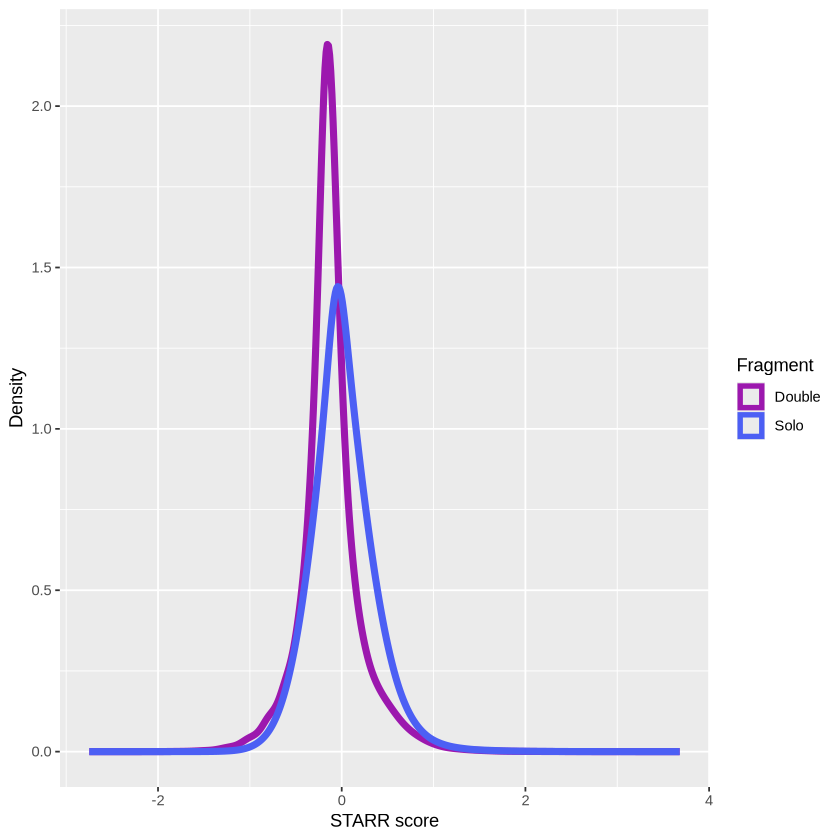

In [48]:
## Supplementary Figure 142
data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-14a.CAPRA-Solo-Double-Distribution.txt")
ggplot(data, aes(x=V2, color=V1)) + geom_density(linewidth=2, adjust=5) + scale_color_manual(name="Fragment", values=c("#9c18ae","#4c5ff4")) +
    xlab("STARR score") + ylab("Density")

pairwise.wilcox.test(data$V2, data$V1)

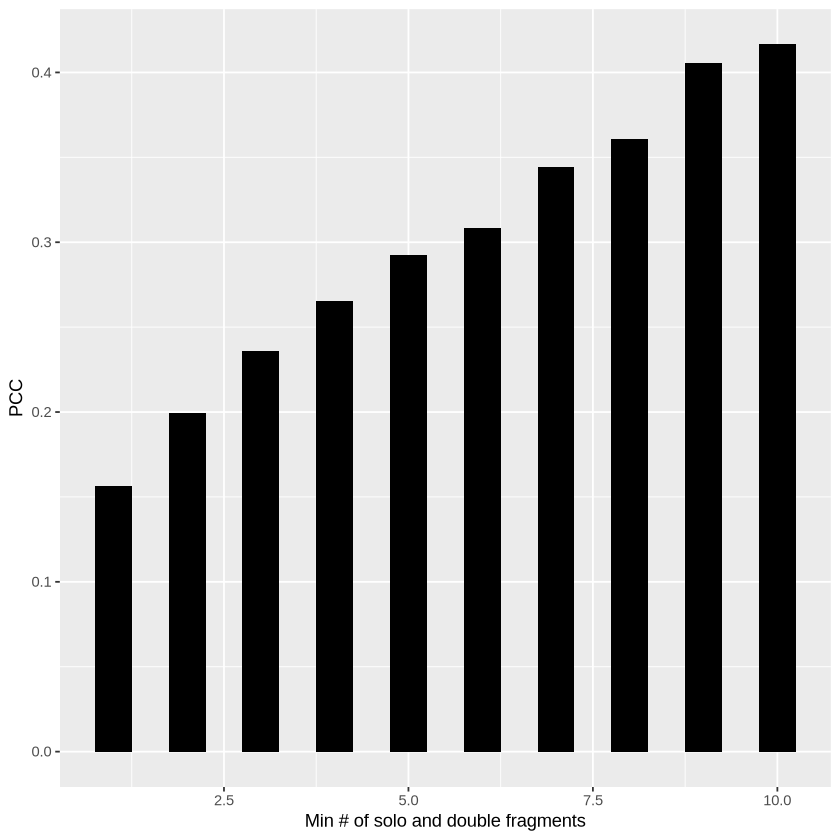

In [103]:
## Supplementary Figure 14b

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-14b.CAPRA-Solo-Double-PCC.txt")
ggplot(data, aes(x=V1, y=V2)) + geom_bar(stat="identity", width=0.5, fill="black") + 
    xlab("Min # of solo and double fragments") + ylab("PCC")


	Pearson's product-moment correlation

data:  data$V5 and data$V6
t = 73.101, df = 212226, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1525675 0.1608675
sample estimates:
      cor 
0.1567202 


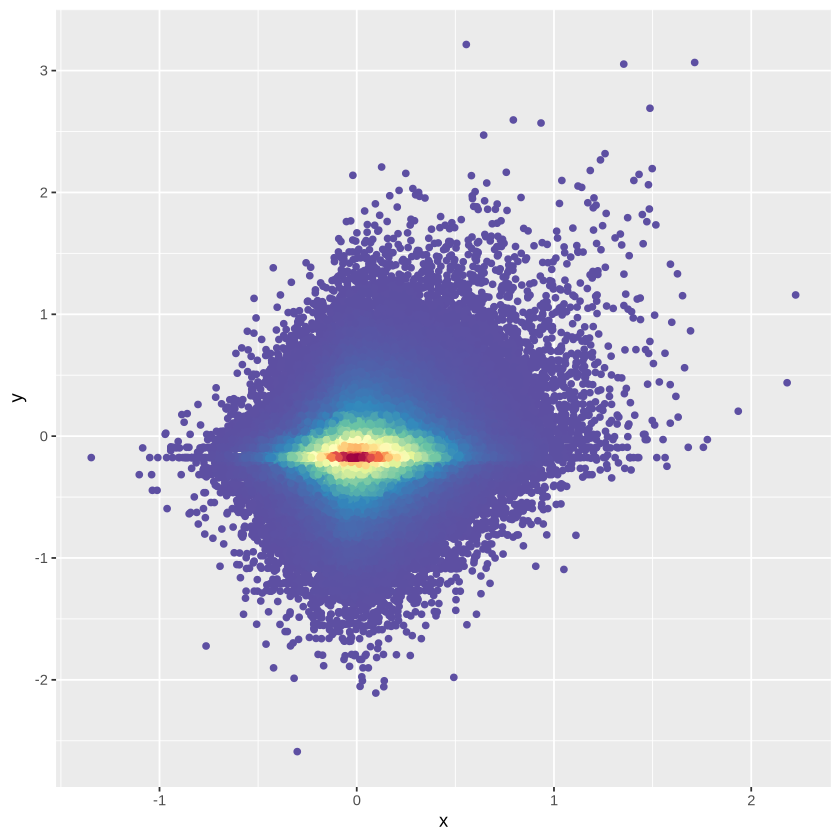

In [49]:
## Supplementary Figure 14c

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-14c.CAPRA-Solo-Double-Scatter.1.txt")
df = data.frame(x = data$V6, y = data$V5, d = densCols(data$V5, data$V6, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d)) + geom_point() + scale_color_identity()

cor.test(data$V5, data$V6)


	Pearson's product-moment correlation

data:  data$V5 and data$V6
t = 12.603, df = 757, p-value < 2.2e-16
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3558267 0.4735726
sample estimates:
      cor 
0.4164444 


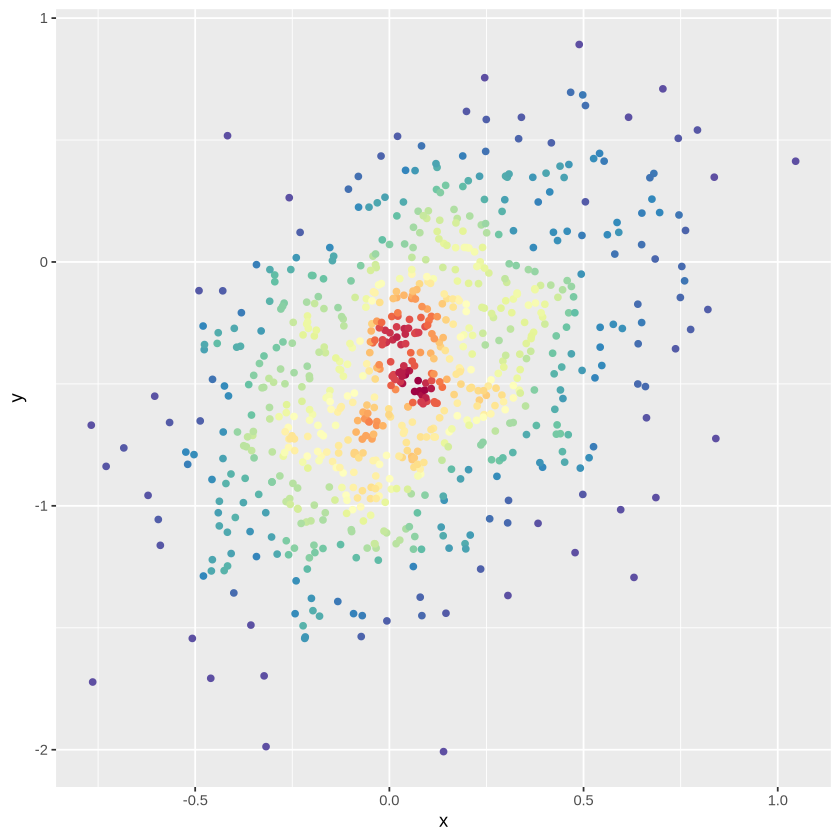

In [50]:
## Supplementary Figure 14d

data = read.table("2_Functional-Characterization/Figure-Input-Data/Supplementary-Figure-14d.CAPRA-Solo-Double-Scatter.10.txt")
df = data.frame(x = data$V6, y = data$V5, d = densCols(data$V5, data$V6, colramp = colorRampPalette(rev(brewer.pal(11, "Spectral")))))
ggplot(df, aes(x=x, y=y, color=d)) + geom_point() + scale_color_identity()

cor.test(data$V5, data$V6)

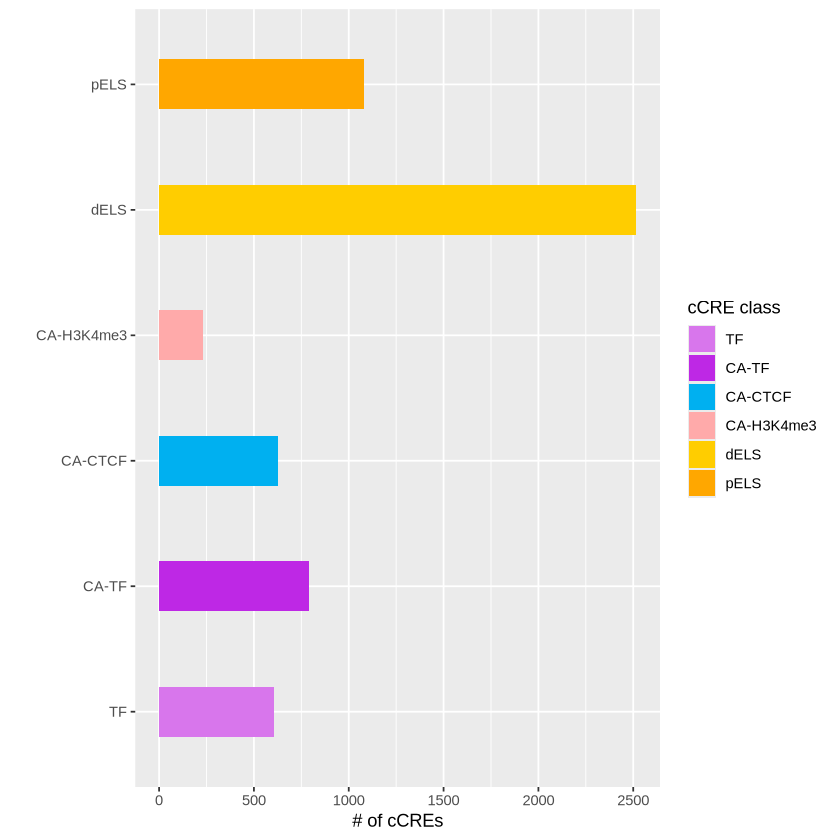

In [33]:
## Supplementary Figure 15a
data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-15ab.REST-cCRE-Class.txt")
data$V1= factor(data$V1,levels = rev(c("pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","TF")))
ggplot(data, aes(y=V1, x=V2, fill=V1))+geom_bar(stat="identity", width=0.4) + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#d876ec"))) +
    ylab("") + xlab("# of cCREs")


	Pearson's Chi-squared test

data:  data[, c(2, 3)]
X-squared = 8039.8, df = 5, p-value < 2.2e-16


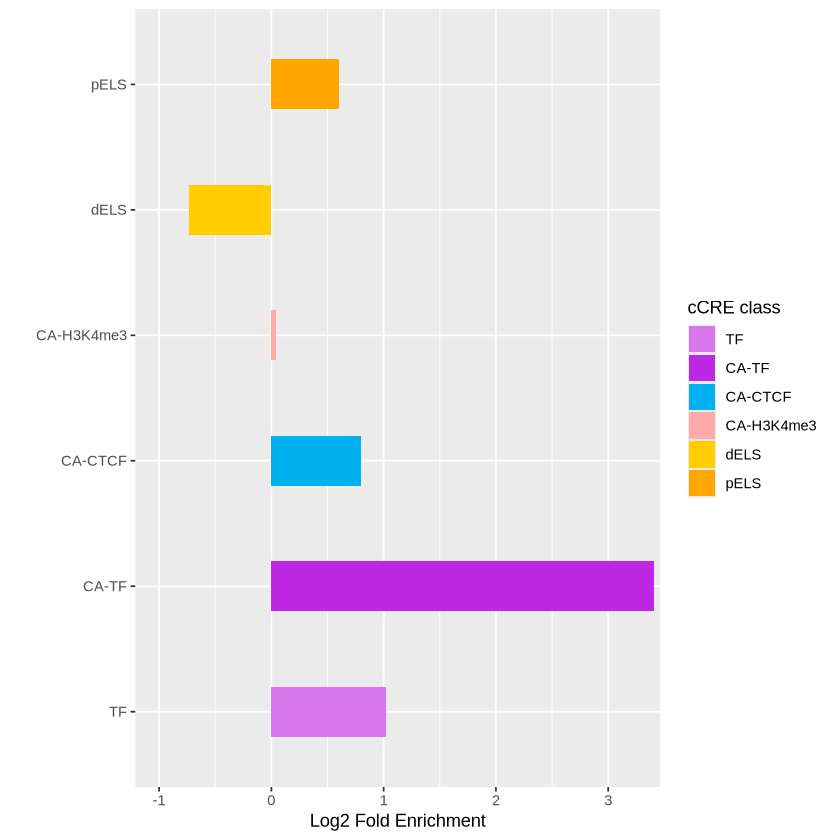

In [53]:
## Supplementary Figure 15b
data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-15ab.REST-cCRE-Class.txt")
data$V1= factor(data$V1,levels = rev(c("pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","TF")))
newData=data.frame(data$V1, data$V2/sum(data$V2), data$V3/sum(data$V3))
names(newData)=c("class","rest","all")

ggplot(newData, aes(y=class, x=log2(rest/all), fill=class))+geom_bar(stat="identity", width=0.4)  + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#d876ec"))) +
    ylab("") + xlab("Log2 Fold Enrichment") + coord_cartesian(x=c(-1,3.25))

chisq.test(data[,c(2,3)])

[1] "promoter 1"

[1] "proximal enhancer 0.667125731211953"

[1] "distal enhancer 0.824279809769682"

[1] "CA-H3K4me3 1"

[1] "CA-CTCF 1"

[1] "CA-TF 0.0011688198699956"

[1] "TF 1"

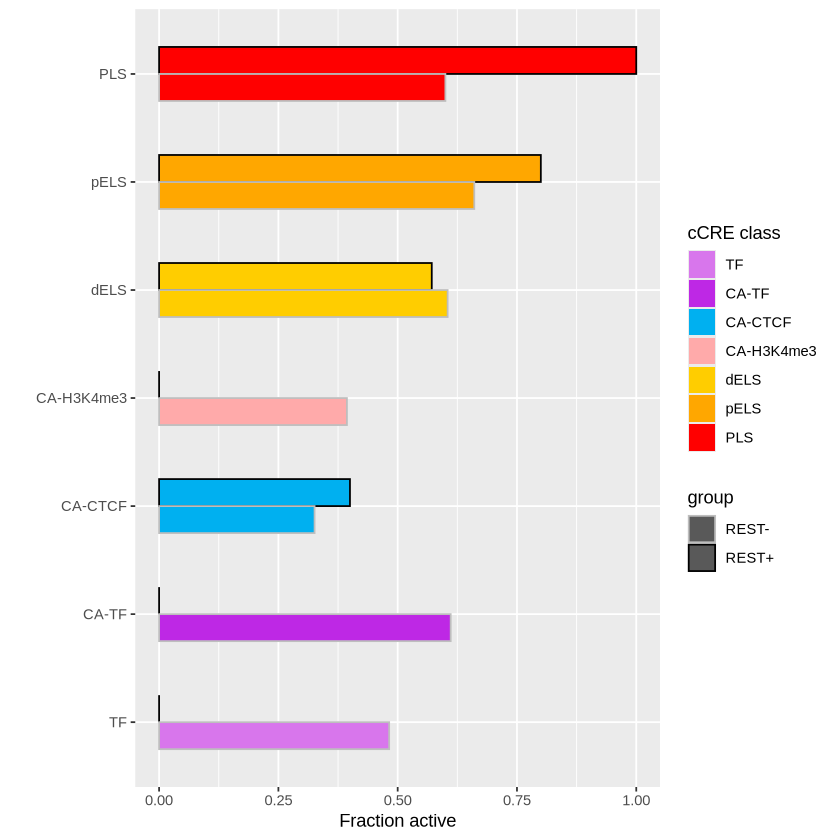

In [61]:
## Supplementary Figure 15c
data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-15c.REST-cCRE-VISTA-Overlap.txt")

data$V1= factor(data$V1,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","TF")))
ggplot(data, aes(y=V1, x=V4, fill=V1, color=V2)) + geom_bar(position="dodge",stat="identity", width=0.5) +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#d876ec"))) +
    scale_color_manual(name = "group", values=c("gray","black")) + xlab("Fraction active") + ylab("")

#Promoter
paste("promoter",fisher.test(data[c(1,2),c(3,5)])$p.value)

#Prox enhancer
paste("proximal enhancer",fisher.test(data[c(3,4),c(3,5)])$p.value)

#Distal enhancer
paste("distal enhancer",fisher.test(data[c(5,6),c(3,5)])$p.value)

#CA-H3K4me3
paste("CA-H3K4me3", fisher.test(data[c(7,8),c(3,5)])$p.value)

#CA-CTCF
paste("CA-CTCF", fisher.test(data[c(9,10),c(3,5)])$p.value)

#CA-TF
paste("CA-TF", fisher.test(data[c(11,12),c(3,5)])$p.value)

#TF
paste("TF", fisher.test(data[c(13,14),c(3,5)])$p.value)

[1] "promoter 2.90688337130309e-155"

[1] "prox enhancer 0.0233898491322989"

[1] "distal enhancer 6.15791667709769e-52"

[1] "CA-H3K4me3 6.45386611927508e-25"

[1] "CA-CTCF 1.59595075523608e-100"

[1] "CA-TF 2.900430993036e-149"

[1] "TF 3.89304837203158e-27"

Group.1,x
<chr>,<dbl>
CA-CTCF REST-,-0.037105621
CA-CTCF REST+,-0.346191281
CA-H3K4me3 REST-,-0.015225718
CA-H3K4me3 REST+,-0.249697859
CA-TF REST-,-0.016536709
CA-TF REST+,-0.400993358
dELS REST-,-0.012823901
dELS REST+,-0.095026471
pELS REST-,0.006825702


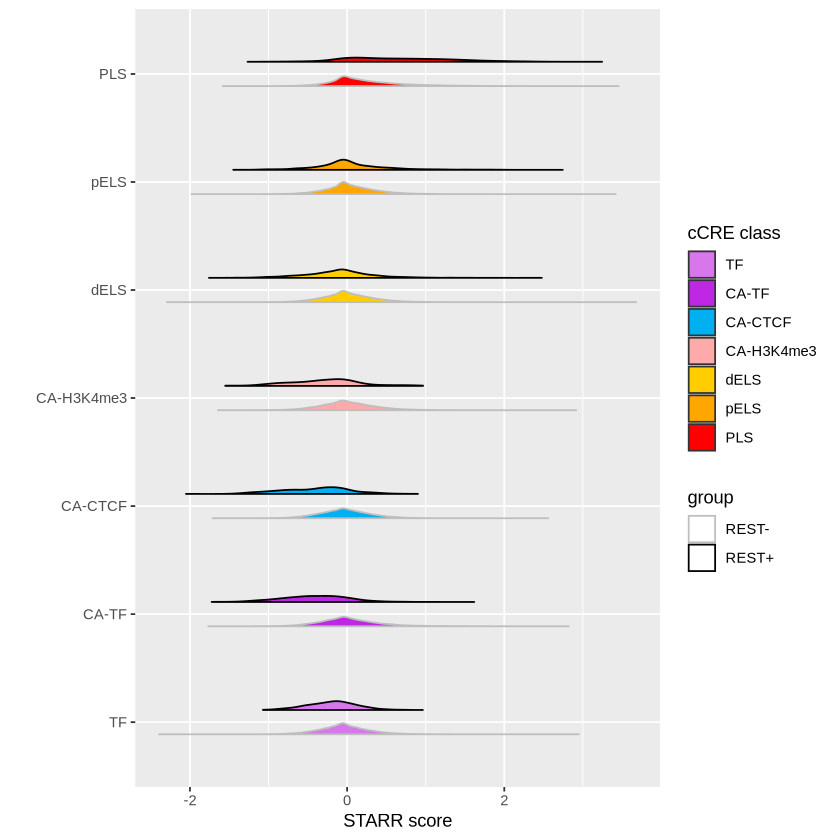

In [72]:
## Supplementary Figure 15d

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-15d.REST-cCRE-STARR-Scores.txt")
data$V3= factor(data$V3,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","TF")))
ggplot(data, aes(x=V3, fill=V3, color=V4, y=V2)) + geom_violinhalf() + coord_flip() +
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#d876ec"))) +
    scale_color_manual(name = "group", values=c("gray","black")) + xlab("") + ylab("STARR score")

miniData=data[data$V3 == "PLS",]
paste("promoter",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "pELS",]
paste("prox enhancer",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "dELS",]
paste("distal enhancer",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "CA-H3K4me3",]
paste("CA-H3K4me3",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "CA-CTCF",]
paste("CA-CTCF",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "CA-TF",]
paste("CA-TF",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])

miniData=data[data$V3 == "TF",]
paste("TF",pairwise.wilcox.test(miniData$V2, miniData$V4)$p.value[1])


aggregate(data$V2, list(paste(data$V3, data$V4)), FUN=median) 


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

               K562-PLS K562-pELS K562-dELS K562-Inactive PLS     pELS   
K562-pELS      < 2e-16  -         -         -             -       -      
K562-dELS      < 2e-16  < 2e-16   -         -             -       -      
K562-Inactive  < 2e-16  < 2e-16   < 2e-16   -             -       -      
PLS            < 2e-16  0.00023   < 2e-16   < 2e-16       -       -      
pELS           < 2e-16  < 2e-16   4.7e-13   0.00276       < 2e-16 -      
dELS           < 2e-16  < 2e-16   < 2e-16   4.8e-05       < 2e-16 2.2e-08
CA-H3K4me3     < 2e-16  < 2e-16   < 2e-16   2.8e-13       < 2e-16 < 2e-16
CA-CTCF        < 2e-16  < 2e-16   < 2e-16   < 2e-16       < 2e-16 < 2e-16
CA-TF          < 2e-16  < 2e-16   < 2e-16   < 2e-16       < 2e-16 < 2e-16
TF             < 2e-16  < 2e-16   < 2e-16   1.2e-10       < 2e-16 2.9e-14
REST-Enhancers < 2e-16  < 2e-16   < 2e-16   3.2e-05       < 2e-16 1.7e-08
RE

Group.1,x
<fct>,<dbl>
K562-PLS,11.700
K562-pELS,13.845
K562-dELS,8.940
K562-Inactive,2.400
PLS,16.800
pELS,4.055
dELS,0.685
CA-H3K4me3,0.060
CA-CTCF,0.080


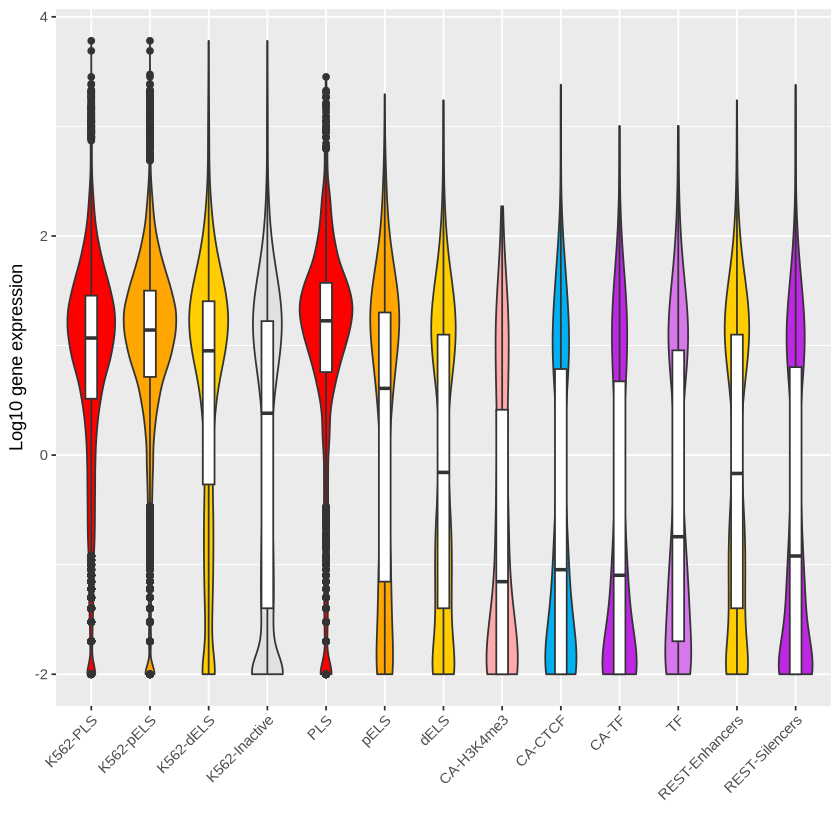

In [75]:
## Supplementary Figure 15e

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-15e.REST-Silencer-Gene-Expression.txt")
data$V3= factor(data$V3,levels = c("K562-PLS","K562-pELS","K562-dELS","K562-Inactive","PLS","pELS","dELS","CA-H3K4me3",
                                   "CA-CTCF","CA-TF","TF", "REST-Enhancers","REST-Silencers"))
ggplot(data, aes(x=V3, y=log10(V2+0.01), fill=V3)) + geom_violin() + geom_boxplot(fill="white",width=0.2) + 
    theme(legend.position = "none", axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_fill_manual(name = "cCRE class", values=c("#FF0000", "#FFA700", "#FFCD00","#e1e1e1",
    "#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#d876ec", "#FFCD00", "#be28e5")) +
    ylab("Log10 gene expression") + xlab("")

pairwise.wilcox.test(data$V2, data$V3, padj="fdr")

aggregate(data$V2, list(data$V3), FUN=median) 

[1] -0.75

[1] -0.51

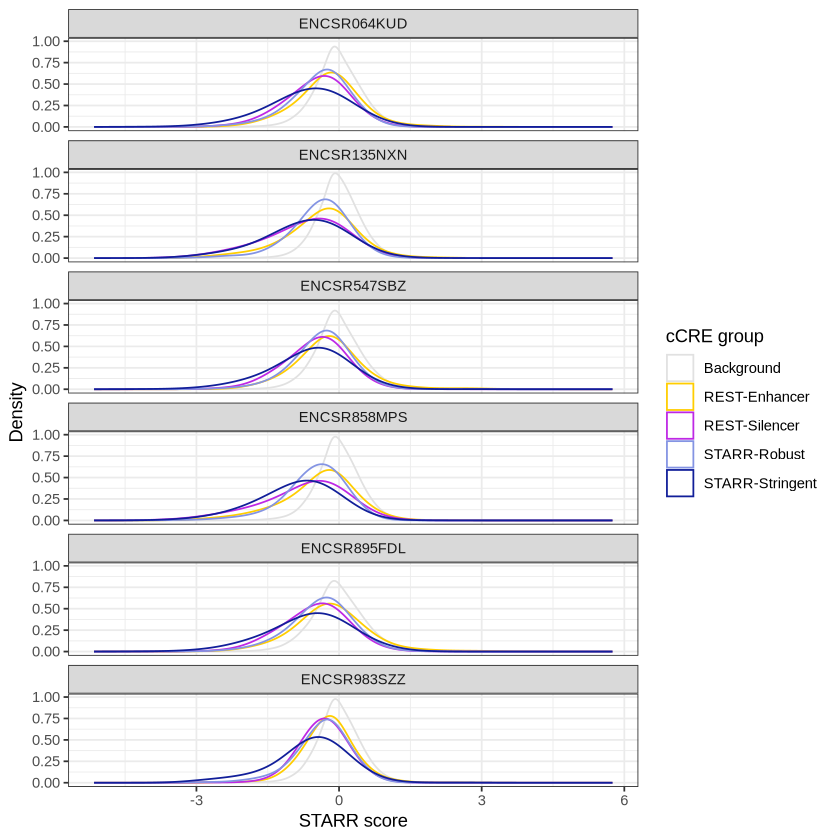

In [42]:
## Supplementary Figure 16a

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-16a.STARR-Silencer-Cross-Cell.txt")

ggplot(data, aes(x=V2, color=V3)) + geom_density(adjust=3) + facet_wrap(~ V4, ncol=1) +
    scale_color_manual(name="cCRE group", values=c("#e1e1e1","#FFCD00","#be28e5","#8494e3","#111e99")) +
    xlab("STARR score") + ylab("Density") + theme_bw()

#pairwise.wilcox.test(data$V2, paste(data$V3,data$V4), p.adj="fdr")
miniData=data[data$V3 == "STARR-Stringent",]
m=aggregate(miniData$V2, list(miniData$V4), FUN=median)
round(min(m$x),2)
round(max(m$x),2)

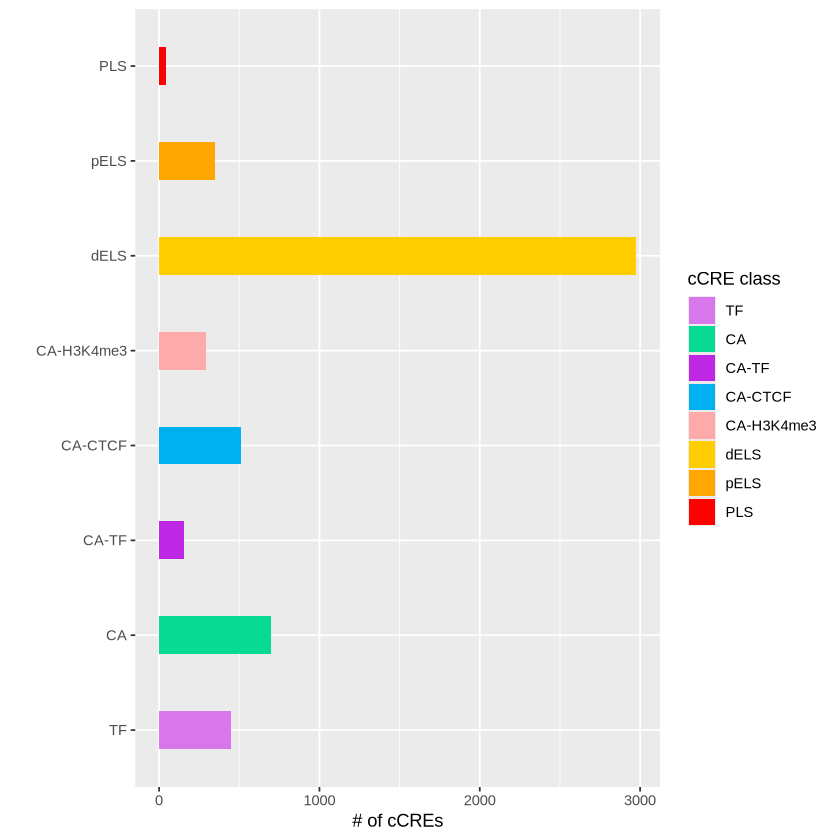

In [78]:
## Supplementary Figure 16b

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-16bc.STARR-Silencer-cCRE-Class.txt")

data$V1= factor(data$V1,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF")))
ggplot(data, aes(y=V1, x=V2, fill=V1))+geom_bar(stat="identity", width=0.4) + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec"))) +
    ylab("") + xlab("# of cCREs")


	Pearson's Chi-squared test

data:  data[, c(2, 3)]
X-squared = 754.12, df = 7, p-value < 2.2e-16


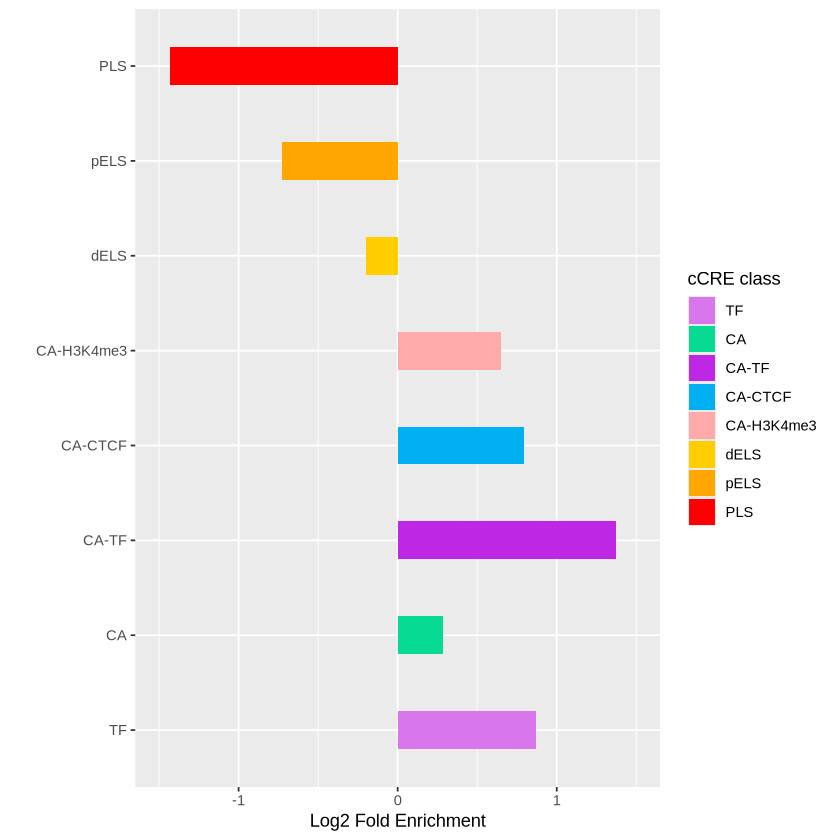

In [79]:
## Supplementary Figure 16b

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-16bc.STARR-Silencer-cCRE-Class.txt")
data$V1= factor(data$V1,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF")))

newData=data.frame(data$V1, data$V2/sum(data$V2), data$V3/sum(data$V3))
names(newData)=c("class","silencer","all")

ggplot(newData, aes(y=class, x=log2(silencer/all), fill=class))+geom_bar(stat="identity", width=0.4)  + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec"))) +
    ylab("") + xlab("Log2 Fold Enrichment") + coord_cartesian(x=c(-1.5,1.5))

chisq.test(data[,c(2,3)])


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

                          K562-PLS K562-pELS K562-dELS K562-Inactive
K562-pELS                 < 2e-16  -         -         -            
K562-dELS                 < 2e-16  < 2e-16   -         -            
K562-Inactive             < 2e-16  < 2e-16   < 2e-16   -            
STARR-Silencers.Stringent < 2e-16  < 2e-16   < 2e-16   0.00095      
STARR-Silencers.Robust    < 2e-16  < 2e-16   < 2e-16   0.00095      
                          STARR-Silencers.Stringent
K562-pELS                 -                        
K562-dELS                 -                        
K562-Inactive             -                        
STARR-Silencers.Stringent -                        
STARR-Silencers.Robust    0.04419                  

P value adjustment method: fdr 

Group.1,x
<fct>,<dbl>
K562-PLS,11.700
K562-pELS,13.845
K562-dELS,8.940
K562-Inactive,2.400
STARR-Silencers.Stringent,0.490
STARR-Silencers.Robust,1.380


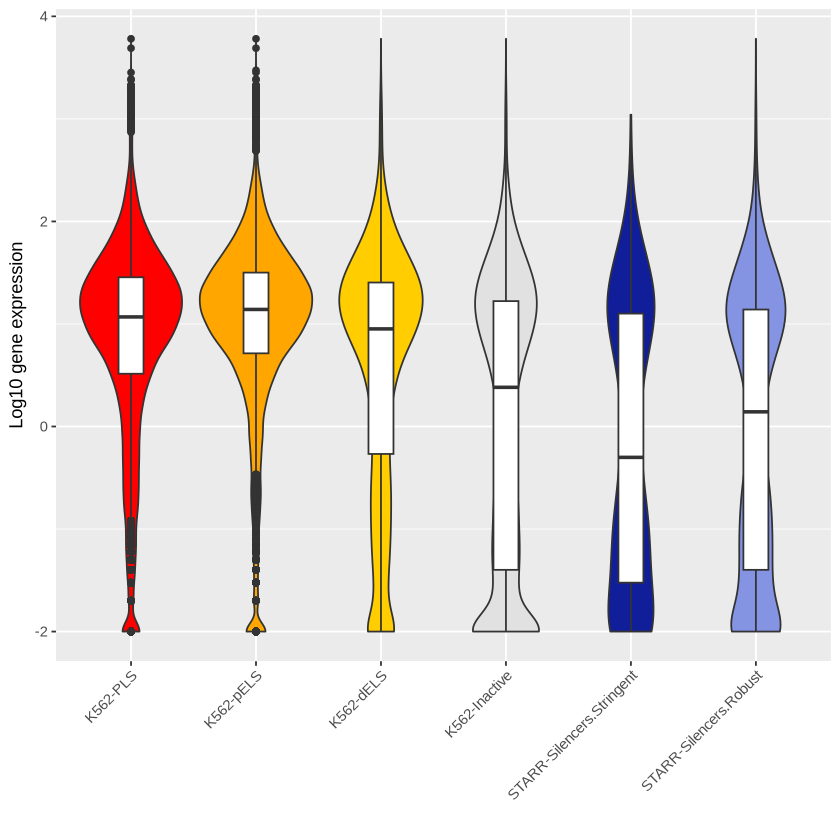

In [80]:
## Supplementary Figure 16e

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-16e.STARR-Silencer-Gene-Expression.txt")
data$V3= factor(data$V3,levels = c("K562-PLS","K562-pELS","K562-dELS","K562-Inactive","STARR-Silencers.Stringent","STARR-Silencers.Robust"))
ggplot(data, aes(x=V3, y=log10(V2+0.01), fill=V3)) + geom_violin() + geom_boxplot(fill="white",width=0.2) + 
    theme(legend.position = "none", axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) +
    scale_fill_manual(name = "cCRE class", values=c("#FF0000", "#FFA700", "#FFCD00","#e1e1e1","#111e99","#8494e3")) +
    ylab("Log10 gene expression") + xlab("")

pairwise.wilcox.test(data$V2, data$V3, p.adj="fdr")

aggregate(data$V2, list(data$V3), FUN=median) 

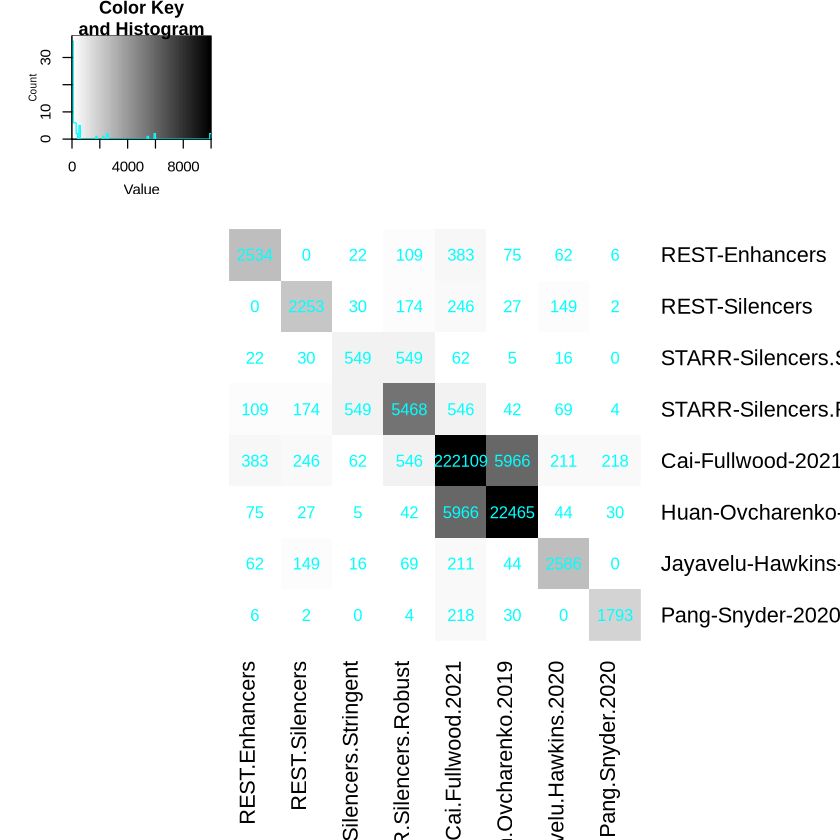

In [49]:
## Supplementary Figure 18a

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-18a.Published-Silencer-Overlap.txt", header=T, row.names=1)
colors=colorRampPalette(c("white","black"))(100)
heatmap.2(data.matrix(data), col=colors, breaks=seq(0,10000,100), trace="none", cellnote=data, Rowv="NA", Colv="NA", 
    dendrogram="none", margins=c(10,10))


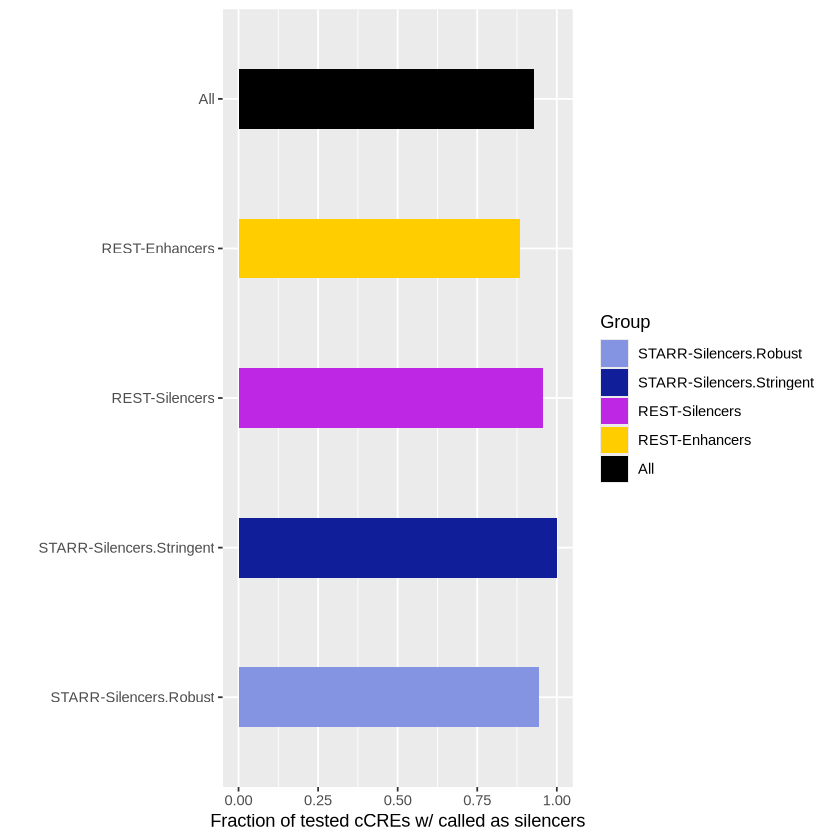

In [32]:
## Supplementary Figure 18b

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-18bc.Previous-Silencer-Comparison.txt")
data$V1= factor(data$V1,levels = rev(c("All","REST-Enhancers","REST-Silencers","STARR-Silencers.Stringent","STARR-Silencers.Robust")))

ggplot(data, aes(y=V1, x=V5, fill=V1)) + geom_bar(stat="identity", width=0.4) + 
    scale_fill_manual(name="Group",values=rev(c("black","#FFCD00","#be28e5","#111e99","#8494e3"))) +
    xlab("Fraction of tested cCREs w/ called as silencers") + ylab("")


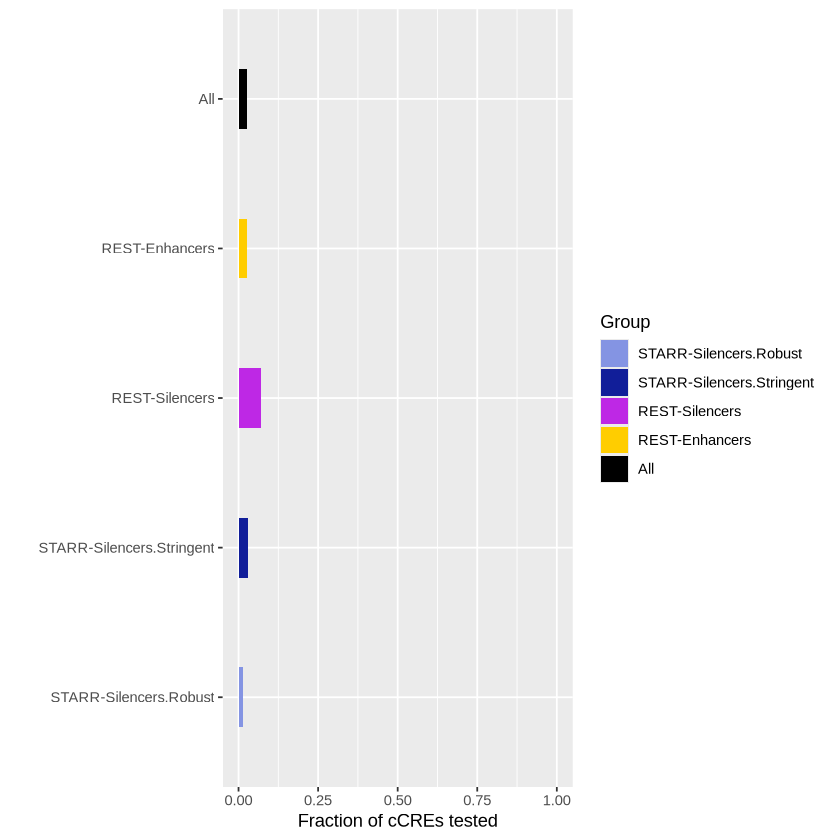

In [33]:
## Supplementary Figure 18c

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-18bc.Previous-Silencer-Comparison.txt")
data$V1= factor(data$V1,levels = rev(c("All","REST-Enhancers","REST-Silencers","STARR-Silencers.Stringent","STARR-Silencers.Robust")))

ggplot(data, aes(y=V1, x=V6, fill=V1)) + geom_bar(stat="identity", width=0.4) + 
    scale_fill_manual(name="Group",values=rev(c("black","#FFCD00","#be28e5","#111e99","#8494e3"))) +
    xlab("Fraction of cCREs tested") + ylab("") + coord_cartesian(x=c(0,1))


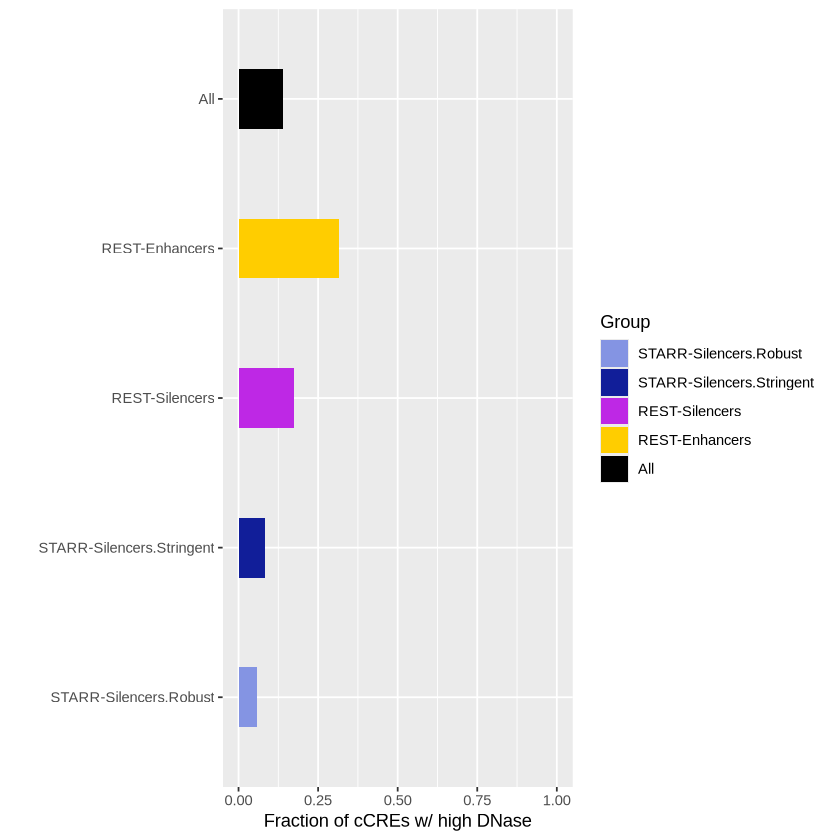

In [31]:
## Supplementary Figure 18d

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-18d.Silencer-High-DNase.txt")
data$V1= factor(data$V1,levels = rev(c("All","REST-Enhancers","REST-Silencers","STARR-Silencers.Stringent","STARR-Silencers.Robust")))

ggplot(data, aes(y=V1, x=V4, fill=V1)) + geom_bar(stat="identity", width=0.4) + 
    scale_fill_manual(name="Group",values=rev(c("black","#FFCD00","#be28e5","#111e99","#8494e3"))) +
    xlab("Fraction of cCREs w/ high DNase") + ylab("") + coord_cartesian(x=c(0,1))

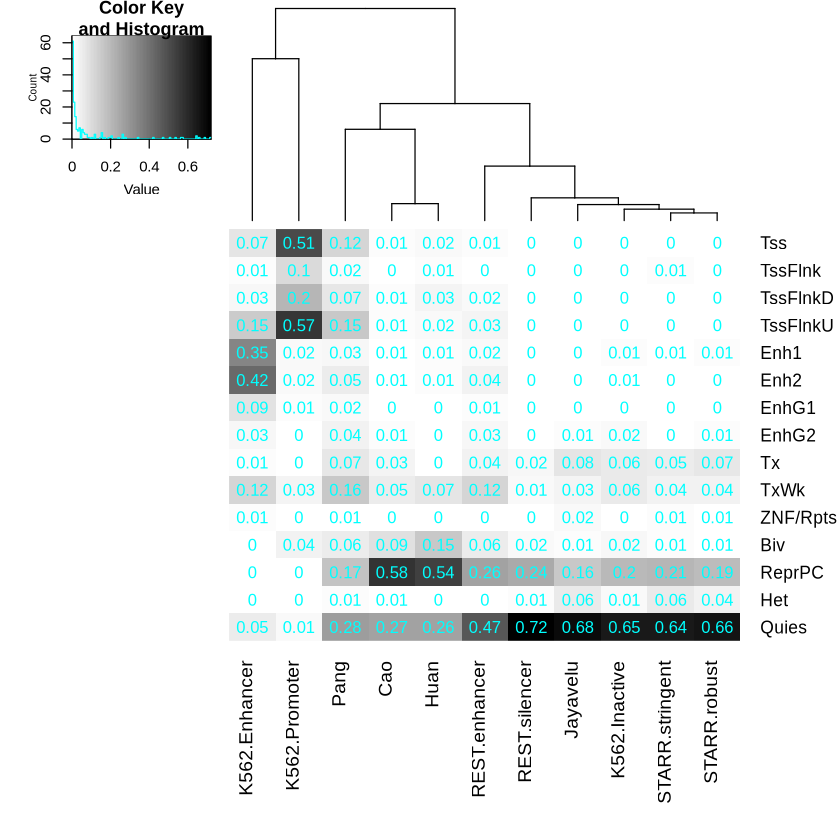

In [51]:
## Supplementary Figure 18e

data = read.table("3_Silencers/Figure-Input-Data/Supplementary-Figure-18e.ChromHMM-Overlap-Heatmap.txt", header=T, row.names=1)
newData = data[c(9,10,11,12,2,3,4,5,13,14,15,1,8,6,7),]

colors=colorRampPalette(c("white","black"))(100)
heatmap.2(data.matrix(newData), col=colors, trace="none", cellnote=round(newData,2), dendrogram="column", Rowv="NA", margins=c(10,5))

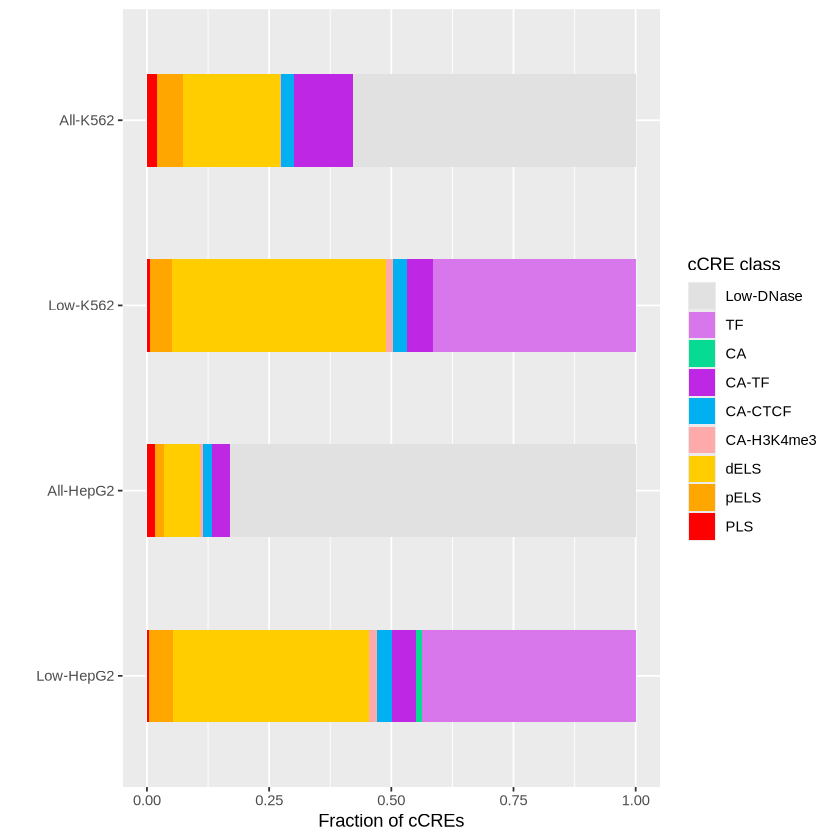

In [12]:
## Supplementary Figure 19abcd

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-19abcd.MAFF-MAFK-cCRE-Classification.txt")

data$V2=factor(data$V2,levels = rev(c("PLS","pELS","dELS","CA-H3K4me3","CA-CTCF","CA-TF","CA","TF","Low-DNase")))
data$V1=factor(data$V1,levels = rev(c("All-K562","Low-K562","All-HepG2","Low-HepG2")))
ggplot(data, aes(x=V3, y=V1, fill=V2)) + geom_bar(stat="identity", position="fill", width=0.5) + 
    scale_fill_manual(name = "cCRE class", values=rev(c("#FF0000", "#FFA700", "#FFCD00", "#ffaaaa", "#00B0F0", "#be28e5", "#06DA93","#d876ec", "#e1e1e1"))) +
    xlab("Fraction of cCREs") + ylab("")

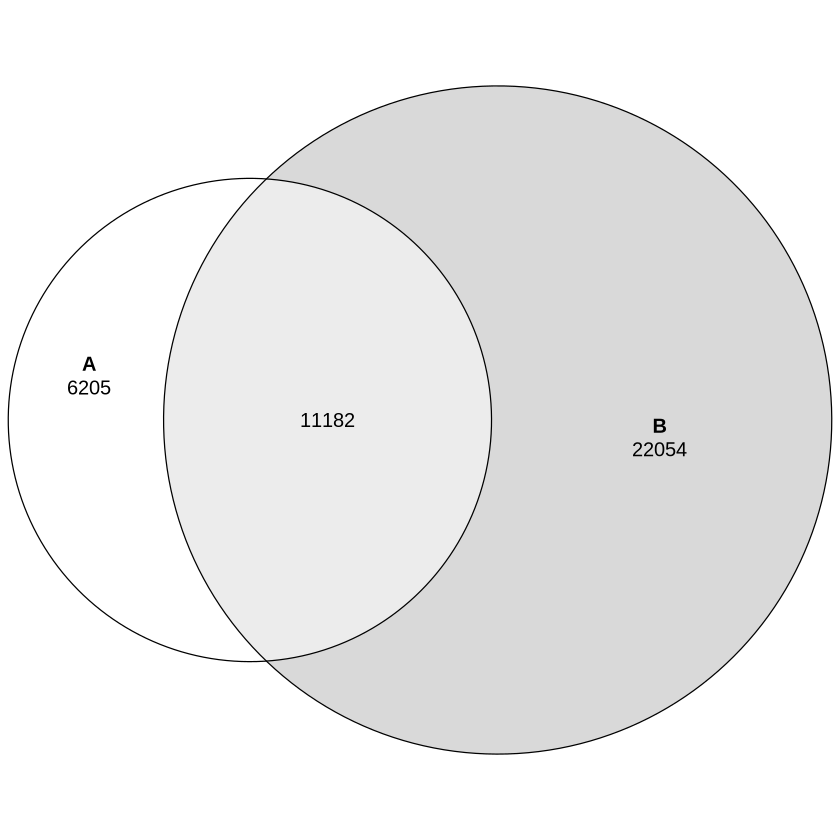

In [2]:
## Supplementary Figure 19e

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-19ef.MAFF-MAFK-cCRE-Overlap.txt", row.names=1)

A=data[1,1]-data[1,3]
B=data[1,2]-data[1,3]
C=data[1,3]
s2 = c(A = A, B = B, "A&B" = C)
plot(euler(s2), quantities = TRUE)

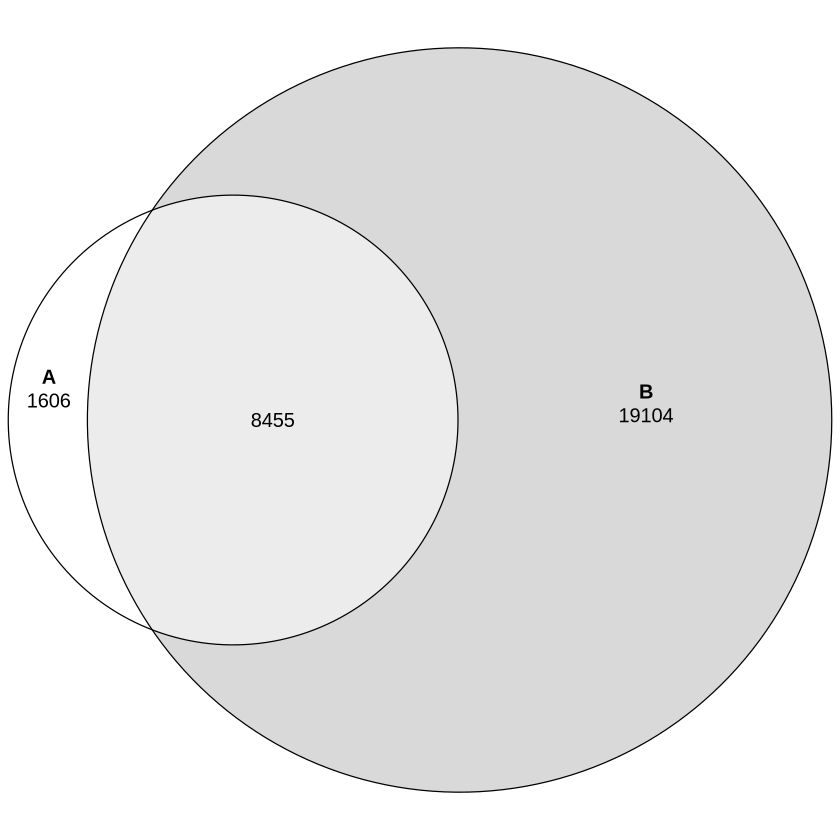

In [3]:
## Supplementary Figure 19f

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-19ef.MAFF-MAFK-cCRE-Overlap.txt", row.names=1)
A=data[2,1]-data[2,3]
B=data[2,2]-data[2,3]
C=data[2,3]
s2 = c(A = A, B = B, "A&B" = C)
plot(euler(s2), quantities = TRUE)


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

          Background
MAFF-MAFK 0.11      

P value adjustment method: holm 

Group.1,x
<chr>,<dbl>
Background,-0.01782869
MAFF-MAFK,-0.02231806


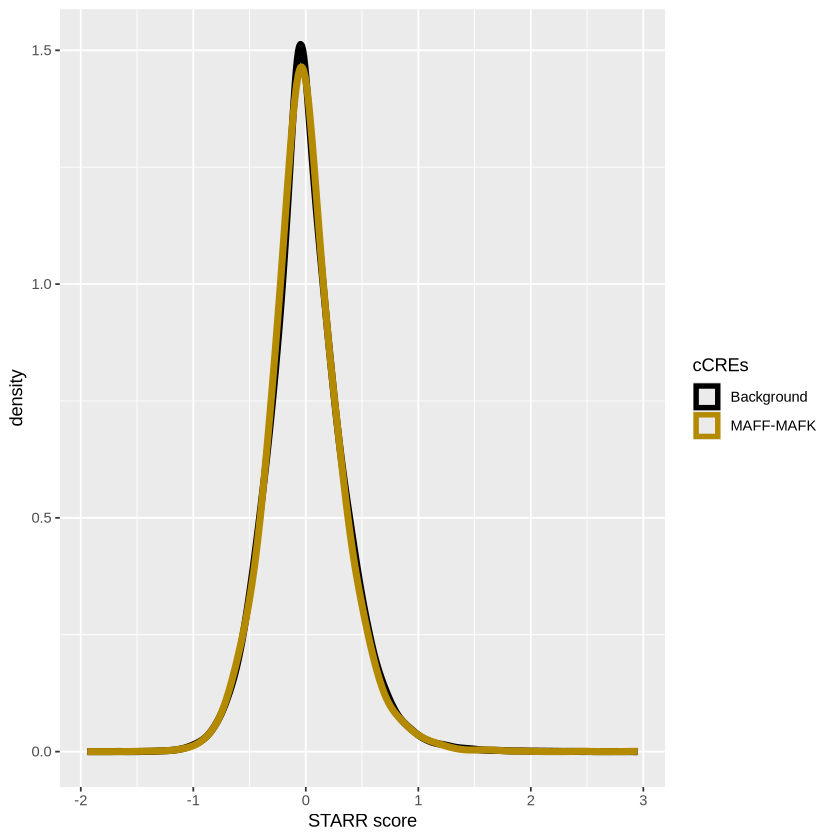

In [17]:
## Supplementary Figure 19g

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-19g.MAFF-MAFK-STARR-Scores.txt")

ggplot(data, aes(x=V2, color=V3)) + geom_density(adjust=2, linewidth=2) + 
    scale_color_manual(name="cCREs",values=c("black","#b48a00")) + xlab("STARR score")

pairwise.wilcox.test(data$V2, data$V3)

aggregate(data$V2, list(data$V3), FUN=median) 


	Pairwise comparisons using Wilcoxon rank sum test with continuity correction 

data:  data$V2 and data$V3 

                      MAFF-MAFK.Common-Low-DNase
K562.Low-DNase-No-MAF 0.00069                   

P value adjustment method: holm 

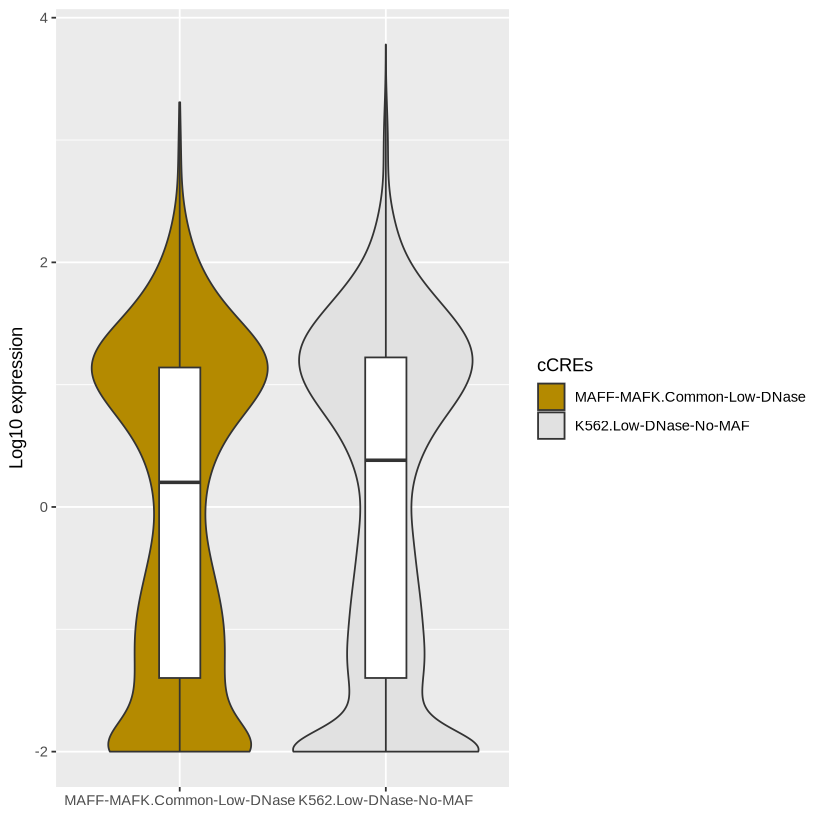

In [81]:
## Supplementary Figure 19h

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-19h.MAFF-MAFK-Gene-Expression.txt")
data$V3= factor(data$V3,levels = c("MAFF-MAFK.Common-Low-DNase","K562.Low-DNase-No-MAF"))

ggplot(data, aes(x=V3, y=log10(V2+0.01), fill=V3)) + geom_violin() + geom_boxplot(fill="white", width=0.2) +
    scale_fill_manual(name="cCREs",values = c("#b48a00","#e1e1e1")) + ylab("Log10 expression") + xlab("")

pairwise.wilcox.test(data$V2, data$V3)

Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_point()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range (`geom_text()`).”


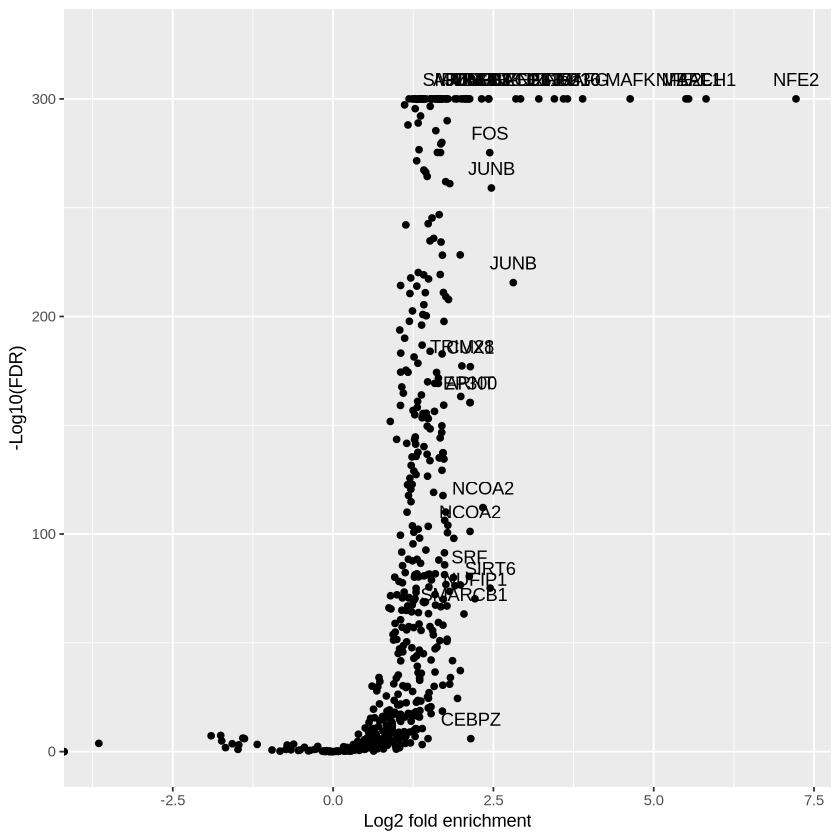

In [52]:
## Supplementary Figure 20b

data = read.table("4_MAFF-MAFK/Figure-Input-Data/Supplementary-Figure-20b.MAFF-MAFK-TF-enrichment.txt")

fc=log2((data$V2/data$V3)/(data$V4/data$V5))
high=data[fc > 2,]
highfc=fc[fc > 2]

ggplot(data,aes(x=fc, y=-log10(V7+1E-300), label=V1)) + 
    geom_point()+ geom_text(data=high, aes(x=highfc, y=-log10(V7+1E-300)), vjust=-1) + 
    coord_cartesian(y=c(0,325)) + ylab("-Log10(FDR)") + xlab("Log2 fold enrichment")